In [10]:
# Data manipulation
# ==============================================================================
import pandas as pd
import numpy as np
from skforecast.datasets import fetch_dataset


# Plots
# ==============================================================================
import matplotlib.pyplot as plt

# Modelling and Forecasting
# ==============================================================================
from lightgbm import LGBMRegressor
from skforecast.recursive import ForecasterRecursiveMultiSeries
from skforecast.model_selection import (
    TimeSeriesFold,
    backtesting_forecaster_multiseries,
    grid_search_forecaster_multiseries
)

# Warnings configuration
# ==============================================================================
import warnings
warnings.filterwarnings('once')

In [11]:
data = pd.read_excel("./results/df_complete.xlsx")
data = data.rename(columns={"SKU": "series_id"})
data = data.rename(columns={"week": "timestamp"})
data['timestamp'] = pd.to_datetime(data['timestamp'])
if 'timestamp' in data.columns:
    data.insert(0, 'timestamp', data.pop('timestamp'))
data

,timestamp,series_id,Brand,MFG Class,Resource ID,ADD
0,2024-07-03,12000210,ARC ROYAL,O01,EM_O01_NL,9.85
1,2024-07-03,12000235,ARC ROYAL,O01,EM_O01_NL,0.76
2,2024-07-03,12000236,ARC ROYAL,O01,EM_O01_NL,9.09
3,2024-07-03,12000237,ARC ROYAL,O02,EM_O02_NL,1.52
4,2024-07-03,12000249,ARC ROYAL,O02,EM_O02_NL,2.65
...,...,...,...,...,...,...
244468,2025-07-30,ZE-6-120,IKAZUCHI ZERO,O84,EM_O84_NL_CN,1.31
244469,2025-07-30,ZE-6-200,IKAZUCHI ZERO,O84,EM_O84_NL_CN,0.08
244470,2025-07-30,ZE-6-250,IKAZUCHI ZERO,O84,EM_O84_NL_CN,0.00
244471,2025-07-30,ZE-8-100P,IKAZUCHI ZERO,O84,EM_O84_NL_CN,9.87


In [12]:
df_complete = pd.read_excel("./results/df_features.xlsx")
df2 = df_complete[['SKU','week','ADD','sin_week','cos_week','week_number']].copy()
df2 = df2.rename(columns={"SKU": "series_id"})
df2 = df2.rename(columns={"week": "timestamp"})
df2

,series_id,timestamp,ADD,sin_week,cos_week,week_number
0,12000210,2024-07-03,9.85,-0.120537,-0.992709,1
1,12000210,2024-07-10,9.09,-0.239316,-0.970942,2
2,12000210,2024-07-17,8.71,-0.354605,-0.935016,3
3,12000210,2024-07-24,8.71,-0.464723,-0.885456,4
4,12000210,2024-07-31,8.71,-0.568065,-0.822984,5
...,...,...,...,...,...,...
244468,ZE-8-120,2025-07-02,2.02,-0.120537,-0.992709,53
244469,ZE-8-120,2025-07-09,2.03,-0.239316,-0.970942,54
244470,ZE-8-120,2025-07-16,2.06,-0.354605,-0.935016,55
244471,ZE-8-120,2025-07-23,2.27,-0.464723,-0.885456,56


### Check Brand, Resource ID and series_id: search for duplicates and Nan

In [4]:
base = data[['Brand','Resource ID','series_id']]
n0 = len(base)
n_non_null = len(base.dropna())
n_unique_triples = len(base.dropna().drop_duplicates())

print("Filas totales:", n0)
print("Sin NA:", n_non_null)
print("Tripletas únicas (Brand, Resource ID, series_id):", n_unique_triples)
print("Eliminadas por NA:", n0 - n_non_null)
print("Duplicados exactos eliminados:", n_non_null - n_unique_triples)

Filas totales: 244473
Sin NA: 243846
Tripletas únicas (Brand, Resource ID, series_id): 4278
Eliminadas por NA: 627
Duplicados exactos eliminados: 239568


Hay 11 SKUS que no tienen ResourceID (esta en blanco) lo que da lugar a 627 NaN en el df completo.

Se completan con la info aportada a posteriori

In [13]:
skus_nan = (features_py.loc[features_py['Resource ID'].isna(), 'series_id']
              .dropna()
              .unique())

print(f"SKUs a eliminar (Resource ID NaN): {len(skus_nan)}")

SKUs a eliminar (Resource ID NaN): 0


In [14]:
data.loc[data['Resource ID'].isna(), 'Resource ID'] = 'EM_O92'
data.loc[data['MFG Class'].isna(), 'MFG Class'] = 'O92'

print("Filas restantes:", len(data))
print("Resource ID NaN restantes:", data['Resource ID'].isna().sum())

Filas restantes: 244473
Resource ID NaN restantes: 0


In [6]:
left_cols  = ["timestamp","series_id","Brand","Resource ID","ADD"]
right_cols = ["series_id","timestamp","sin_week","cos_week","week_number"]

features_py = (data[left_cols]
        .merge(df2[right_cols],
               on=["series_id","timestamp"],
               how="inner",
               validate="one_to_one")   # cambia a "many_to_one" si hay duplicados
        .loc[:, ["timestamp","series_id","Brand","Resource ID","ADD",
                 "sin_week","cos_week","week_number"]]
        .sort_values(["series_id","timestamp"])
        .reset_index(drop=True)
     )
features_py = (features_py
      .sort_values(["timestamp", "series_id"], ascending=[True, True], kind="mergesort")
      .reset_index(drop=True)
)
features_py

,timestamp,series_id,Brand,Resource ID,ADD,sin_week,cos_week,week_number
0,2024-07-03,12000210,ARC ROYAL,EM_O01_NL,9.85,-0.120537,-0.992709,1
1,2024-07-03,12000235,ARC ROYAL,EM_O01_NL,0.76,-0.120537,-0.992709,1
2,2024-07-03,12000236,ARC ROYAL,EM_O01_NL,9.09,-0.120537,-0.992709,1
3,2024-07-03,12000237,ARC ROYAL,EM_O02_NL,1.52,-0.120537,-0.992709,1
4,2024-07-03,12000249,ARC ROYAL,EM_O02_NL,2.65,-0.120537,-0.992709,1
...,...,...,...,...,...,...,...,...
244468,2025-07-30,ZE-6-120,IKAZUCHI ZERO,EM_O84_NL_CN,1.31,-0.568065,-0.822984,57
244469,2025-07-30,ZE-6-200,IKAZUCHI ZERO,EM_O84_NL_CN,0.08,-0.568065,-0.822984,57
244470,2025-07-30,ZE-6-250,IKAZUCHI ZERO,EM_O84_NL_CN,0.00,-0.568065,-0.822984,57
244471,2025-07-30,ZE-8-100P,IKAZUCHI ZERO,EM_O84_NL_CN,9.87,-0.568065,-0.822984,57


In [8]:
features_py.to_excel("./results/features_py.xlsx", index=False)

In [12]:
filter = features_py[features_py['Brand'] == 'BriteCross Support Catheters']
filter

,timestamp,series_id,Brand,Resource ID,ADD,sin_week,cos_week,week_number
2631,2024-07-03,BC14150,BriteCross Support Catheters,EM_O92,0.0,-0.120537,-0.992709,1
2632,2024-07-03,BC14200,BriteCross Support Catheters,EM_O92,0.0,-0.120537,-0.992709,1
2633,2024-07-03,BC14650,BriteCross Support Catheters,EM_O92,0.0,-0.120537,-0.992709,1
2634,2024-07-03,BC14900,BriteCross Support Catheters,EM_O92,0.0,-0.120537,-0.992709,1
2635,2024-07-03,BC18150,BriteCross Support Catheters,EM_O92,0.0,-0.120537,-0.992709,1
...,...,...,...,...,...,...,...,...
242821,2025-07-30,BC18650,BriteCross Support Catheters,EM_O92,0.0,-0.568065,-0.822984,57
242822,2025-07-30,BC18900,BriteCross Support Catheters,EM_O92,0.0,-0.568065,-0.822984,57
242823,2025-07-30,BC35135,BriteCross Support Catheters,EM_O92,0.0,-0.568065,-0.822984,57
242824,2025-07-30,BC35190,BriteCross Support Catheters,EM_O92,0.0,-0.568065,-0.822984,57


### % SPLIT

- n_skus: numero de skus que corresponden a una agrupacion unica de Brand - Resource ID
- ADD_rec: Suma de ADD de los skus de la anterior agrupacion, es decir, de los skus de un mismo recurso dentro de una brand.
- ADD_brand: Suma de ADD_sum por cada Brand
- split_pct: Porcentaje que representa ADD_sum sobre el total de ADD_brand, es decir, el procentaje de ADD asignado a cada recurso dentro de una misma Brand.

In [15]:
def add_resource_split_pct(
    df: pd.DataFrame,
    demand_col: str = "ADD",
    time_col: str = "timestamp",
    brand_col: str = "Brand",
    resource_col: str = "Resource ID",
    out_add_rec: str = "ADD_rec",
    out_brand: str = "ADD_brand",
    out_pct: str = "split_pct",
    pct_multiplier: float = 100.0,
) -> pd.DataFrame:
   
    out = df.copy()

    # 1) Total por recurso (timestamp, Brand, Resource ID)
    out[out_add_rec] = (
        out.groupby([time_col, brand_col, resource_col], dropna=False)[demand_col]
           .transform("sum")
    )

    # 2) Nivel recurso único para sumar por marca sin doble conteo
    res_level = (
        out[[time_col, brand_col, resource_col, out_add_rec]]
        .dropna(subset=[out_add_rec])
        .drop_duplicates(subset=[time_col, brand_col, resource_col])
    )

    # 3) Total de marca por timestamp
    brand_totals = (
        res_level.groupby([time_col, brand_col], as_index=False)[out_add_rec]
                 .sum()
                 .rename(columns={out_add_rec: out_brand})
    )

    # 4) Unir el total de marca a todas las filas de la misma marca/timestamp
    out = out.merge(brand_totals, on=[time_col, brand_col], how="left")

    # 5) Porcentaje de split del recurso dentro de la marca
    m_pos = out['ADD_brand'].gt(0)

    n_res = out.groupby(['timestamp', 'Brand'])['Resource ID'].transform('nunique')

    out[out_pct] = np.nan
    out.loc[m_pos, out_pct] = 100 * out.loc[m_pos, 'ADD_rec'] / out.loc[m_pos, 'ADD_brand']
    out.loc[~m_pos, out_pct] = 100.0 / n_res

    return out

df_full = add_resource_split_pct(data)
df_full

,timestamp,series_id,Brand,MFG Class,Resource ID,ADD,ADD_rec,ADD_brand,split_pct
0,2024-07-03,12000210,ARC ROYAL,O01,EM_O01_NL,9.85,25.38,114.54,22.158198
1,2024-07-03,12000235,ARC ROYAL,O01,EM_O01_NL,0.76,25.38,114.54,22.158198
2,2024-07-03,12000236,ARC ROYAL,O01,EM_O01_NL,9.09,25.38,114.54,22.158198
3,2024-07-03,12000237,ARC ROYAL,O02,EM_O02_NL,1.52,80.70,114.54,70.455736
4,2024-07-03,12000249,ARC ROYAL,O02,EM_O02_NL,2.65,80.70,114.54,70.455736
...,...,...,...,...,...,...,...,...,...
244468,2025-07-30,ZE-6-120,IKAZUCHI ZERO,O84,EM_O84_NL_CN,1.31,248.68,248.68,100.000000
244469,2025-07-30,ZE-6-200,IKAZUCHI ZERO,O84,EM_O84_NL_CN,0.08,248.68,248.68,100.000000
244470,2025-07-30,ZE-6-250,IKAZUCHI ZERO,O84,EM_O84_NL_CN,0.00,248.68,248.68,100.000000
244471,2025-07-30,ZE-8-100P,IKAZUCHI ZERO,O84,EM_O84_NL_CN,9.87,248.68,248.68,100.000000


In [7]:
mask = (df_full['Brand']=='FRONTRUNNER') & (df_full['timestamp']==pd.Timestamp('2025-07-30'))
print(df_full.loc[mask, ['Resource ID','ADD_rec', 'split_pct']].drop_duplicates())  
print(df_full.loc[mask, 'ADD_brand'].drop_duplicates())                

       Resource ID  ADD_rec  split_pct
243180         X00      0.0      100.0
243180    0.0
Name: ADD_brand, dtype: float64


In [16]:
d = pd.Timestamp('2025-07-30')
subset = df_full.loc[(df_full['timestamp'] == d)]
subset

,timestamp,series_id,Brand,MFG Class,Resource ID,ADD,ADD_rec,ADD_brand,split_pct
240184,2025-07-30,12000210,ARC ROYAL,O01,EM_O01_NL,5.68,9.09,117.13,7.760608
240185,2025-07-30,12000235,ARC ROYAL,O01,EM_O01_NL,0.00,9.09,117.13,7.760608
240186,2025-07-30,12000236,ARC ROYAL,O01,EM_O01_NL,1.14,9.09,117.13,7.760608
240187,2025-07-30,12000237,ARC ROYAL,O02,EM_O02_NL,0.00,85.62,117.13,73.098267
240188,2025-07-30,12000249,ARC ROYAL,O02,EM_O02_NL,0.00,85.62,117.13,73.098267
...,...,...,...,...,...,...,...,...,...
244468,2025-07-30,ZE-6-120,IKAZUCHI ZERO,O84,EM_O84_NL_CN,1.31,248.68,248.68,100.000000
244469,2025-07-30,ZE-6-200,IKAZUCHI ZERO,O84,EM_O84_NL_CN,0.08,248.68,248.68,100.000000
244470,2025-07-30,ZE-6-250,IKAZUCHI ZERO,O84,EM_O84_NL_CN,0.00,248.68,248.68,100.000000
244471,2025-07-30,ZE-8-100P,IKAZUCHI ZERO,O84,EM_O84_NL_CN,9.87,248.68,248.68,100.000000


In [9]:
chk = (df_full[['timestamp','Brand','Resource ID','split_pct']]
       .drop_duplicates(subset=['timestamp','Brand','Resource ID'])
       .groupby(['timestamp','Brand'])['split_pct'].sum()
       .round(2))

with pd.option_context(
    'display.max_rows', None,
    'display.max_columns', None,
    'display.width', None,
    'display.max_colwidth', None
):
    display(chk)

timestamp   Brand                       
2024-07-03  ADROIT                          100.0
            ANGIOGUARD                      100.0
            AQUATRACK                       100.0
            ARC ROYAL                       100.0
            ATW WIRE                        100.0
            ATW WIRE MARKER                 100.0
            AVANTI PLUS                     100.0
            AVIATOR PLUS                    100.0
            BIOPSY FORCEPS STD              100.0
            BIPAL                           100.0
            BLUE on AVIATOR                 100.0
            BLUE on SLALOM                  100.0
            BRITE TIP                       100.0
            BRITE TIP (MODIFIED)            100.0
            BRITE TIP RADIANZ               100.0
            BriteCross Support Catheters    100.0
            CATH EXT                        100.0
            CORPACK                         100.0
            CORPACK (MODIFIED)              100.0
         

# FORECASTING FOR PERCENTAGES

DATASET: Create unique index for each Resource-Brand with its split_pct value (the target of the forecasting) and mantaining the timestamp

In [ ]:
df_pairs = (
    df_full
    [['timestamp', 'Brand', 'Resource ID', 'split_pct']]
    .groupby(['timestamp', 'Brand', 'Resource ID'], as_index=False)
    .agg(split_pct=('split_pct', 'first'))   # si eran idénticos, 'first' es seguro
    .sort_values(['timestamp', 'Brand', 'Resource ID'])
    .reset_index(drop=True)
)

df_pairs['pair_id']  = df_pairs['Brand'].astype('string') + '||' + df_pairs['Resource ID'].astype('string')
df_pairs['pair_idx'] = pd.factorize(df_pairs['pair_id'])[0].astype('int32')

# (opcional) establecer un índice jerárquico útil para series temporales por par
df_pairs_idx = df_pairs.set_index(['pair_idx', 'timestamp']).sort_index()

# (opcional) lookup del índice -> par
pair_lookup = df_pairs[['pair_idx', 'Brand', 'Resource ID', 'pair_id']].drop_duplicates().sort_values('pair_idx')


In [11]:
df_pairs

,timestamp,Brand,Resource ID,split_pct,pair_id,pair_idx
0,2024-07-03,ADROIT,E00A,6.699629,ADROIT||E00A,0
1,2024-07-03,ADROIT,E00B,93.300371,ADROIT||E00B,1
2,2024-07-03,ANGIOGUARD,EM_L81,100.000000,ANGIOGUARD||EM_L81,2
3,2024-07-03,AQUATRACK,EM_L71,100.000000,AQUATRACK||EM_L71,3
4,2024-07-03,ARC ROYAL,EM_O01_NL,22.158198,ARC ROYAL||EM_O01_NL,4
...,...,...,...,...,...,...
7918,2025-07-30,VISTA BRITE TIP (MODIFIED),A01,0.000000,VISTA BRITE TIP (MODIFIED)||A01,134
7919,2025-07-30,VISTA BRITE TIP (MODIFIED),E00D,100.000000,VISTA BRITE TIP (MODIFIED)||E00D,135
7920,2025-07-30,WIZDOM,EM_K60,100.000000,WIZDOM||EM_K60,136
7921,2025-07-30,WIZDOM,EM_K60_NL,0.000000,WIZDOM||EM_K60_NL,137


In [12]:
df_pairs_idx

Brand Resource ID   split_pct         pair_id
pair_idx timestamp                                                 
0        2024-07-03  ADROIT        E00A    6.699629    ADROIT||E00A
         2024-07-10  ADROIT        E00A    6.695046    ADROIT||E00A
         2024-07-17  ADROIT        E00A    7.063646    ADROIT||E00A
         2024-07-24  ADROIT        E00A    7.103922    ADROIT||E00A
         2024-07-31  ADROIT        E00A    7.092657    ADROIT||E00A
...                     ...         ...         ...             ...
138      2025-07-02  ZEPHYR      EM_O89  100.000000  ZEPHYR||EM_O89
         2025-07-09  ZEPHYR      EM_O89  100.000000  ZEPHYR||EM_O89
         2025-07-16  ZEPHYR      EM_O89  100.000000  ZEPHYR||EM_O89
         2025-07-23  ZEPHYR      EM_O89  100.000000  ZEPHYR||EM_O89
         2025-07-30  ZEPHYR      EM_O89  100.000000  ZEPHYR||EM_O89

[7923 rows x 4 columns]

In [13]:
pair_lookup

,pair_idx,Brand,Resource ID,pair_id
0,0,ADROIT,E00A,ADROIT||E00A
1,1,ADROIT,E00B,ADROIT||E00B
2,2,ANGIOGUARD,EM_L81,ANGIOGUARD||EM_L81
3,3,AQUATRACK,EM_L71,AQUATRACK||EM_L71
4,4,ARC ROYAL,EM_O01_NL,ARC ROYAL||EM_O01_NL
...,...,...,...,...
134,134,VISTA BRITE TIP (MODIFIED),A01,VISTA BRITE TIP (MODIFIED)||A01
135,135,VISTA BRITE TIP (MODIFIED),E00D,VISTA BRITE TIP (MODIFIED)||E00D
136,136,WIZDOM,EM_K60,WIZDOM||EM_K60
137,137,WIZDOM,EM_K60_NL,WIZDOM||EM_K60_NL


In [14]:
def resumen_brand_resources(df, brand_col='Brand', resource_col='Resource ID'):
    pairs = (df[[brand_col, resource_col]]
             .dropna()
             .drop_duplicates())

    n_brands = pairs[brand_col].nunique()
    per_brand = (pairs.groupby(brand_col, as_index=False)[resource_col]
                      .nunique()
                      .rename(columns={resource_col: 'n_resources'})
                      .sort_values('n_resources', ascending=False))

    print(f"Total de brands: {n_brands}")
    return per_brand  

tabla = resumen_brand_resources(df_pairs)
tabla.head(30)

Total de brands: 99


,Brand,n_resources
95,VISTA BRITE TIP,7
30,INFINITI,5
79,SUPERTORQUE PLUS,4
77,SUPERTORQUE,4
41,NEEDLE,3
96,VISTA BRITE TIP (MODIFIED),3
72,SMART,3
3,ARC ROYAL,3
6,AVANTI PLUS,3
24,GENESIS UNMOUNTED,2


In [15]:
filter = df_pairs[df_pairs['Brand']=='ATW WIRE MARKER']
filter

,timestamp,Brand,Resource ID,split_pct,pair_id,pair_idx
9,2024-07-03,ATW WIRE MARKER,EM_L51,99.863574,ATW WIRE MARKER||EM_L51,9
10,2024-07-03,ATW WIRE MARKER,EM_L51_NL,0.136426,ATW WIRE MARKER||EM_L51_NL,10
148,2024-07-10,ATW WIRE MARKER,EM_L51,99.869679,ATW WIRE MARKER||EM_L51,9
149,2024-07-10,ATW WIRE MARKER,EM_L51_NL,0.130321,ATW WIRE MARKER||EM_L51_NL,10
287,2024-07-17,ATW WIRE MARKER,EM_L51,100.000000,ATW WIRE MARKER||EM_L51,9
...,...,...,...,...,...,...
7516,2025-07-16,ATW WIRE MARKER,EM_L51_NL,0.000000,ATW WIRE MARKER||EM_L51_NL,10
7654,2025-07-23,ATW WIRE MARKER,EM_L51,100.000000,ATW WIRE MARKER||EM_L51,9
7655,2025-07-23,ATW WIRE MARKER,EM_L51_NL,0.000000,ATW WIRE MARKER||EM_L51_NL,10
7793,2025-07-30,ATW WIRE MARKER,EM_L51,100.000000,ATW WIRE MARKER||EM_L51,9


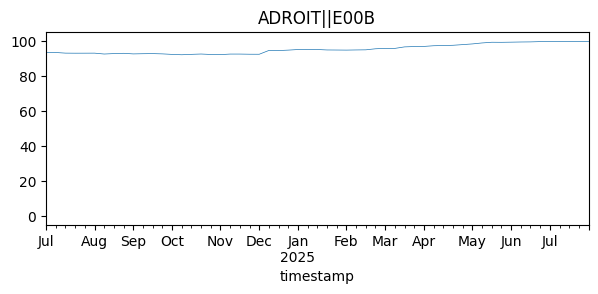

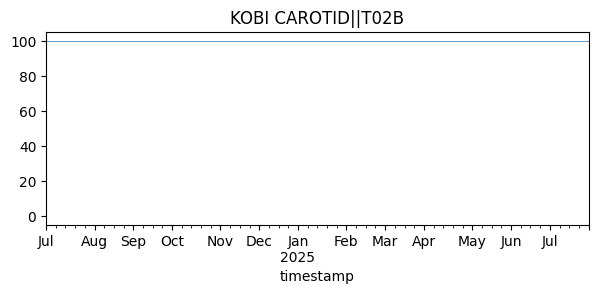

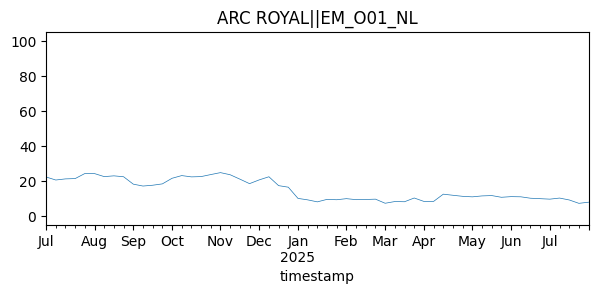

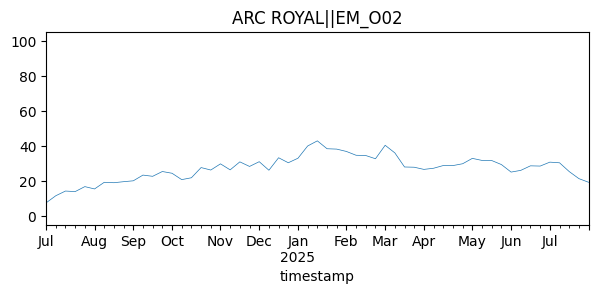

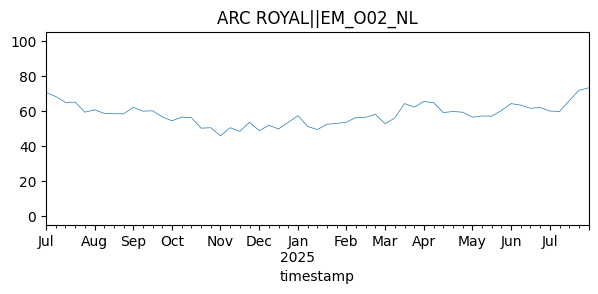

In [16]:
series_to_plot = [
    'ADROIT||E00B',
    'KOBI CAROTID||T02B',
    'ARC ROYAL||EM_O01_NL',
    'ARC ROYAL||EM_O02',
    'ARC ROYAL||EM_O02_NL']

for pair in series_to_plot:
    fig, ax = plt.subplots(1, 1, figsize=(7, 2.5))
    df_pairs.query('`pair_id` == @pair').plot(
        x='timestamp',
        y=['split_pct'],
        ax=ax,
        title=pair,
        linewidth=0.5,
        legend=False,
    )
    ax.set_ylim(-5, 105)
    plt.show()

### DATA
- 99 Brands
- 129 pairs of Resource-Brand
- 57 timestamps: 139x57=7923 rows

## Quotes 100% per brand --> Logit + Normalization 

Mejor trabajaremos en proporciones [0, 1] en vez de %

In [17]:
df_pairs['split_frac'] = df_pairs['split_pct'].astype(float) / 100.0
df_pairs

,timestamp,Brand,Resource ID,split_pct,pair_id,pair_idx,split_frac
0,2024-07-03,ADROIT,E00A,6.699629,ADROIT||E00A,0,0.066996
1,2024-07-03,ADROIT,E00B,93.300371,ADROIT||E00B,1,0.933004
2,2024-07-03,ANGIOGUARD,EM_L81,100.000000,ANGIOGUARD||EM_L81,2,1.000000
3,2024-07-03,AQUATRACK,EM_L71,100.000000,AQUATRACK||EM_L71,3,1.000000
4,2024-07-03,ARC ROYAL,EM_O01_NL,22.158198,ARC ROYAL||EM_O01_NL,4,0.221582
...,...,...,...,...,...,...,...
7918,2025-07-30,VISTA BRITE TIP (MODIFIED),A01,0.000000,VISTA BRITE TIP (MODIFIED)||A01,134,0.000000
7919,2025-07-30,VISTA BRITE TIP (MODIFIED),E00D,100.000000,VISTA BRITE TIP (MODIFIED)||E00D,135,1.000000
7920,2025-07-30,WIZDOM,EM_K60,100.000000,WIZDOM||EM_K60,136,1.000000
7921,2025-07-30,WIZDOM,EM_K60_NL,0.000000,WIZDOM||EM_K60_NL,137,0.000000


In [18]:
df_input = df_pairs.loc[:, ['timestamp','pair_idx','pair_id','split_frac']].copy()
df_input

,timestamp,pair_idx,pair_id,split_frac
0,2024-07-03,0,ADROIT||E00A,0.066996
1,2024-07-03,1,ADROIT||E00B,0.933004
2,2024-07-03,2,ANGIOGUARD||EM_L81,1.000000
3,2024-07-03,3,AQUATRACK||EM_L71,1.000000
4,2024-07-03,4,ARC ROYAL||EM_O01_NL,0.221582
...,...,...,...,...
7918,2025-07-30,134,VISTA BRITE TIP (MODIFIED)||A01,0.000000
7919,2025-07-30,135,VISTA BRITE TIP (MODIFIED)||E00D,1.000000
7920,2025-07-30,136,WIZDOM||EM_K60,1.000000
7921,2025-07-30,137,WIZDOM||EM_K60_NL,0.000000


In [19]:
eps = 1e-6
p = df_input['split_frac'].astype(float).clip(eps, 1 - eps)
df_input['y'] = np.log(p / (1 - p))
df_input.head(30)

,timestamp,pair_idx,pair_id,split_frac,y
0,2024-07-03,0,ADROIT||E00A,0.066996,-2.633772
1,2024-07-03,1,ADROIT||E00B,0.933004,2.633772
2,2024-07-03,2,ANGIOGUARD||EM_L81,1.000000,13.815510
3,2024-07-03,3,AQUATRACK||EM_L71,1.000000,13.815510
4,2024-07-03,4,ARC ROYAL||EM_O01_NL,0.221582,-1.256471
5,2024-07-03,5,ARC ROYAL||EM_O02,0.073861,-2.528844
6,2024-07-03,6,ARC ROYAL||EM_O02_NL,0.704557,0.869095
7,2024-07-03,7,ATW WIRE||EM_L51,0.993414,5.016175
8,2024-07-03,8,ATW WIRE||EM_L51_NL,0.006586,-5.016175
9,2024-07-03,9,ATW WIRE MARKER||EM_L51,0.998636,6.595781


### Including exog features

In [20]:
df_complete = pd.read_excel("./results/df_features.xlsx")
df = df_complete[['week','SKU','ADD','sin_week','cos_week','week_number']].copy()
df = df.rename(columns={"SKU": "series_id"})
df = df.rename(columns={"week": "timestamp"})
if 'timestamp' in df.columns:
    df.insert(0, 'timestamp', df.pop('timestamp'))
df =  df.sort_values(by=['timestamp', 'series_id'])

df

,timestamp,series_id,ADD,sin_week,cos_week,week_number
0,2024-07-03,12000210,9.85,-0.120537,-0.992709,1
57,2024-07-03,12000235,0.76,-0.120537,-0.992709,1
114,2024-07-03,12000236,9.09,-0.120537,-0.992709,1
171,2024-07-03,12000237,1.52,-0.120537,-0.992709,1
228,2024-07-03,12000249,2.65,-0.120537,-0.992709,1
...,...,...,...,...,...,...
244244,2025-07-30,ZE-6-120,1.31,-0.568065,-0.822984,57
244301,2025-07-30,ZE-6-200,0.08,-0.568065,-0.822984,57
244358,2025-07-30,ZE-6-250,0.00,-0.568065,-0.822984,57
244415,2025-07-30,ZE-8-100P,9.87,-0.568065,-0.822984,57


In [21]:
wk_feats = (df[['timestamp', 'sin_week', 'cos_week']]
            .drop_duplicates(subset=['timestamp']))
df_input = df_input.merge(wk_feats, on='timestamp', how='left')
df_input = df_input.rename(columns={'pair_id': 'series_id'})
df_input

,timestamp,pair_idx,series_id,split_frac,y,sin_week,cos_week
0,2024-07-03,0,ADROIT||E00A,0.066996,-2.633772,-0.120537,-0.992709
1,2024-07-03,1,ADROIT||E00B,0.933004,2.633772,-0.120537,-0.992709
2,2024-07-03,2,ANGIOGUARD||EM_L81,1.000000,13.815510,-0.120537,-0.992709
3,2024-07-03,3,AQUATRACK||EM_L71,1.000000,13.815510,-0.120537,-0.992709
4,2024-07-03,4,ARC ROYAL||EM_O01_NL,0.221582,-1.256471,-0.120537,-0.992709
...,...,...,...,...,...,...,...
7918,2025-07-30,134,VISTA BRITE TIP (MODIFIED)||A01,0.000000,-13.815510,-0.568065,-0.822984
7919,2025-07-30,135,VISTA BRITE TIP (MODIFIED)||E00D,1.000000,13.815510,-0.568065,-0.822984
7920,2025-07-30,136,WIZDOM||EM_K60,1.000000,13.815510,-0.568065,-0.822984
7921,2025-07-30,137,WIZDOM||EM_K60_NL,0.000000,-13.815510,-0.568065,-0.822984


In [22]:
d = pd.Timestamp('2025-07-30')
subset = df_input.loc[(df_input['series_id'] == 'KOBI CAROTID||T02B') & (df_input['timestamp'] == d)]
subset

,timestamp,pair_idx,series_id,split_frac,y,sin_week,cos_week
7834,2025-07-30,50,KOBI CAROTID||T02B,1.0,13.81551,-0.568065,-0.822984


In [23]:
series = df_input[['series_id', 'timestamp', 'y']].copy()  
exog = df_input[['series_id', 'timestamp','sin_week','cos_week']].copy()  

series['timestamp'] = pd.to_datetime(series['timestamp'])
exog['timestamp'] = pd.to_datetime(exog['timestamp'])

display(series.tail())
print("")
display(exog.head())

,series_id,timestamp,y
7918,VISTA BRITE TIP (MODIFIED)||A01,2025-07-30,-13.81551
7919,VISTA BRITE TIP (MODIFIED)||E00D,2025-07-30,13.81551
7920,WIZDOM||EM_K60,2025-07-30,13.81551
7921,WIZDOM||EM_K60_NL,2025-07-30,-13.81551
7922,ZEPHYR||EM_O89,2025-07-30,13.81551


,series_id,timestamp,sin_week,cos_week
0,ADROIT||E00A,2024-07-03,-0.120537,-0.992709
1,ADROIT||E00B,2024-07-03,-0.120537,-0.992709
2,ANGIOGUARD||EM_L81,2024-07-03,-0.120537,-0.992709
3,AQUATRACK||EM_L71,2024-07-03,-0.120537,-0.992709
4,ARC ROYAL||EM_O01_NL,2024-07-03,-0.120537,-0.992709


### Split train-test

In [24]:
last_date  = series['timestamp'].max()
end_train  = (last_date - pd.Timedelta(weeks=4))
start_test = end_train + pd.Timedelta(weeks=1)

print("Global split:")
print("  end_train :", end_train.date())
print("  start_test:", start_test.date(), " -> last_date:", last_date.date())

series_train = series.loc[series['timestamp'] <= end_train].copy()
series_test  = series.loc[series['timestamp'] >= start_test].copy()

exog_train   = exog.loc[exog['timestamp'] <= end_train].copy()
exog_test    = exog.loc[exog['timestamp'] >= start_test].copy()

print("Shapes -> series_train:", series_train.shape, " | series_test:", series_test.shape)

Global split:
  end_train : 2025-07-02
  start_test: 2025-07-09  -> last_date: 2025-07-30
Shapes -> series_train: (7367, 3)  | series_test: (556, 3)


In [25]:
series_train = series_train.sort_values(['series_id', 'timestamp'])
series_test = series_test.sort_values(['series_id', 'timestamp'])

# Crear dict train con frecuencia 'W-WED'
series_dict_train = {
    sku: df.set_index('timestamp')['y'].sort_index().asfreq('W-WED')
    for sku, df in series_train.groupby('series_id', sort=False)
}

# Crear dict test con frecuencia 'W-WED'
series_dict_test = {
    sku: df.set_index('timestamp')['y'].sort_index().asfreq('W-WED')
    for sku, df in series_test.groupby('series_id', sort=False)
}

exog_train = exog_train.sort_values(['series_id', 'timestamp'])
exog_test = exog_test.sort_values(['series_id', 'timestamp'])

# Crear dict {series_id: pd.DataFrame} sin la columna 'series_id'
exog_dict_train = {
    sku: df.set_index('timestamp').drop(columns=['series_id']).sort_index().asfreq('W-WED')
    for sku, df in exog_train.groupby('series_id', sort=False)
}


# Crear dict {series_id: pd.DataFrame} sin la columna 'series_id'
exog_dict_test = {
    sku: df.set_index('timestamp').drop(columns=['series_id']).sort_index().asfreq('W-WED')
    for sku, df in exog_test.groupby('series_id', sort=False)
}

print("Dict sizes -> series_train:", len(series_dict_train), " | series_test:", len(series_dict_test))
print("Example train series length:", next(iter(series_dict_train.values())).shape)
print("Example test series length :", next(iter(series_dict_test.values())).shape)

Dict sizes -> series_train: 139  | series_test: 139
Example train series length: (53,)
Example test series length : (4,)


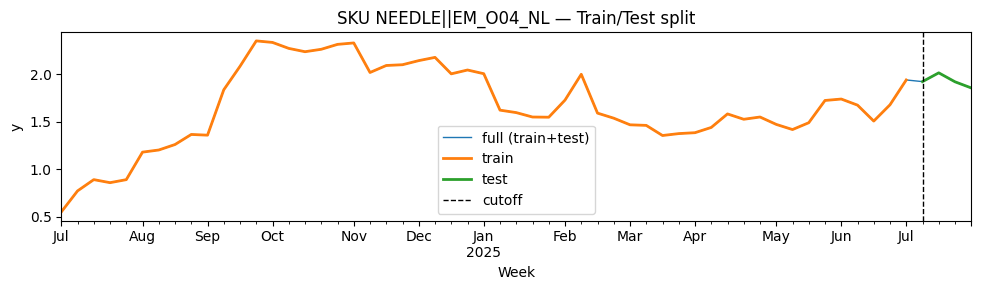

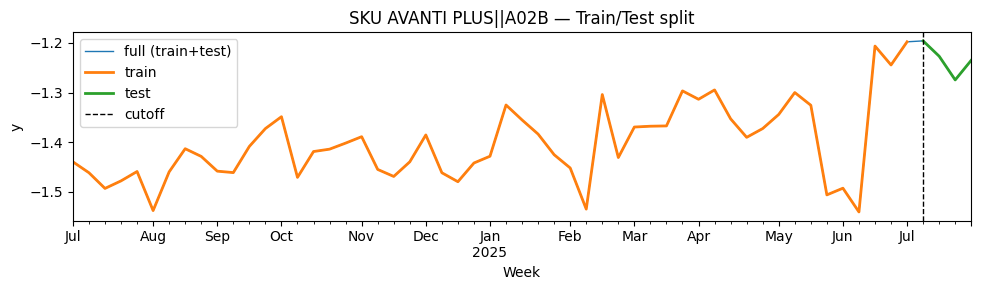

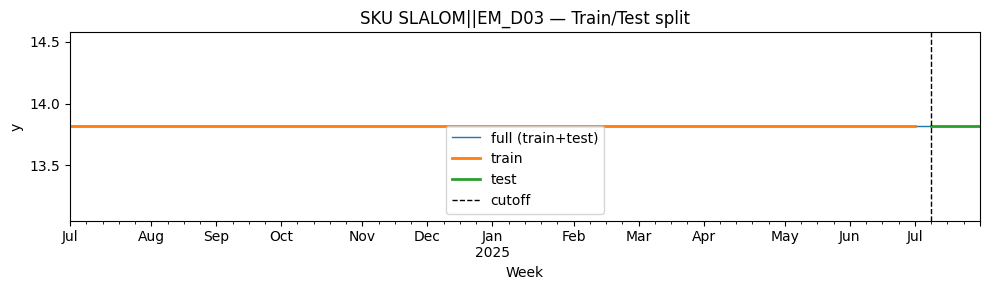

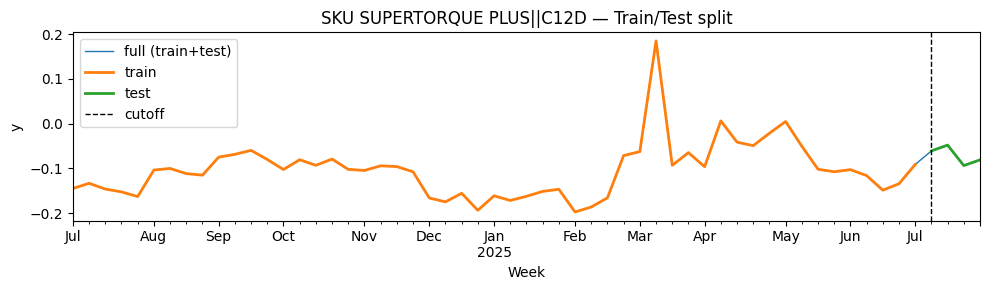

In [26]:
# Example: choose SKUs to plot (use your own or random sample)
all_levels = sorted(set(series_dict_train.keys()) | set(series_dict_test.keys()))
rng = np.random.default_rng(42)
skus_to_plot = rng.choice(all_levels, size=min(4, len(all_levels)), replace=False)

for sku in skus_to_plot:
    if sku not in series_dict_train and sku not in series_dict_test:
        print(f"SKU {sku} not found in train or test; skipping.")
        continue

    # Build "full" by concatenating train and test (when available)
    parts = []
    if sku in series_dict_train:
        parts.append(series_dict_train[sku])
    if sku in series_dict_test:
        parts.append(series_dict_test[sku])
    series_full = pd.concat(parts).sort_index()

    fig, ax = plt.subplots(figsize=(10, 3))

    # Full series (light gray)
    if len(series_full) > 0:
        series_full.plot(ax=ax, label='full (train+test)', linewidth=1.0)

    # Train (blue)
    if sku in series_dict_train and len(series_dict_train[sku]) > 0:
        series_dict_train[sku].plot(ax=ax, label='train', linewidth=2)

    # Test (orange)
    if sku in series_dict_test and len(series_dict_test[sku]) > 0:
        series_dict_test[sku].plot(ax=ax, label='test', linewidth=2)

    # Vertical cutoff at start_test
    if 'start_test' in globals():
        ax.axvline(x=start_test, color='black', linestyle='--', linewidth=1, label='cutoff')

    ax.set_title(f"SKU {sku} — Train/Test split")
    ax.set_ylabel("y")  
    ax.set_xlabel("Week")
    ax.legend()
    plt.tight_layout()
    plt.show()


In [27]:
# Reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
lags_base = [1, 2, 3, 4]

# Baseline LightGBM hyperparameters (regularized; modest depth/leaves)
lgbm = LGBMRegressor(
    random_state=RANDOM_STATE,
    n_estimators=600,        # enough trees; grid will tune
    learning_rate=0.05,
    # max_depth=-1,
    num_leaves=63,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=-1
)


# Global multi-series recursive forecaster
forecaster = ForecasterRecursiveMultiSeries(
    regressor=lgbm,
    lags=lags_base,
    encoding="ordinal"  # compact encoding for series id
)

forecaster

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: LGBMRegressor 
Lags: [1 2 3 4] 
Window features: None 
Window size: 4 
Series encoding: ordinal 
Series names (levels): None 
Exogenous included: False 
Exogenous names: None 
Transformer for series: None 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: 
    {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 0.8,
    'importance_type': 'split', 'learning_rate': 0.05, 'max_depth': -1,
    'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0,
    'n_estimators': 600, 'n_jobs': -1, 'num_leaves': 63, 'objective': None,
    'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 0.8,
    'subsample_for_bin': 200000, 'subsample_freq': 0} 
fit_kwargs: {} 
Creation date: 2025-09-18 12:46:13 
Last fit date: None 
Skforecast version: 0.17.0 
Python version: 3.13.5 
Forecaster id: None

### Lags and Hyperparameter tuning - Cross Validation with bayesian_search_forecaster_multiseries & OneStepAheadFold

In [28]:
n_val_weeks_osa = 10
n_total_weeks_train = len(next(iter(series_dict_train.values())))
initial_train_size = n_total_weeks_train - n_val_weeks_osa
assert initial_train_size > 8, "Very small training window. Reduce n_val_weeks_osa."

In [29]:
from skforecast.model_selection import (
    OneStepAheadFold,
    bayesian_search_forecaster_multiseries
)
from skforecast.preprocessing import RollingFeatures


# 1) Definir el tamaño del tramo de validación interno dentro del training: 10 semanas de validacion, evaluadas de 1 en 1 steps
n_val_weeks_osa = 10
n_total_weeks_train = len(next(iter(series_dict_train.values())))
initial_train_size = n_total_weeks_train - n_val_weeks_osa
assert initial_train_size > 8, "Very small training window. Reduce n_val_weeks_osa."

def search_space(trial):
    return {
        # Lags cortos por historia ~57 semanas; añade variantes si quieres.
        'lags'            : trial.suggest_categorical('lags', [
                              [1,2,3,4],
                              [1,2,3,4,8],
                              [1,2,3,4,8,12],
                              [1,2,3,4,8,12,24]]),
        'n_estimators'    : trial.suggest_int('n_estimators', 200, 800, step=100),
        'max_depth'       : trial.suggest_int('max_depth', 3, 8, step=1),
        'num_leaves'      : trial.suggest_int('num_leaves', 15, 63, step=4),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 200, step=10),
        'learning_rate'   : trial.suggest_float('learning_rate', 0.01, 0.2),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.6, 1.0, step=0.1),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.6, 1.0, step=0.1),
        'lambda_l1'       : trial.suggest_float('lambda_l1', 0.0, 1.0, step=0.1),
        'lambda_l2'       : trial.suggest_float('lambda_l2', 0.0, 1.0, step=0.1),
    }


cv_osa = OneStepAheadFold(initial_train_size=initial_train_size)

results_search, best_trial = bayesian_search_forecaster_multiseries(
    forecaster        = forecaster,
    series            = series_dict_train,
    exog              = exog_dict_train,   # si no tienes exógenas por serie, pasa None
    cv                = cv_osa,
    search_space      = search_space,
    n_trials          = 20,                # ajusta según presupuesto
    metric            = "mean_absolute_error",
    return_best       = True,
    suppress_warnings = True,
    random_state      = RANDOM_STATE,
    n_jobs            = "auto",
    verbose           = True
)

best_params = results_search.at[0, 'params']
best_lags   = results_search.at[0, 'lags']

print("Best lags:", best_lags)
print("Best params:", best_params)

  0%|          | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.9, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.9, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.


Best trial: 0. Best value: 0.0918283:   5%|▌         | 1/20 [00:00<00:08,  2.28it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.


Best trial: 0. Best value: 0.0918283:  10%|█         | 2/20 [00:00<00:08,  2.17it/s]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.7000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.7000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 0. Best value: 0.0918283:  15%|█▌        | 3/20 [00:01<00:07,  2.17it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.


Best trial: 0. Best value: 0.0918283:  20%|██        | 4/20 [00:02<00:08,  1.90it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current valu

Best trial: 4. Best value: 0.0731892:  25%|██▌       | 5/20 [00:02<00:07,  2.05it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.


Best trial: 4. Best value: 0.0731892:  30%|███       | 6/20 [00:03<00:07,  1.90it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: f

Best trial: 4. Best value: 0.0731892:  35%|███▌      | 7/20 [00:03<00:06,  2.01it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise

Best trial: 4. Best value: 0.0731892:  40%|████      | 8/20 [00:04<00:06,  1.96it/s]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.


Best trial: 4. Best value: 0.0731892:  45%|████▌     | 9/20 [00:04<00:05,  1.92it/s]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.


Best trial: 4. Best value: 0.0731892:  50%|█████     | 10/20 [00:05<00:05,  1.81it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current valu

Best trial: 4. Best value: 0.0731892:  55%|█████▌    | 11/20 [00:05<00:04,  1.84it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.


Best trial: 4. Best value: 0.0731892:  60%|██████    | 12/20 [00:06<00:04,  1.96it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: b

Best trial: 12. Best value: 0.069499:  65%|██████▌   | 13/20 [00:06<00:03,  2.04it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: b

Best trial: 12. Best value: 0.069499:  70%|███████   | 14/20 [00:07<00:02,  2.02it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: b

Best trial: 12. Best value: 0.069499:  75%|███████▌  | 15/20 [00:07<00:02,  2.09it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 12. Best value: 0.069499:  80%|████████  | 16/20 [00:07<00:01,  2.11it/s]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 12. Best value: 0.069499:  85%|████████▌ | 17/20 [00:08<00:01,  2.13it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 12. Best value: 0.069499:  90%|█████████ | 18/20 [00:08<00:00,  2.06it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 12. Best value: 0.069499: 100%|██████████| 20/20 [00:09<00:00,  2.02it/s]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise mul


c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4] which is of type list.
  warnings.warn(message)
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4, 8] which is of type list.
  warnings.warn(message)
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4, 8, 12] which is of type list.
  warnings.warn(message)
c:\Users\ma

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: b

In [30]:
print(best_lags)
print(best_params)

[1 2 3 4]
{'n_estimators': 200, 'max_depth': 5, 'num_leaves': 47, 'min_child_samples': 90, 'learning_rate': 0.06107135917674153, 'feature_fraction': 0.7, 'bagging_fraction': 1.0, 'lambda_l1': 0.7000000000000001, 'lambda_l2': 0.30000000000000004}


### Final FORECASTER with the selected parameters

In [31]:
from skforecast.preprocessing import RollingFeatures

regressor = LGBMRegressor(
    random_state=RANDOM_STATE,
    **best_params
)

rolling=RollingFeatures(
    stats        = ['mean', 'mean'],
    window_sizes = [4, 7]
)

forecaster = ForecasterRecursiveMultiSeries(
    regressor=regressor, 
    lags=best_lags,
    window_features=rolling,
    encoding="ordinal", 
    dropna_from_series=False
)

### BACKTESTING WITH TimeSeriesFold

In [32]:
# 12 semanas de validacion, evaluadas de 4 en 4 steps (3 folds)
steps = 4
n_folds_desired = 3
n_val_weeks_tsf = steps * n_folds_desired

initial_train_size = n_total_weeks_train - n_val_weeks_tsf

# TimeSeriesFold (cross validation real multi-paso h=4)
cv = TimeSeriesFold(
    steps=steps,
    initial_train_size=initial_train_size,
    refit=True,                 # empieza con False por coste; puedes probar True si quieres más realismo
    fixed_train_size=True,       # ventana deslizante del mismo tamaño
    allow_incomplete_fold=True
)

# --- 5) Backtesting dentro del training ---
metrics_levels, backtest_predictions = backtesting_forecaster_multiseries(
    forecaster             = forecaster,
    series                 = series_dict_train,   # ¡training!
    exog                   = exog_dict_train,     # exógenas del training
    cv                     = cv,
    levels                 = None,                # todas las series
    metric                 = ["mean_absolute_error"],
    add_aggregated_metric  = True,
    n_jobs                 = "auto",
    verbose                = True,
    show_progress          = True,
    suppress_warnings      = True
)

display(metrics_levels)
print()
display(backtest_predictions.head())

Information of folds
--------------------
Number of observations used for initial training: 41
Number of observations used for backtesting: 12
    Number of folds: 3
    Number skipped folds: 0 
    Number of steps per fold: 4
    Number of steps to exclude between last observed data (last window) and predictions (gap): 0

Fold: 0
    Training:   2024-07-03 00:00:00 -- 2025-04-09 00:00:00  (n=41)
    Validation: 2025-04-16 00:00:00 -- 2025-05-07 00:00:00  (n=4)
Fold: 1
    Training:   2024-07-31 00:00:00 -- 2025-05-07 00:00:00  (n=41)
    Validation: 2025-05-14 00:00:00 -- 2025-06-04 00:00:00  (n=4)
Fold: 2
    Training:   2024-08-28 00:00:00 -- 2025-06-04 00:00:00  (n=41)
    Validation: 2025-06-11 00:00:00 -- 2025-07-02 00:00:00  (n=4)

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.70000000000

 33%|███▎      | 1/3 [00:00<00:00,  2.60it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: b

 67%|██████▋   | 2/3 [00:00<00:00,  2.46it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: b

100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: b

,levels,mean_absolute_error
0,ADROIT||E00A,0.335610
1,ADROIT||E00B,0.324139
2,ANGIOGUARD||EM_L81,0.033397
3,AQUATRACK||EM_L71,0.033397
4,ARC ROYAL||EM_O01_NL,0.147497
...,...,...
137,WIZDOM||EM_K60_NL,0.056193
138,ZEPHYR||EM_O89,0.011175
139,average,0.103599
140,weighted_average,0.103599


,level,pred
2025-04-16,ADROIT||E00A,-3.532938
2025-04-16,ADROIT||E00B,3.740575
2025-04-16,ANGIOGUARD||EM_L81,13.790821
2025-04-16,AQUATRACK||EM_L71,13.790821
2025-04-16,ARC ROYAL||EM_O01_NL,-2.362567


In [33]:
y_true_rows = []
for idx, row in backtest_predictions.iterrows():
    level = row["level"]
    date = idx
    y_real = series_dict_train[level].loc[date]  #NORMALIZADOS INICIALES
    y_true_rows.append(y_real)

backtest_predictions["y"] = y_true_rows
backtest_predictions["abs_error"] = (backtest_predictions["pred"] - backtest_predictions["y"]).abs()

backtest_predictions

,level,pred,y,abs_error
2025-04-16,ADROIT||E00A,-3.532938,-3.579768,0.046830
2025-04-16,ADROIT||E00B,3.740575,3.579768,0.160808
2025-04-16,ANGIOGUARD||EM_L81,13.790821,13.815510,0.024689
2025-04-16,AQUATRACK||EM_L71,13.790821,13.815510,0.024689
2025-04-16,ARC ROYAL||EM_O01_NL,-2.362567,-1.960673,0.401894
...,...,...,...,...
2025-07-02,VISTA BRITE TIP||E02B,-2.284555,-2.145316,0.139238
2025-07-02,VISTA BRITE TIP||E02C,-3.035851,-3.147611,0.111760
2025-07-02,WIZDOM||EM_K60,13.797151,13.815510,0.018359
2025-07-02,WIZDOM||EM_K60_NL,-13.833051,-13.815510,0.017542


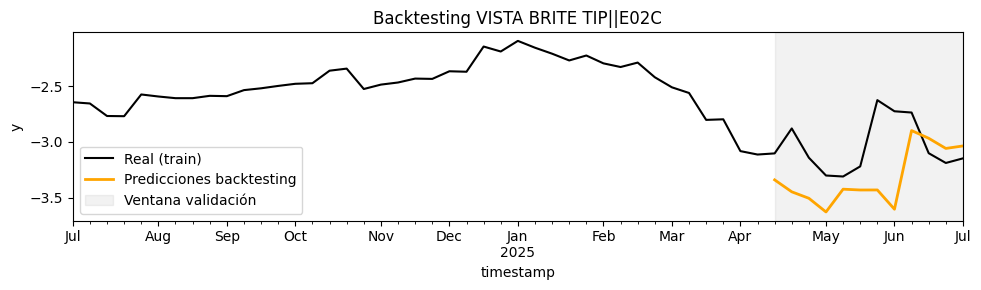

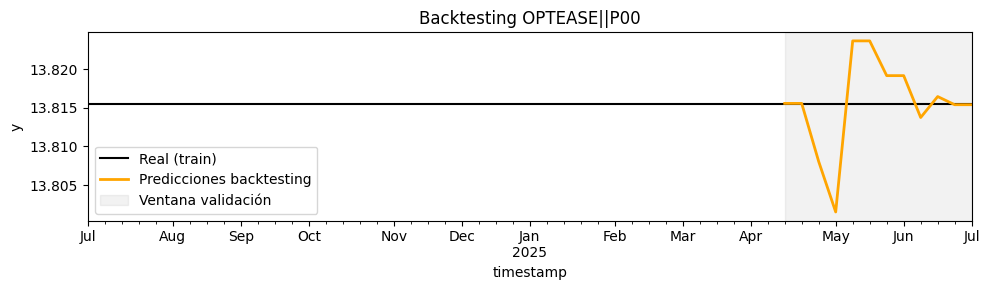

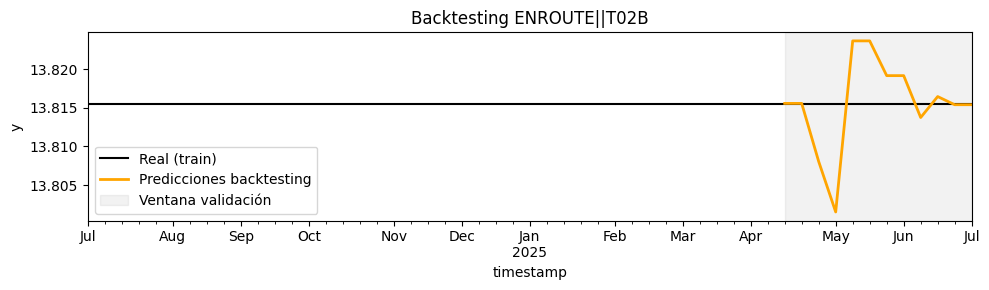

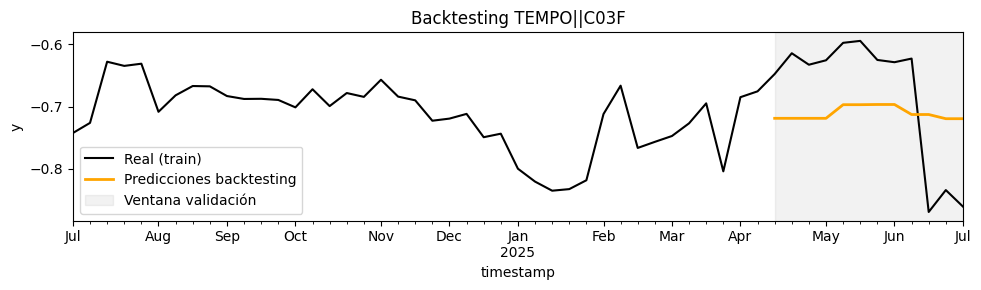

In [34]:
series_train = series_train.sort_values(["series_id", "timestamp"])

# SKUs a graficar (máx. 4 al azar)
all_skus = series_train["series_id"].unique()
skus_to_plot = np.random.choice(all_skus, size=min(4, len(all_skus)), replace=False)

for sku in skus_to_plot:
    fig, ax = plt.subplots(figsize=(10, 3))

    # Serie real (train)
    s_train = series_train[series_train["series_id"] == sku]
    s_train = s_train.set_index("timestamp")["y"].sort_index()
    s_train.plot(ax=ax, color="black", label="Real (train)")

    # Predicciones del backtesting para el SKU
    preds_sku = backtest_predictions.loc[backtest_predictions["level"] == sku, "pred"].reset_index(drop=True)

    # Índice temporal de validación (últimas n_val_weeks_tsf semanas del train)
    val_idx = s_train.index[-n_val_weeks_tsf:]

    if len(preds_sku) == len(val_idx):
        preds_sku.index = val_idx
        preds_sku.plot(ax=ax, color="orange", linewidth=2, label="Predicciones backtesting")

        # Sombreado validación
        ax.axvspan(val_idx.min(), val_idx.max(), color="gray", alpha=0.1, label="Ventana validación")


    ax.set_title(f"Backtesting {sku}")
    ax.set_ylabel("y")
    ax.legend()
    plt.tight_layout()
    plt.show()

# test

In [35]:
forecaster.fit(series = series_dict_train, exog = exog_dict_train)
display(forecaster)

levels_test = list(series_dict_test.keys())
len(levels_test)

predictions = forecaster.predict(
    steps=4,
    levels=levels_test,  
    exog=exog_dict_test   
)

y_true_rows = []
for idx, row in predictions.iterrows():
    level = row["level"]
    date = idx
    y_real = series_dict_test[level].loc[date]  #NORMALIZADOS INICIALES
    y_true_rows.append(y_real)

predictions["y"] = y_true_rows
predictions["abs_error"] = (predictions["pred"] - predictions["y"]).abs()

mae = predictions["abs_error"].mean()
print(f"MAE global: {mae:.4f}")

predictions

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: b

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: LGBMRegressor 
Lags: [1 2 3 4] 
Window features: ['roll_mean_4', 'roll_mean_7'] 
Window size: 7 
Series encoding: ordinal 
Series names (levels): 
    ADROIT||E00A, ADROIT||E00B, ANGIOGUARD||EM_L81, AQUATRACK||EM_L71, ARC
    ROYAL||EM_O01_NL, ARC ROYAL||EM_O02, ARC ROYAL||EM_O02_NL, ATW WIRE
    MARKER||EM_L51, ATW WIRE MARKER||EM_L51_NL, ATW WIRE||EM_L51, ATW
    WIRE||EM_L51_NL, AVANTI PLUS||A00B, AVANTI PLUS||A02B, AVANTI PLUS||A02C,
    AVIATOR PLUS||EM_D03, BIOPSY FORCEPS STD||EM_F20, BIPAL||EM_F10, BLUE on
    AVIATOR||EM_D03, BLUE on SLALOM||EM_D03, BRITE TIP (MODIFIED)||A00B, BRITE
    TIP (MODIFIED)||A02C, BRITE TIP RADIANZ||T03, BRITE TIP||A00A, BRITE
    TIP||A02A, BriteCross Support Catheters||EM_O92, ..., Selution SLR SFA
    4-7||EM_O92, TEMPO (MODIFIED)||C05, TEMPO AQUA (MODIFIED)||C05, TEMPO
    AQUA||C03H, TEMPO||C03F, TEMPO||C03G, TORQUE DEVICE||EM_O02_NL,
    TRAPEASE||P00, VASSALLO GT .014||EM_O90, VASSALLO GT .018||EM_O90, VASSALLO
    GT EXT GW||EM_O90, VESSEL DILATOR||A00B, VISTA BRITE TIP (MODIFIED)||A00B,
    VISTA BRITE TIP (MODIFIED)||A01, VISTA BRITE TIP (MODIFIED)||E00D, VISTA
    BRITE TIP||A01, VISTA BRITE TIP||E00C, VISTA BRITE TIP||E01A, VISTA BRITE
    TIP||E01B, VISTA BRITE TIP||E02A, VISTA BRITE TIP||E02B, VISTA BRITE
    TIP||E02C, WIZDOM||EM_K60, WIZDOM||EM_K60_NL, ZEPHYR||EM_O89 
Exogenous included: True 
Exogenous names: sin_week, cos_week 
Transformer for series: None 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: None 
Training range: 
    'ADROIT||E00A': ['2024-07-03', '2025-07-02'], 'ADROIT||E00B': ['2024-07-03',
    '2025-07-02'], 'ANGIOGUARD||EM_L81': ['2024-07-03', '2025-07-02'],
    'AQUATRACK||EM_L71': ['2024-07-03', '2025-07-02'], 'ARC ROYAL||EM_O01_NL':
    ['2024-07-03', '2025-07-02'], ..., 'VISTA BRITE TIP||E02B': ['2024-07-03',
    '2025-07-02'], 'VISTA BRITE TIP||E02C': ['2024-07-03', '2025-07-02'],
    'WIZDOM||EM_K60': ['2024-07-03', '2025-07-02'], 'WIZDOM||EM_K60_NL':
    ['2024-07-03', '2025-07-02'], 'ZEPHYR||EM_O89': ['2024-07-03', '2025-07-02'] 
Training index type: DatetimeIndex 
Training index frequency: W-WED 
Regressor parameters: 
    {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0,
    'importance_type': 'split', 'learning_rate': 0.06107135917674153,
    'max_depth': 5, 'min_child_samples': 90, 'min_child_weight': 0.001,
    'min_split_gain': 0.0, 'n_estimators': 200, 'n_jobs': None, 'num_leaves':
    47, 'objective': None, 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda':
    0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0,
    'feature_fraction': 0.7, 'bagging_fraction': 1.0, 'lambda_l1':
    0.7000000000000001, 'lambda_l2': 0.30000000000000004} 
fit_kwargs: {} 
Creation date: 2025-09-18 12:46:23 
Last fit date: 2025-09-18 12:46:28 
Skforecast version: 0.17.0 
Python version: 3.13.5 
Forecaster id: None

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: b

,level,pred,y,abs_error
2025-07-09,ADROIT||E00A,-5.355718,-5.391944,0.036227
2025-07-09,ADROIT||E00B,5.174514,5.391944,0.217430
2025-07-09,ANGIOGUARD||EM_L81,13.807522,13.815510,0.007988
2025-07-09,AQUATRACK||EM_L71,13.807522,13.815510,0.007988
2025-07-09,ARC ROYAL||EM_O01_NL,-2.279792,-2.183981,0.095811
...,...,...,...,...
2025-07-30,VISTA BRITE TIP||E02B,-2.318609,-2.219082,0.099526
2025-07-30,VISTA BRITE TIP||E02C,-3.203563,-3.048787,0.154776
2025-07-30,WIZDOM||EM_K60,13.865288,13.815510,0.049779
2025-07-30,WIZDOM||EM_K60_NL,-13.925108,-13.815510,0.109598


AVANTI PLUS||A02C
                pred         y  abs_error
2025-07-09  1.161261  1.117596   0.043665
2025-07-16  1.162299  1.148402   0.013898
2025-07-23  1.162299  1.183338   0.021039
2025-07-30  1.162299  1.147143   0.015156
MAE 0.023439431055147508


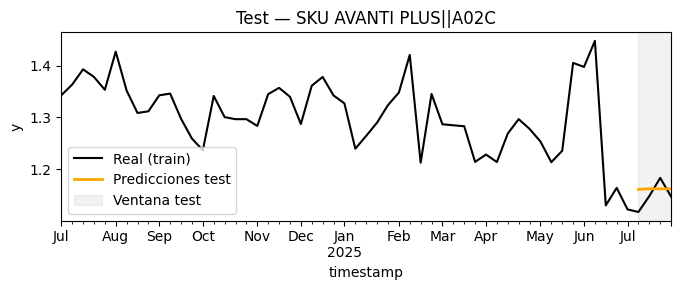

TEMPO (MODIFIED)||C05
                 pred         y  abs_error
2025-07-09  13.816391  13.81551   0.000882
2025-07-16  13.816391  13.81551   0.000882
2025-07-23  13.816391  13.81551   0.000882
2025-07-30  13.816391  13.81551   0.000882
MAE 0.0008815370158217206


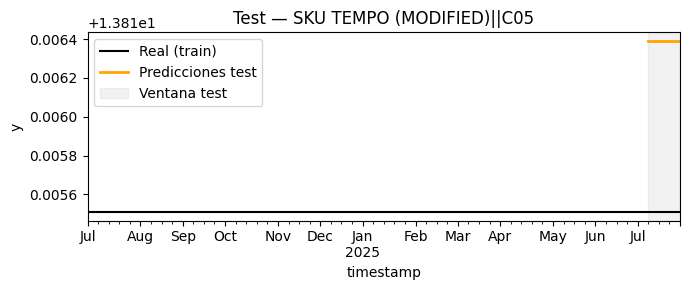

SMART||T01C
                pred         y  abs_error
2025-07-09  1.308708  1.333026   0.024317
2025-07-16  1.309746  1.335076   0.025329
2025-07-23  1.308708  1.170153   0.138555
2025-07-30  1.308708  1.185136   0.123572
MAE 0.0779435406696462


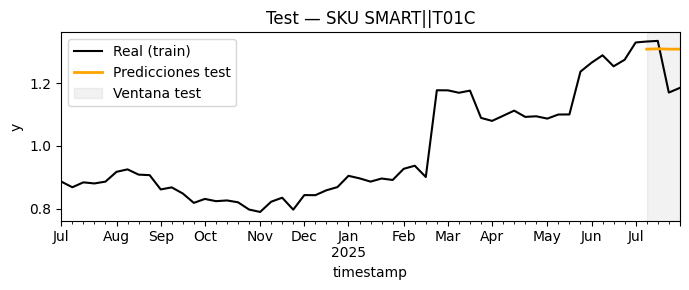

BriteCross Support Catheters||EM_O92
                 pred         y  abs_error
2025-07-09  13.817212  13.81551   0.001703
2025-07-16  13.817212  13.81551   0.001703
2025-07-23  13.817212  13.81551   0.001703
2025-07-30  13.817212  13.81551   0.001703
MAE 0.001702678916400302


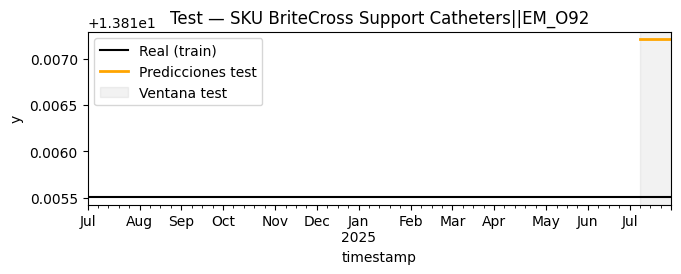

In [36]:
series = series.sort_values(["series_id", "timestamp"])

## SKUs a graficar (máx. 4 al azar)
all_skus = series["series_id"].unique()
skus_to_plot = np.random.choice(all_skus, size=min(4, len(all_skus)), replace=False)

n_test_weeks = 4 

for sku in skus_to_plot:

    print(sku)
    df_sku = (predictions.loc[predictions["level"].astype(str) == sku,
                         ["pred", "y", "abs_error"]]
                    .sort_index())
    print(df_sku)
    print(f"MAE {df_sku["abs_error"].mean()}")

    fig, ax = plt.subplots(figsize=(7, 3))

    # Serie real (entera)
    s_full  = series[series["series_id"] == sku]
    s_full  = s_full .set_index("timestamp")["y"].sort_index()
    s_full .plot(ax=ax, color="black", label="Real (train)")

    # Predicciones del test para el SKU
    preds_sku = predictions.loc[predictions["level"] == sku, "pred"].reset_index(drop=True)

    # Índice temporal de test
    test_idx = s_full.index[-n_test_weeks:]

    if len(preds_sku) == len(test_idx):
        preds_sku.index = test_idx
        preds_sku.plot(ax=ax, color="orange", linewidth=2, label="Predicciones test")

        # Sombreado validación
        ax.axvspan(test_idx.min(), test_idx.max(), color="gray", alpha=0.1, label="Ventana test")

    ax.set_title(f"Test — SKU {sku}")
    ax.set_ylabel("y")
    ax.legend()
    plt.tight_layout()
    plt.show()

## Renormalization

In [37]:
predictions.index = pd.to_datetime(predictions.index)
predictions.index.name = "timestamp"

predictions = predictions.reset_index()

predictions = predictions.merge(
    df_pairs[["pair_id", 'timestamp', "Brand", "split_frac"]],
    left_on=["level", "timestamp"],
    right_on=["pair_id", "timestamp"],
    how="left"
).drop(columns="pair_id")
predictions

,timestamp,level,pred,y,abs_error,Brand,split_frac
0,2025-07-09,ADROIT||E00A,-5.355718,-5.391944,0.036227,ADROIT,0.004532
1,2025-07-09,ADROIT||E00B,5.174514,5.391944,0.217430,ADROIT,0.995468
2,2025-07-09,ANGIOGUARD||EM_L81,13.807522,13.815510,0.007988,ANGIOGUARD,1.000000
3,2025-07-09,AQUATRACK||EM_L71,13.807522,13.815510,0.007988,AQUATRACK,1.000000
4,2025-07-09,ARC ROYAL||EM_O01_NL,-2.279792,-2.183981,0.095811,ARC ROYAL,0.101198
...,...,...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP||E02B,-2.318609,-2.219082,0.099526,VISTA BRITE TIP,0.098050
552,2025-07-30,VISTA BRITE TIP||E02C,-3.203563,-3.048787,0.154776,VISTA BRITE TIP,0.045270
553,2025-07-30,WIZDOM||EM_K60,13.865288,13.815510,0.049779,WIZDOM,1.000000
554,2025-07-30,WIZDOM||EM_K60_NL,-13.925108,-13.815510,0.109598,WIZDOM,0.000000


In [38]:
# pred: es tu logit predicho por el modelo (un número real, puede ser negativo o positivo).
# p_raw: aplica sigmoide a pred → lo convierte en un valor entre 0 y 1.
predictions['p_raw'] = 1.0 / (1.0 + np.exp(-predictions['pred'].astype(float)))

# den: para cada (timestamp, Brand) suma todos los p_raw de sus recursos (denominador de la normalización).
den = predictions.groupby(['timestamp','Brand'])['p_raw'].transform('sum')

# split_frac_hat: p_raw / den → fracción normalizada por (timestamp, Brand); las fracciones de una marca en esa fecha suman 1.
predictions['split_frac_hat'] = np.where(den > 0, predictions['p_raw'] / den, 0.0)

# split_pct_hat: lo mismo pero en % (multiplicado por 100).
predictions['split_pct_hat']  = 100.0 * predictions['split_frac_hat']

predictions['frac_error'] = (predictions['split_frac_hat'] - predictions['split_frac']).abs()
predictions

,timestamp,level,pred,y,abs_error,Brand,split_frac,p_raw,split_frac_hat,split_pct_hat,frac_error
0,2025-07-09,ADROIT||E00A,-5.355718,-5.391944,0.036227,ADROIT,0.004532,4.698896e-03,4.703262e-03,0.470326,1.707876e-04
1,2025-07-09,ADROIT||E00B,5.174514,5.391944,0.217430,ADROIT,0.995468,9.943729e-01,9.952967e-01,99.529674,1.707876e-04
2,2025-07-09,ANGIOGUARD||EM_L81,13.807522,13.815510,0.007988,ANGIOGUARD,1.000000,9.999990e-01,1.000000e+00,100.000000,0.000000e+00
3,2025-07-09,AQUATRACK||EM_L71,13.807522,13.815510,0.007988,AQUATRACK,1.000000,9.999990e-01,1.000000e+00,100.000000,0.000000e+00
4,2025-07-09,ARC ROYAL||EM_O01_NL,-2.279792,-2.183981,0.095811,ARC ROYAL,0.101198,9.281045e-02,9.345884e-02,9.345884,7.739365e-03
...,...,...,...,...,...,...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP||E02B,-2.318609,-2.219082,0.099526,VISTA BRITE TIP,0.098050,8.959349e-02,9.396124e-02,9.396124,4.088684e-03
552,2025-07-30,VISTA BRITE TIP||E02C,-3.203563,-3.048787,0.154776,VISTA BRITE TIP,0.045270,3.903186e-02,4.093470e-02,4.093470,4.335163e-03
553,2025-07-30,WIZDOM||EM_K60,13.865288,13.815510,0.049779,WIZDOM,1.000000,9.999990e-01,9.999991e-01,99.999910,8.961944e-07
554,2025-07-30,WIZDOM||EM_K60_NL,-13.925108,-13.815510,0.109598,WIZDOM,0.000000,8.961943e-07,8.961944e-07,0.000090,8.961944e-07


In [39]:
split_pred = pd.read_excel("./results/split_pred.xlsx")

split_pred = (
    split_pred
    [['timestamp', 'Brand', 'Resource ID', 'split_pct']]
    .groupby(['timestamp', 'Brand', 'Resource ID'], as_index=False)
    .agg(split_pct=('split_pct', 'first'))
    .sort_values(['timestamp', 'Brand', 'Resource ID'])
    .reset_index(drop=True)
)

split_pred['pair_id']  = split_pred['Brand'].astype('string') + '||' + split_pred['Resource ID'].astype('string')

split_pred['split_frac'] = split_pred['split_pct'].astype(float) / 100.0
split_pred = split_pred.rename(columns = {'split_frac': 'split_frac_hat_A'})
split_pred = split_pred.rename(columns = {'pair_id': 'level'})

split_pred

,timestamp,Brand,Resource ID,split_pct,level,split_frac_hat_A
0,2025-07-09,ADROIT,E00A,0.646237,ADROIT||E00A,0.006462
1,2025-07-09,ADROIT,E00B,99.353763,ADROIT||E00B,0.993538
2,2025-07-09,ANGIOGUARD,EM_L81,100.000000,ANGIOGUARD||EM_L81,1.000000
3,2025-07-09,AQUATRACK,EM_L71,100.000000,AQUATRACK||EM_L71,1.000000
4,2025-07-09,ARC ROYAL,EM_O01_NL,10.207746,ARC ROYAL||EM_O01_NL,0.102077
...,...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP (MODIFIED),A01,0.242947,VISTA BRITE TIP (MODIFIED)||A01,0.002429
552,2025-07-30,VISTA BRITE TIP (MODIFIED),E00D,99.667752,VISTA BRITE TIP (MODIFIED)||E00D,0.996678
553,2025-07-30,WIZDOM,EM_K60,99.297080,WIZDOM||EM_K60,0.992971
554,2025-07-30,WIZDOM,EM_K60_NL,0.702920,WIZDOM||EM_K60_NL,0.007029


In [40]:
predictions = predictions.merge(
    split_pred[['timestamp','level','split_frac_hat_A']],
    on=['timestamp','level'],
    how="left"
)

predictions

,timestamp,level,pred,y,abs_error,Brand,split_frac,p_raw,split_frac_hat,split_pct_hat,frac_error,split_frac_hat_A
0,2025-07-09,ADROIT||E00A,-5.355718,-5.391944,0.036227,ADROIT,0.004532,4.698896e-03,4.703262e-03,0.470326,1.707876e-04,0.006462
1,2025-07-09,ADROIT||E00B,5.174514,5.391944,0.217430,ADROIT,0.995468,9.943729e-01,9.952967e-01,99.529674,1.707876e-04,0.993538
2,2025-07-09,ANGIOGUARD||EM_L81,13.807522,13.815510,0.007988,ANGIOGUARD,1.000000,9.999990e-01,1.000000e+00,100.000000,0.000000e+00,1.000000
3,2025-07-09,AQUATRACK||EM_L71,13.807522,13.815510,0.007988,AQUATRACK,1.000000,9.999990e-01,1.000000e+00,100.000000,0.000000e+00,1.000000
4,2025-07-09,ARC ROYAL||EM_O01_NL,-2.279792,-2.183981,0.095811,ARC ROYAL,0.101198,9.281045e-02,9.345884e-02,9.345884,7.739365e-03,0.102077
...,...,...,...,...,...,...,...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP||E02B,-2.318609,-2.219082,0.099526,VISTA BRITE TIP,0.098050,8.959349e-02,9.396124e-02,9.396124,4.088684e-03,0.095934
552,2025-07-30,VISTA BRITE TIP||E02C,-3.203563,-3.048787,0.154776,VISTA BRITE TIP,0.045270,3.903186e-02,4.093470e-02,4.093470,4.335163e-03,0.045683
553,2025-07-30,WIZDOM||EM_K60,13.865288,13.815510,0.049779,WIZDOM,1.000000,9.999990e-01,9.999991e-01,99.999910,8.961944e-07,0.992971
554,2025-07-30,WIZDOM||EM_K60_NL,-13.925108,-13.815510,0.109598,WIZDOM,0.000000,8.961943e-07,8.961944e-07,0.000090,8.961944e-07,0.007029


SKU: ADROIT||E00A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.004703          0.006462         0.004532
2025-07-16        0.004934          0.009098         0.004033
2025-07-23        0.005236          0.014428         0.003920
2025-07-30        0.005300          0.017760         0.004038
MAE model1 (split_frac_hat): 0.000912
MAE model2 (split_frac_hat_A): 0.007806


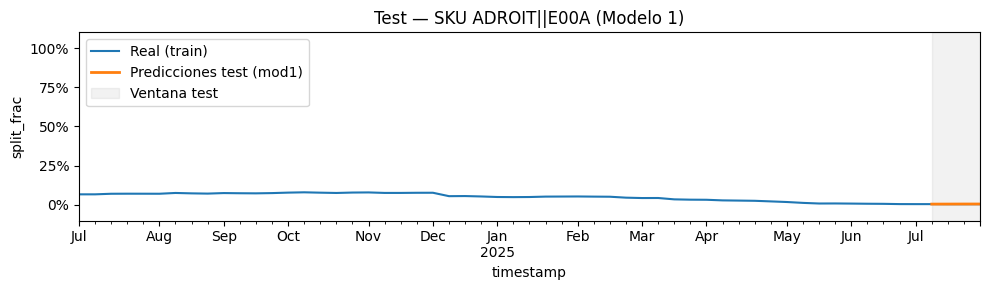

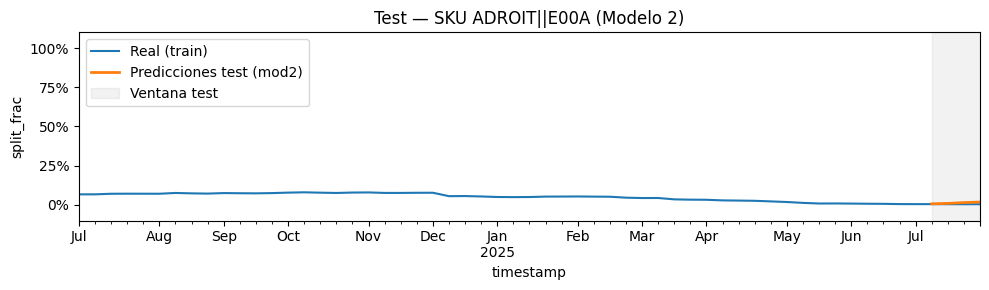

SKU: ADROIT||E00B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.995297          0.993538         0.995468
2025-07-16        0.995066          0.990902         0.995967
2025-07-23        0.994764          0.985572         0.996080
2025-07-30        0.994700          0.982240         0.995962
MAE model1 (split_frac_hat): 0.000912
MAE model2 (split_frac_hat_A): 0.007806


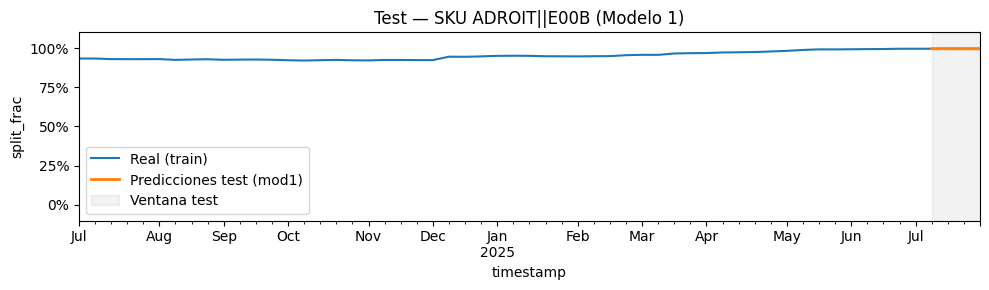

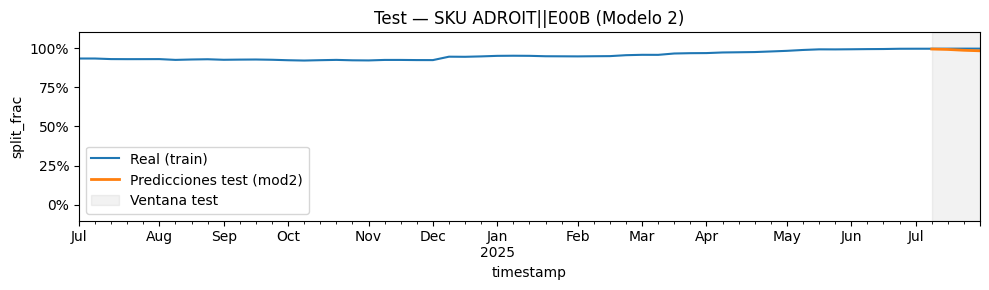

SKU: ANGIOGUARD||EM_L81
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


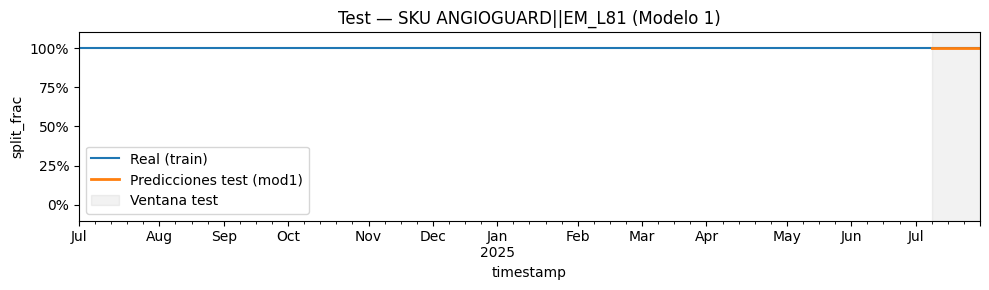

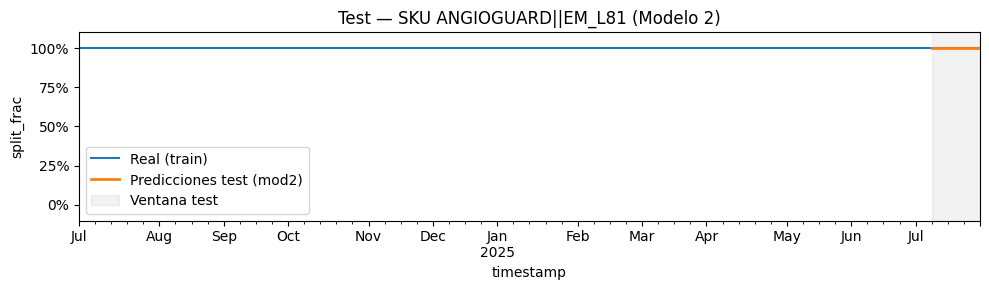

SKU: AQUATRACK||EM_L71
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


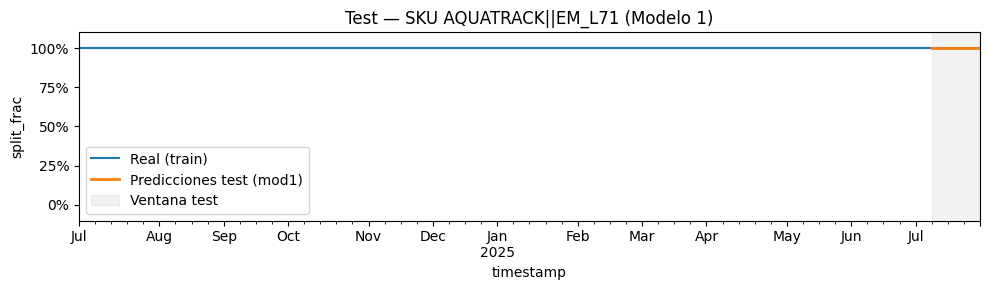

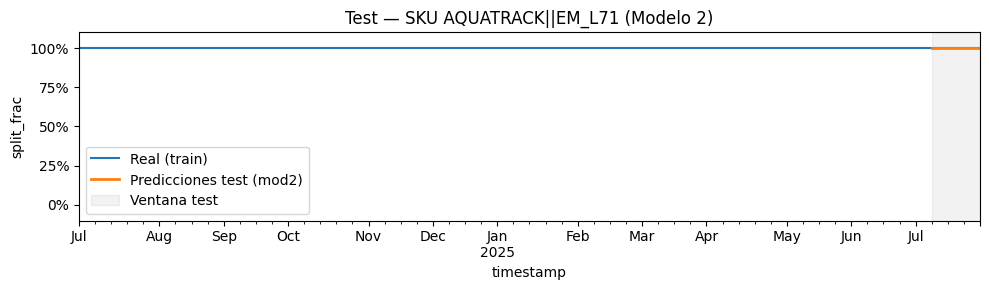

SKU: ARC ROYAL||EM_O01_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.093459          0.102077         0.101198
2025-07-16        0.093870          0.103263         0.090374
2025-07-23        0.093870          0.113717         0.071060
2025-07-30        0.093870          0.115579         0.077606
MAE model1 (split_frac_hat): 0.012577
MAE model2 (split_frac_hat_A): 0.023599


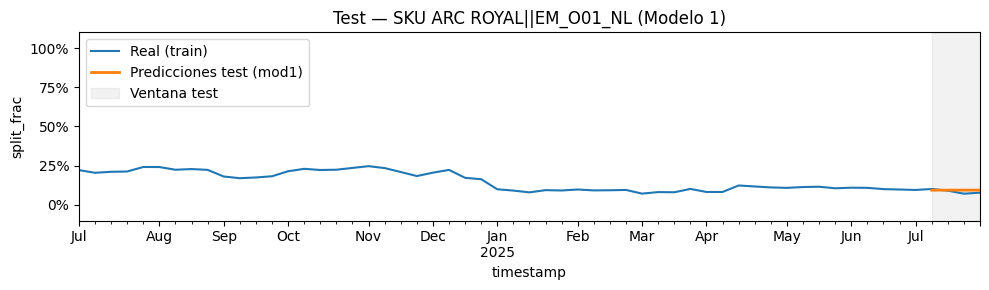

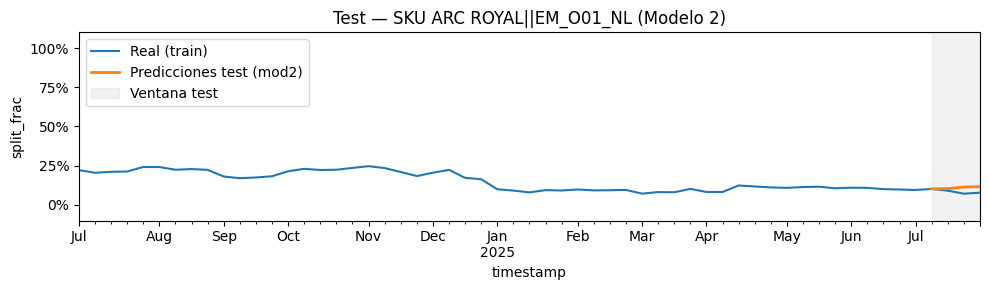

SKU: ARC ROYAL||EM_O02
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.301461          0.303842         0.302728
2025-07-16        0.298387          0.295481         0.252586
2025-07-23        0.298387          0.282547         0.212242
2025-07-30        0.298387          0.278639         0.191411
MAE model1 (split_frac_hat): 0.060047
MAE model2 (split_frac_hat_A): 0.050385


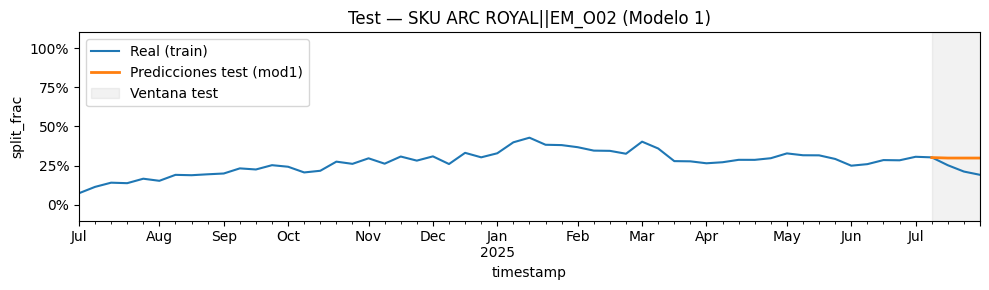

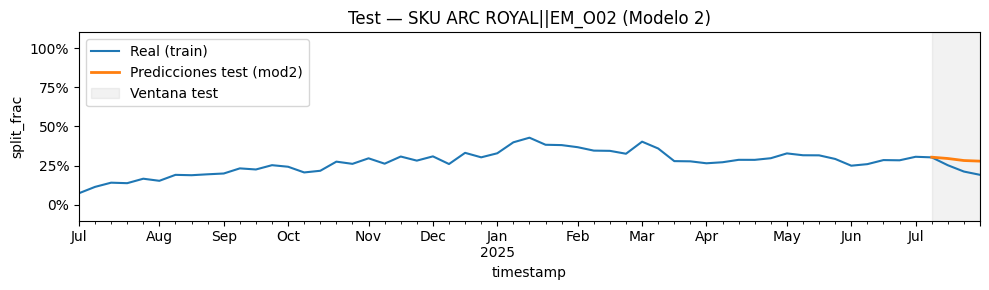

SKU: ARC ROYAL||EM_O02_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.605080          0.594080         0.596073
2025-07-16        0.607743          0.601257         0.657041
2025-07-23        0.607743          0.603737         0.716698
2025-07-30        0.607743          0.605783         0.730983
MAE model1 (split_frac_hat): 0.072625
MAE model2 (split_frac_hat_A): 0.073985


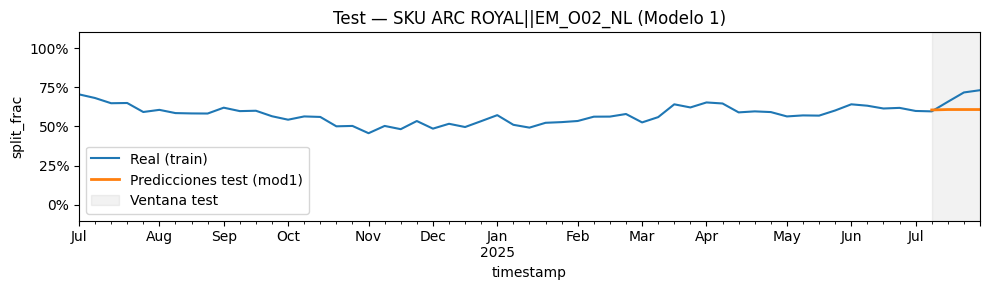

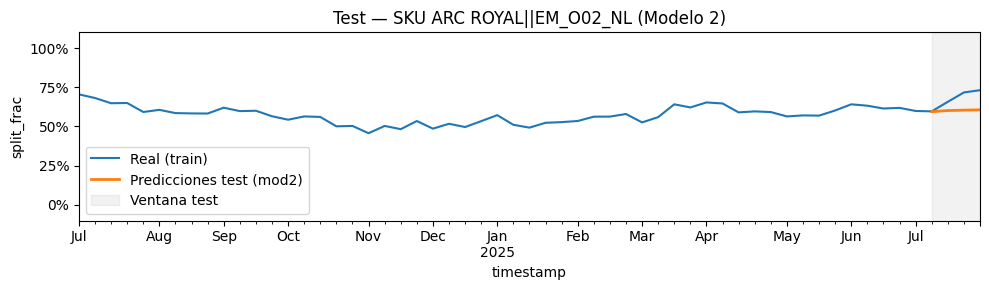

SKU: ATW WIRE MARKER||EM_L51
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.999999          0.999963              1.0
2025-07-16        0.999999          0.999947              1.0
2025-07-23        0.999999          0.999889              1.0
2025-07-30        0.999999          0.999833              1.0
MAE model1 (split_frac_hat): 0.000001
MAE model2 (split_frac_hat_A): 0.000092


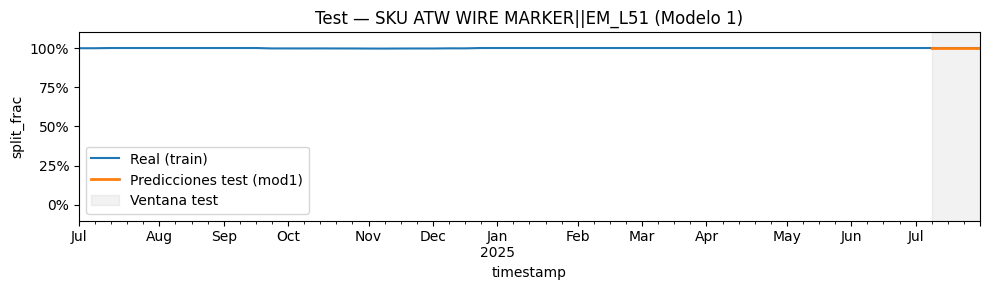

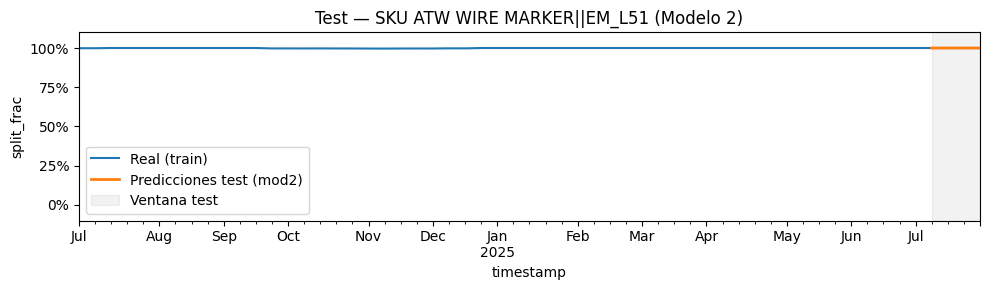

SKU: ATW WIRE MARKER||EM_L51_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.000001          0.000037              0.0
2025-07-16        0.000001          0.000053              0.0
2025-07-23        0.000001          0.000111              0.0
2025-07-30        0.000001          0.000167              0.0
MAE model1 (split_frac_hat): 0.000001
MAE model2 (split_frac_hat_A): 0.000092


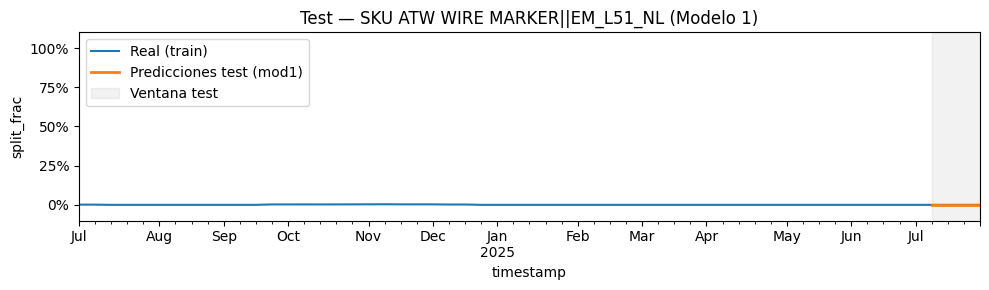

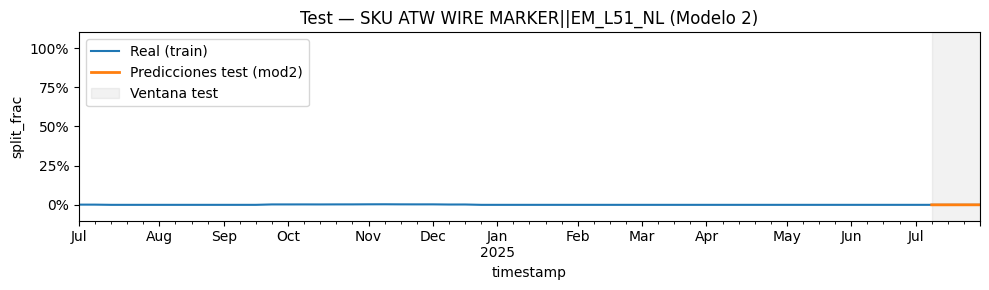

SKU: ATW WIRE||EM_L51
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.999812          0.999514         0.999594
2025-07-16        0.999878          0.999554         0.999619
2025-07-23        0.999876          0.999237         0.999499
2025-07-30        0.999876          0.999109         0.999568
MAE model1 (split_frac_hat): 0.000291
MAE model2 (split_frac_hat_A): 0.000217


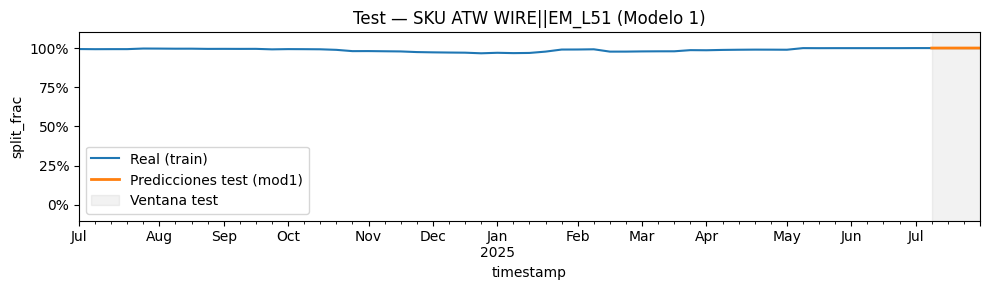

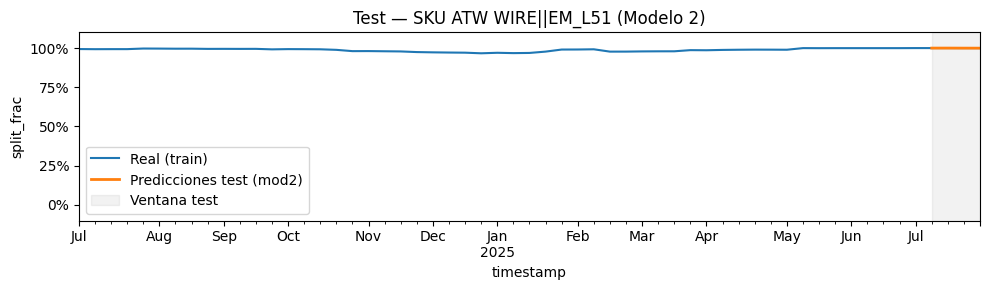

SKU: ATW WIRE||EM_L51_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.000188          0.000486         0.000406
2025-07-16        0.000122          0.000446         0.000381
2025-07-23        0.000124          0.000763         0.000501
2025-07-30        0.000124          0.000891         0.000432
MAE model1 (split_frac_hat): 0.000291
MAE model2 (split_frac_hat_A): 0.000217


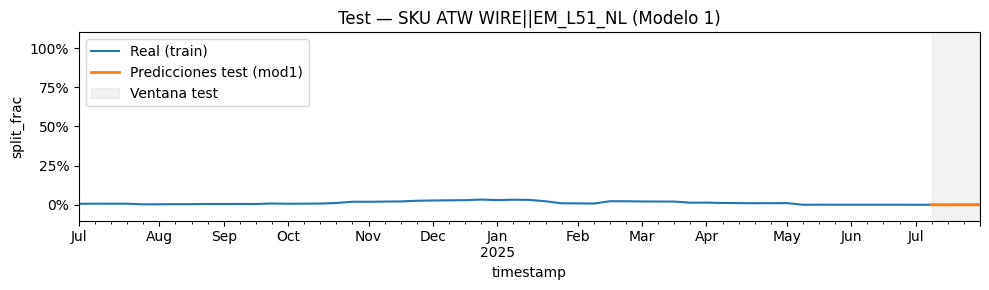

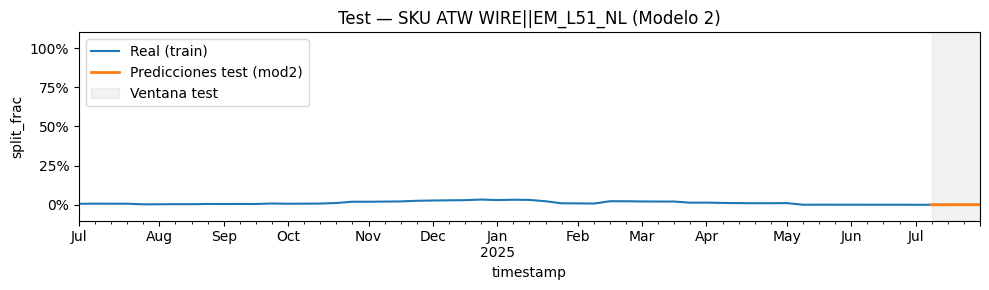

SKU: AVANTI PLUS||A00B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.013633          0.014035         0.014227
2025-07-16        0.012937          0.014261         0.014022
2025-07-23        0.011901          0.014786         0.015969
2025-07-30        0.011901          0.014835         0.015682
MAE model1 (split_frac_hat): 0.002382
MAE model2 (split_frac_hat_A): 0.000615


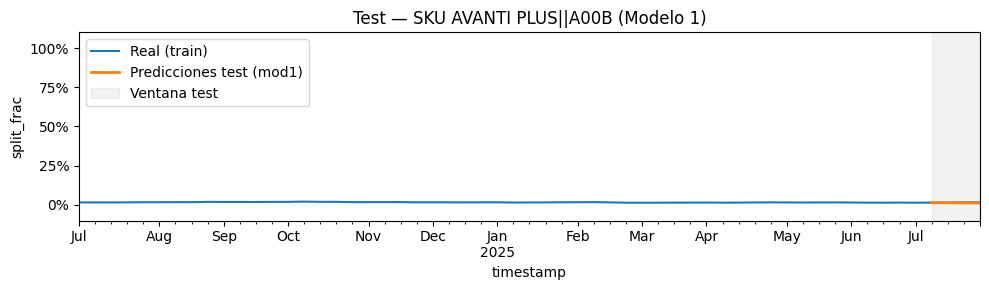

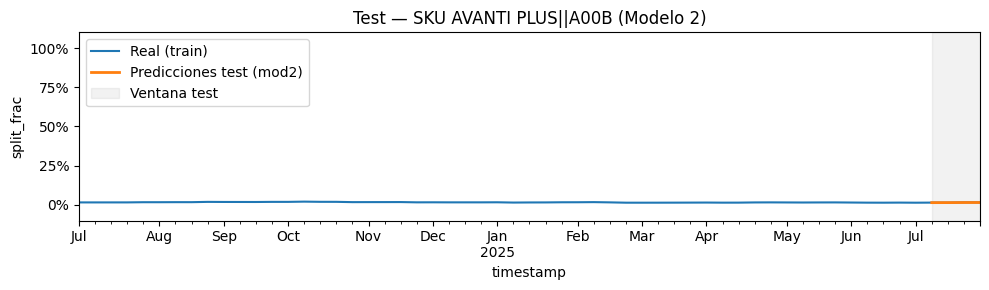

SKU: AVANTI PLUS||A02B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.221692          0.217959         0.232230
2025-07-16        0.214305          0.218168         0.226759
2025-07-23        0.214530          0.211081         0.218484
2025-07-30        0.214530          0.212123         0.225330
MAE model1 (split_frac_hat): 0.009436
MAE model2 (split_frac_hat_A): 0.010868


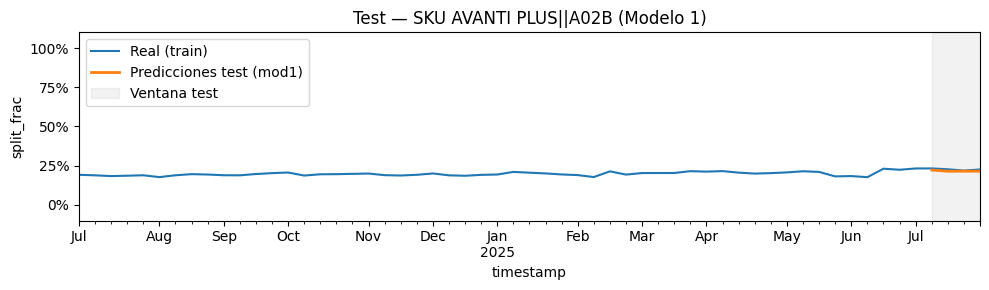

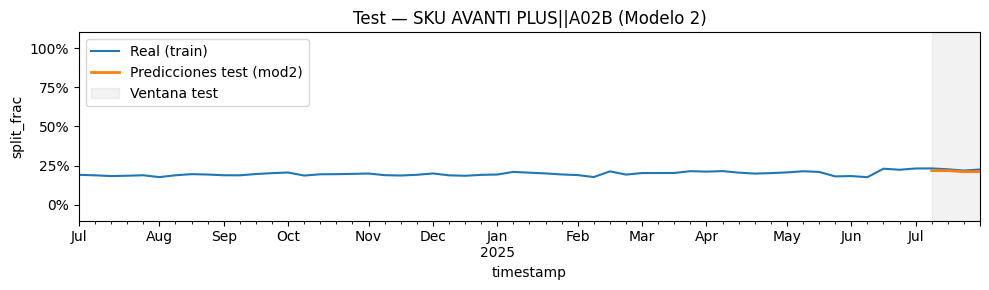

SKU: AVANTI PLUS||A02C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.764675          0.768006         0.753543
2025-07-16        0.772758          0.767571         0.759219
2025-07-23        0.773569          0.774133         0.765547
2025-07-30        0.773569          0.773042         0.758989
MAE model1 (split_frac_hat): 0.011818
MAE model2 (split_frac_hat_A): 0.011364


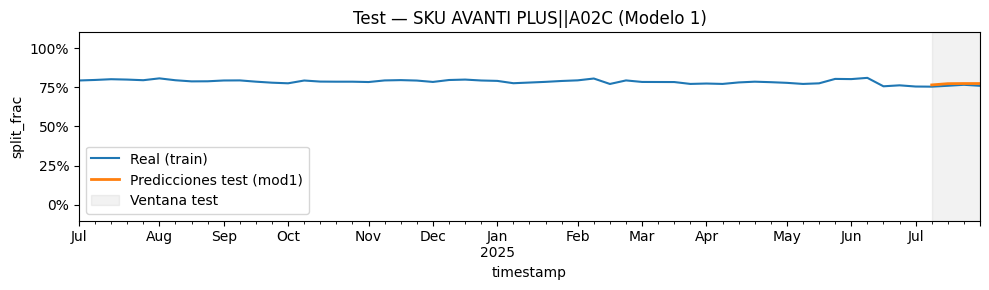

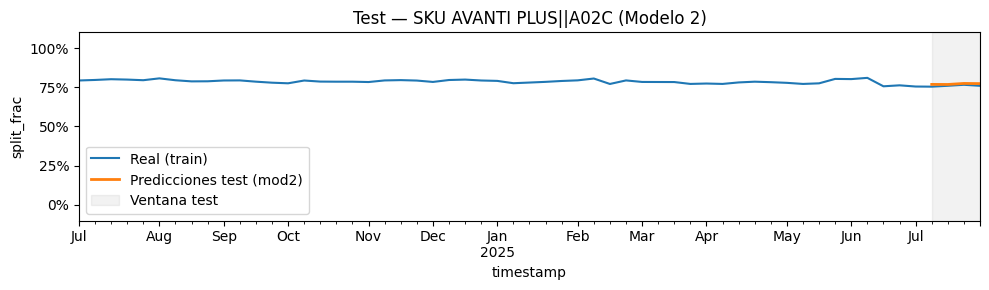

SKU: AVIATOR PLUS||EM_D03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


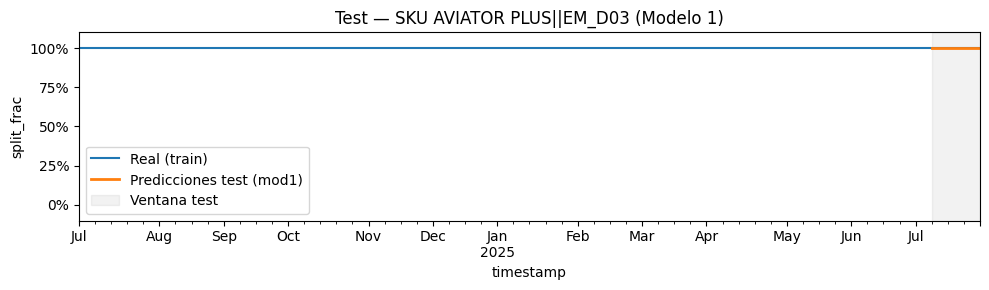

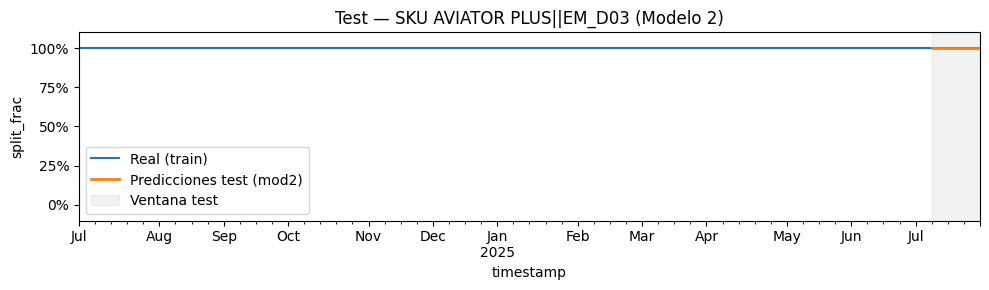

SKU: BIOPSY FORCEPS STD||EM_F20
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


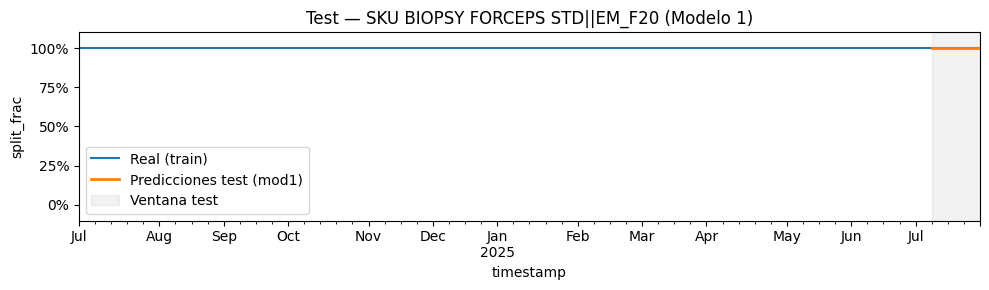

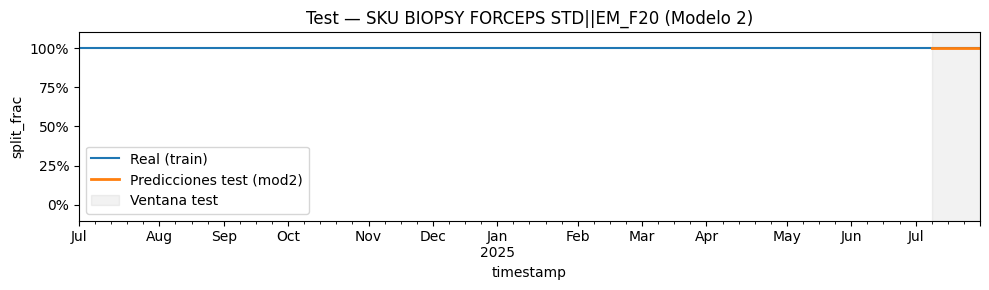

SKU: BIPAL||EM_F10
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


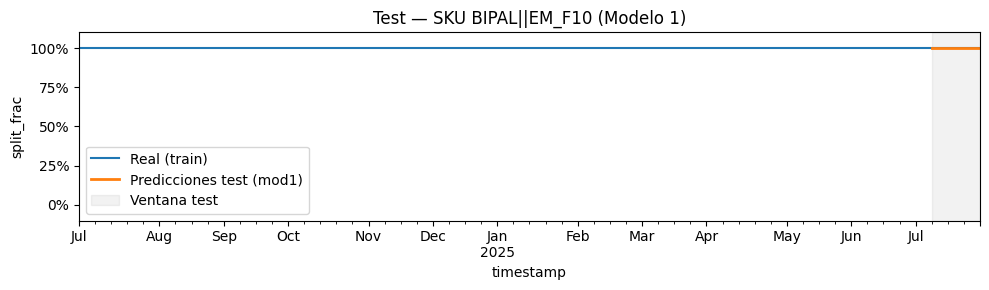

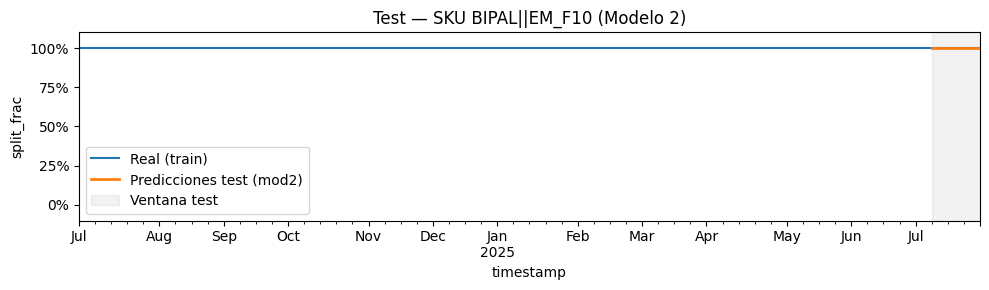

SKU: BLUE on AVIATOR||EM_D03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


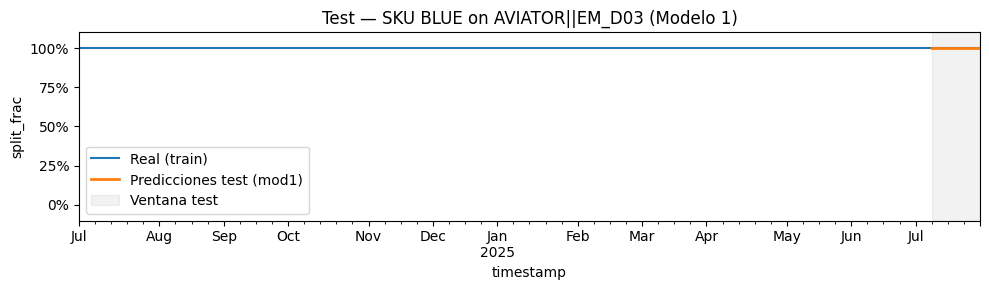

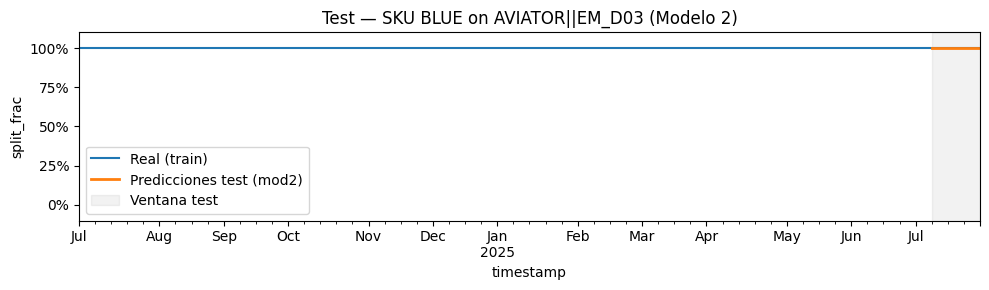

SKU: BLUE on SLALOM||EM_D03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


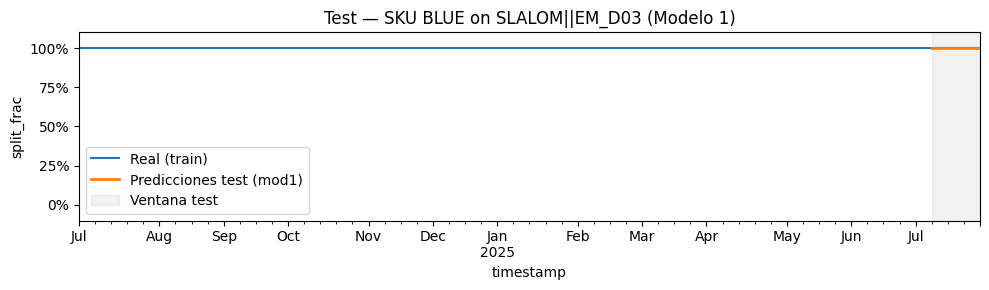

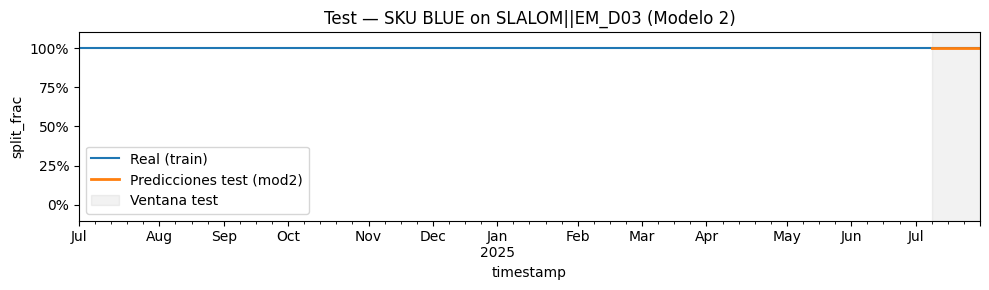

SKU: BRITE TIP (MODIFIED)||A00B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.906599          0.919492         0.973289
2025-07-16        0.906829          0.905367         0.974277
2025-07-23        0.904613          0.890814         0.974882
2025-07-30        0.904657          0.879815         0.863905
MAE model1 (split_frac_hat): 0.061290
MAE model2 (split_frac_hat_A): 0.055671


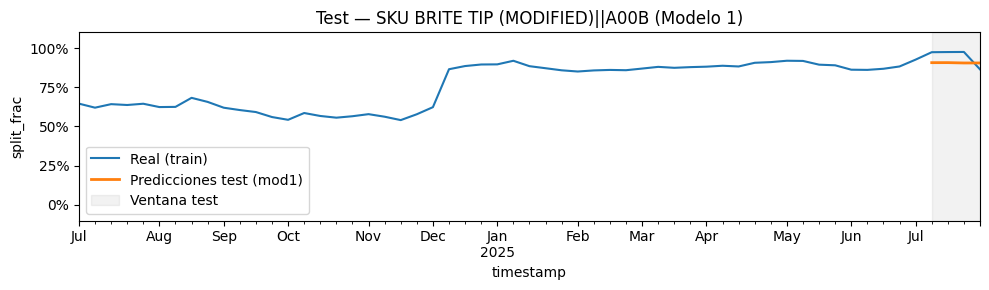

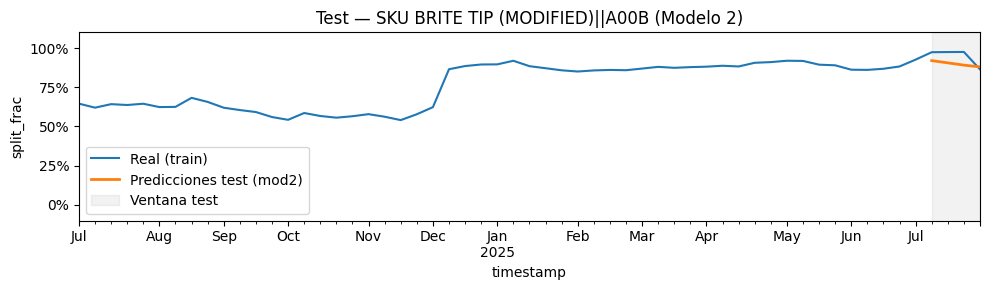

SKU: BRITE TIP (MODIFIED)||A02C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.093401          0.080508         0.026711
2025-07-16        0.093171          0.094633         0.025723
2025-07-23        0.095387          0.109186         0.025118
2025-07-30        0.095343          0.120185         0.136095
MAE model1 (split_frac_hat): 0.061290
MAE model2 (split_frac_hat_A): 0.055671


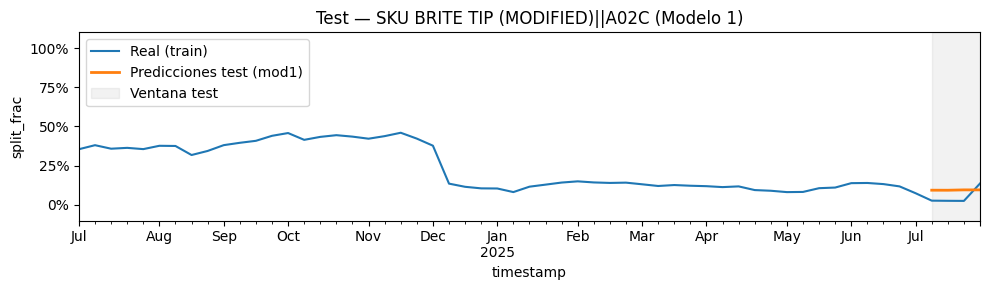

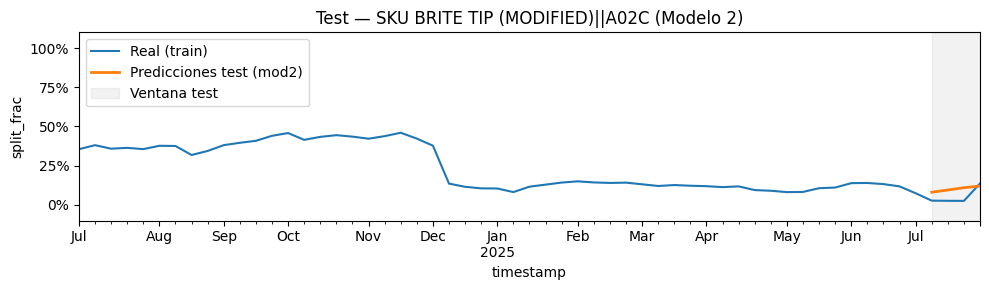

SKU: BRITE TIP RADIANZ||T03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


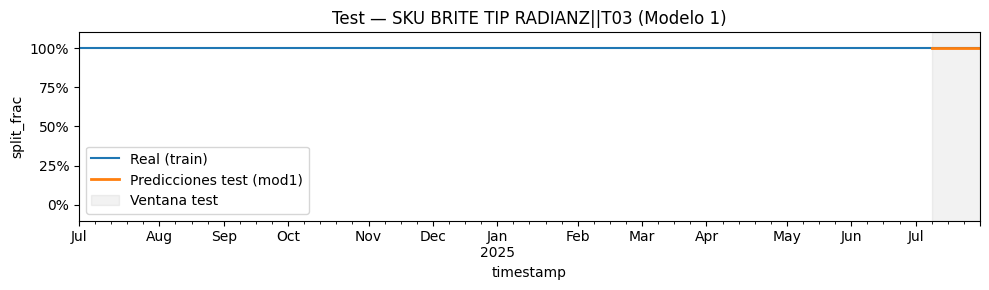

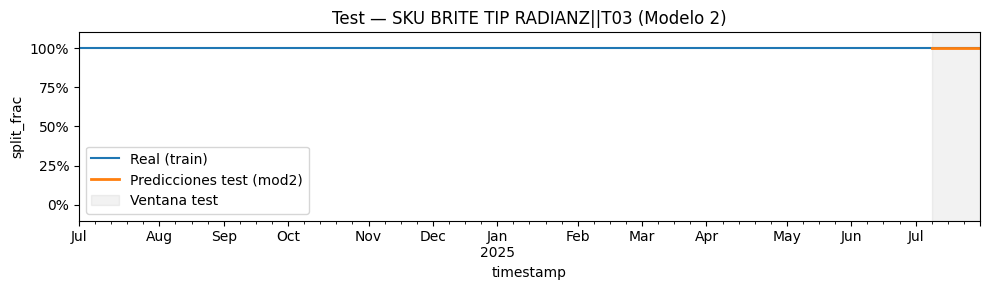

SKU: BRITE TIP||A00A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.266839          0.267481         0.271136
2025-07-16        0.266759          0.267429         0.269281
2025-07-23        0.266759          0.267562         0.270696
2025-07-30        0.266759          0.267307         0.267288
MAE model1 (split_frac_hat): 0.002821
MAE model2 (split_frac_hat_A): 0.002165


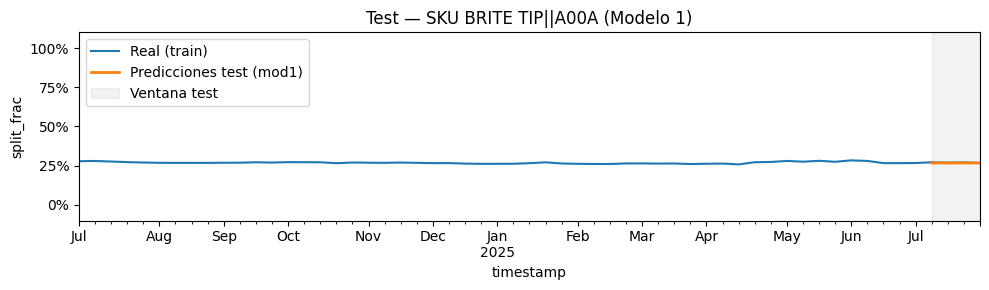

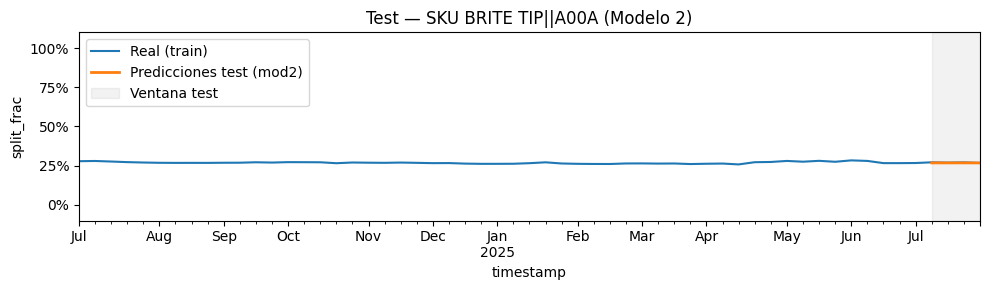

SKU: BRITE TIP||A02A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.733161          0.732519         0.728864
2025-07-16        0.733241          0.732571         0.730719
2025-07-23        0.733241          0.732438         0.729304
2025-07-30        0.733241          0.732693         0.732712
MAE model1 (split_frac_hat): 0.002821
MAE model2 (split_frac_hat_A): 0.002165


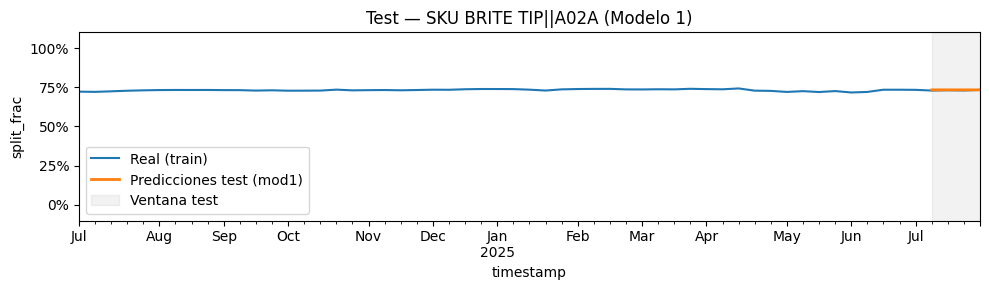

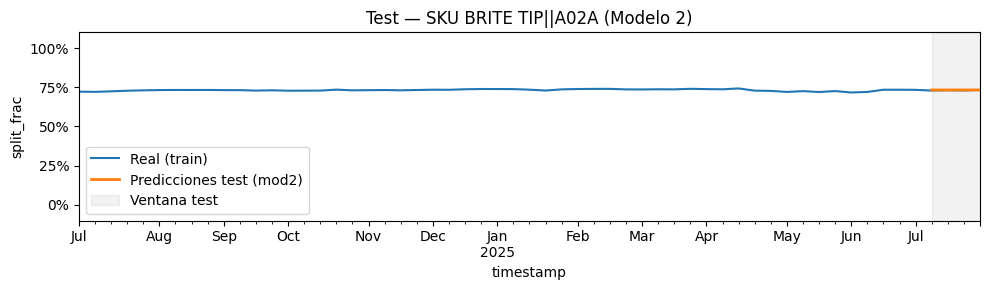

SKU: CATH EXT||C05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


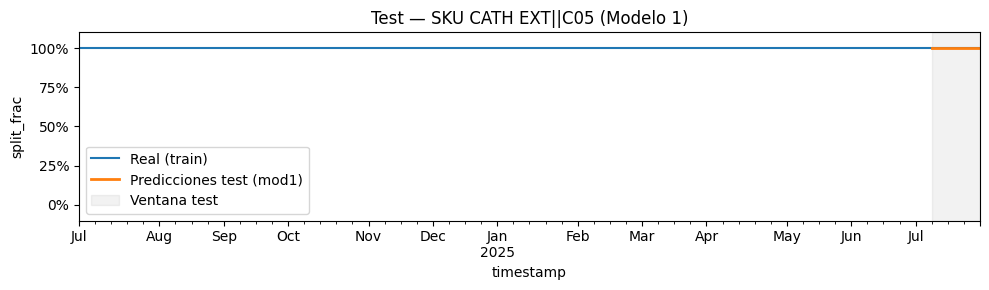

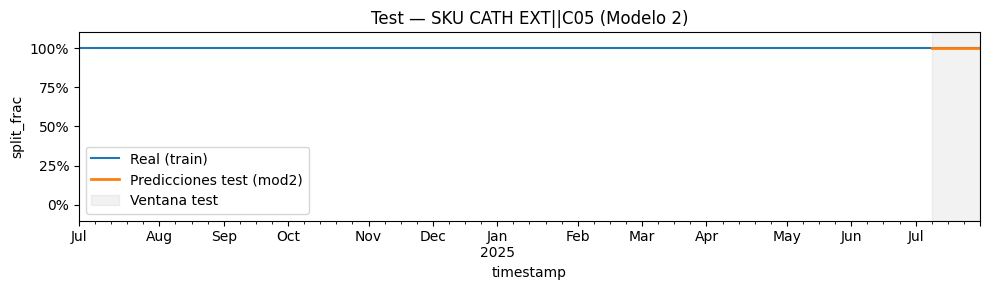

SKU: CORPACK (MODIFIED)||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


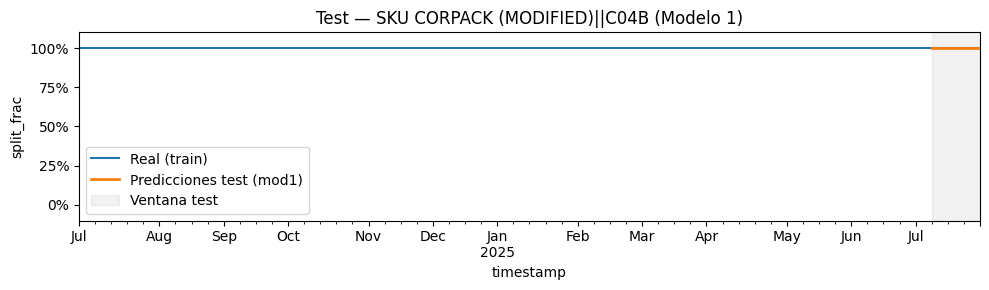

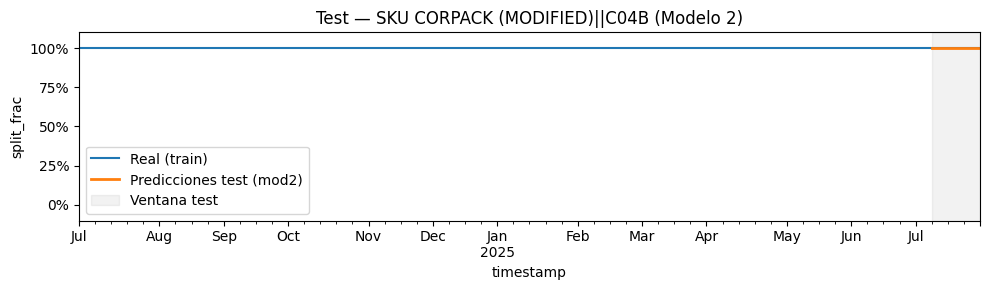

SKU: CORPACK||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


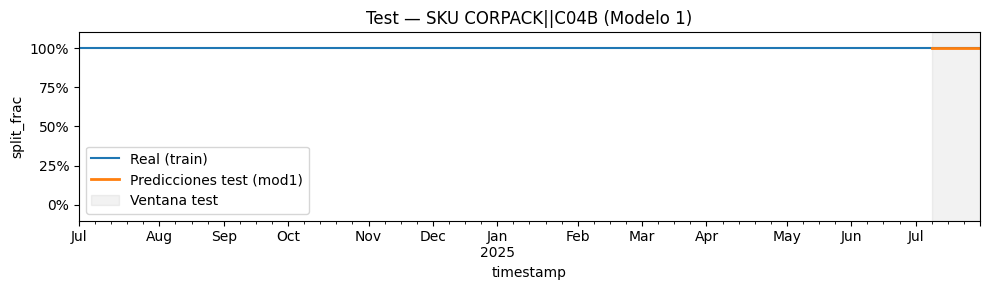

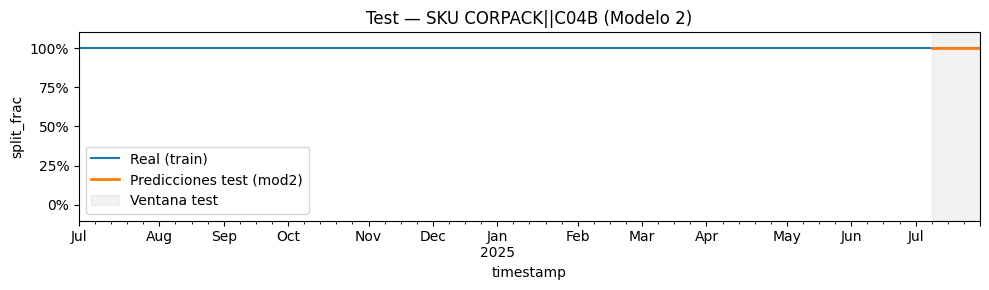

SKU: ELITECROSS||EM_X12
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


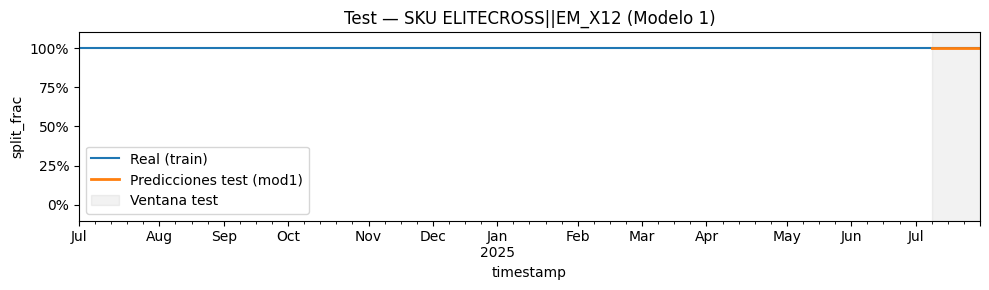

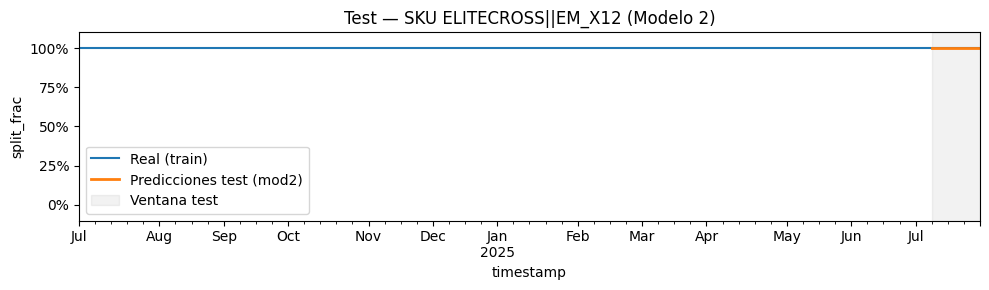

SKU: EMERALD||EM_L01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.852734          0.850210         0.854299
2025-07-16        0.852734          0.848447         0.850974
2025-07-23        0.852734          0.844751         0.840776
2025-07-30        0.852825          0.844366         0.842447
MAE model1 (split_frac_hat): 0.006415
MAE model2 (split_frac_hat_A): 0.003127


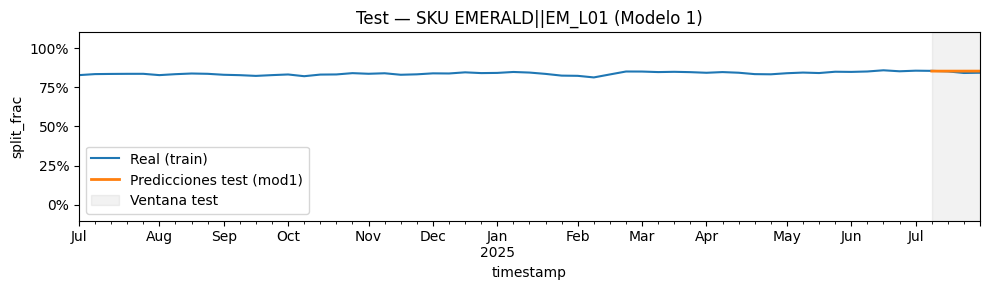

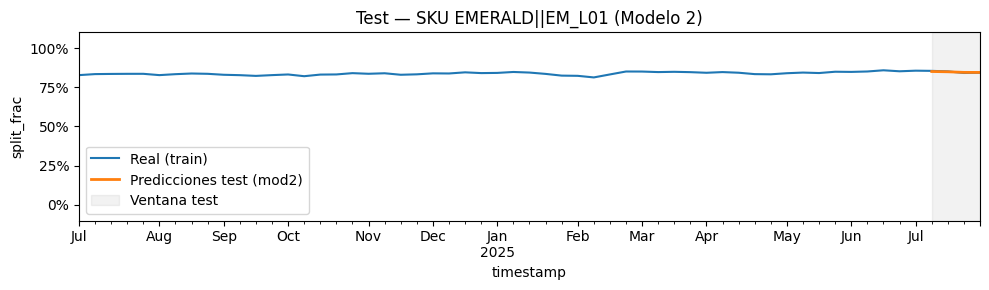

SKU: EMERALD||EM_L01_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.147266          0.149790         0.145701
2025-07-16        0.147266          0.151553         0.149026
2025-07-23        0.147266          0.155249         0.159224
2025-07-30        0.147175          0.155634         0.157553
MAE model1 (split_frac_hat): 0.006415
MAE model2 (split_frac_hat_A): 0.003127


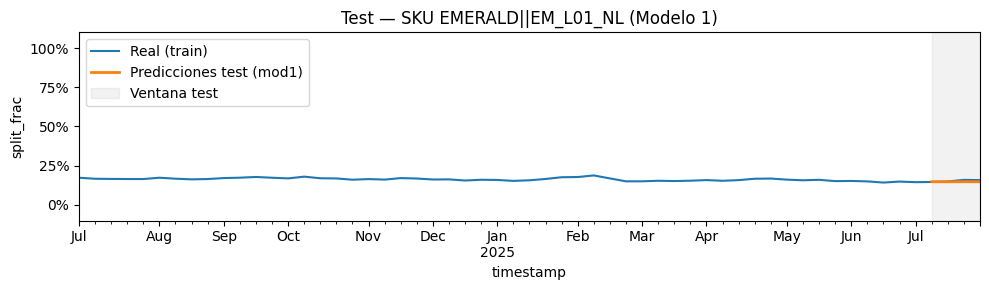

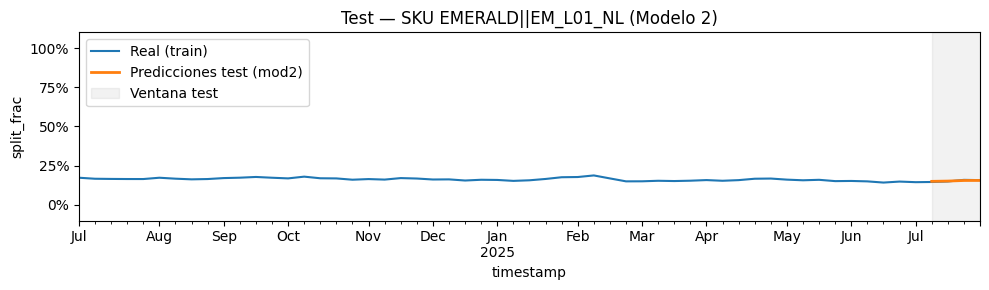

SKU: ENROUTE||T02B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


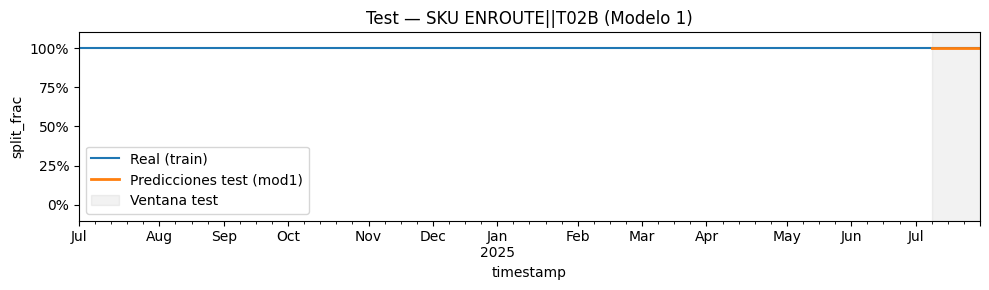

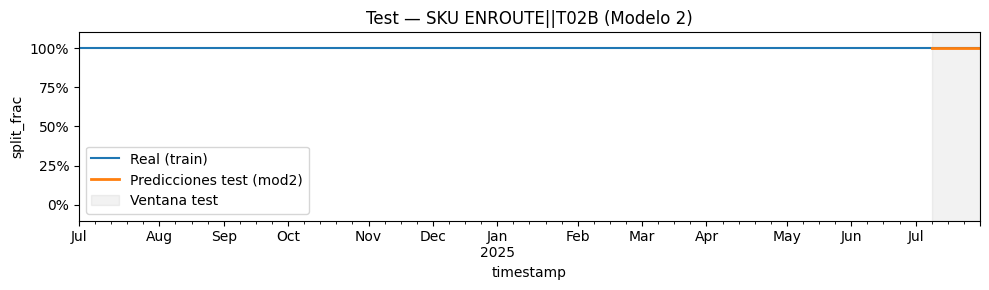

SKU: EXOSEAL||V00
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


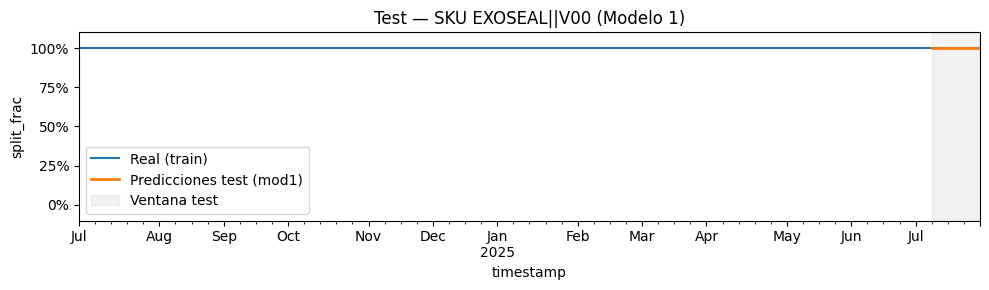

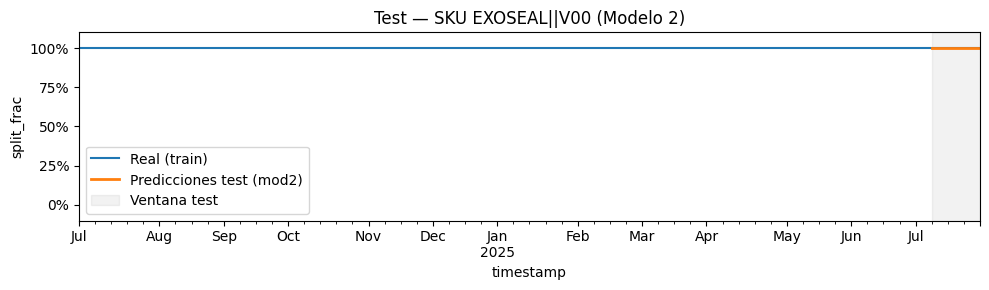

SKU: FRONTRUNNER||X00
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


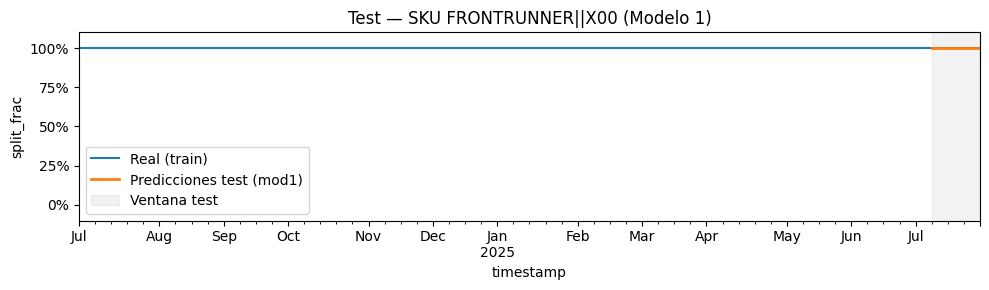

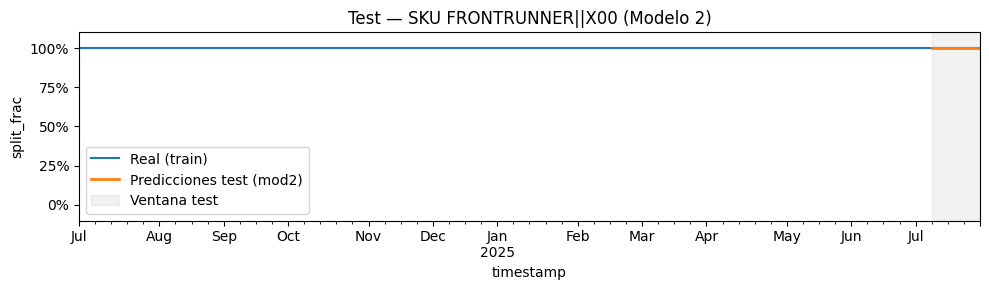

SKU: GENESIS UNMOUNTED||EM_D03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.329801          0.334194         0.344231
2025-07-16        0.329507          0.330008         0.324165
2025-07-23        0.329604          0.317437         0.267477
2025-07-30        0.329899          0.307607         0.251170
MAE model1 (split_frac_hat): 0.040157
MAE model2 (split_frac_hat_A): 0.030569


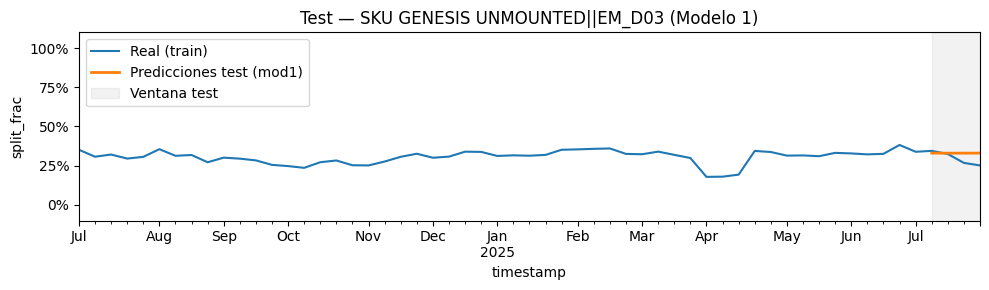

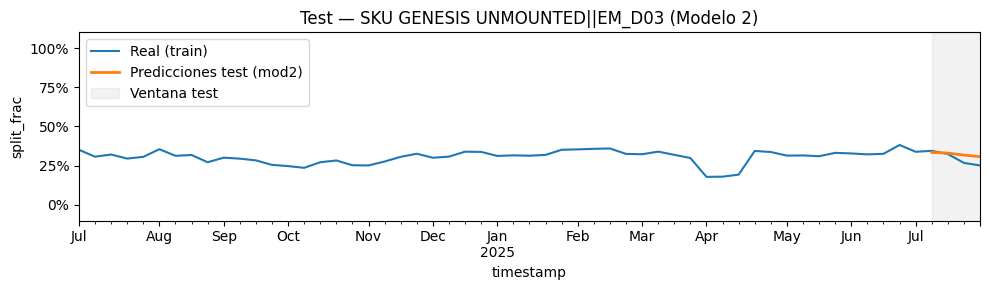

SKU: GENESIS UNMOUNTED||EM_U90
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.670199          0.665806         0.655769
2025-07-16        0.670493          0.669992         0.675835
2025-07-23        0.670396          0.682563         0.732523
2025-07-30        0.670101          0.692393         0.748830
MAE model1 (split_frac_hat): 0.040157
MAE model2 (split_frac_hat_A): 0.030569


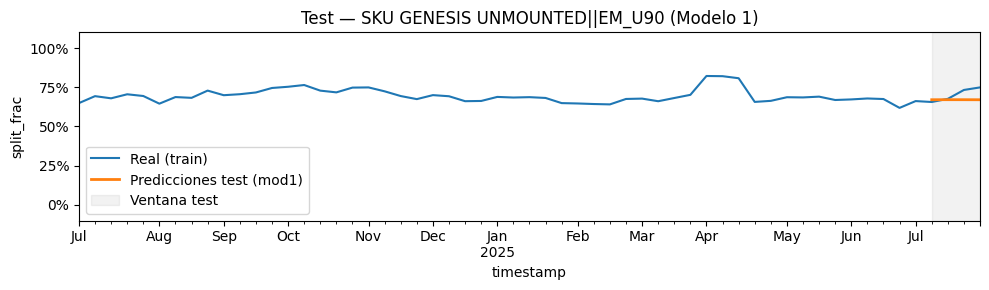

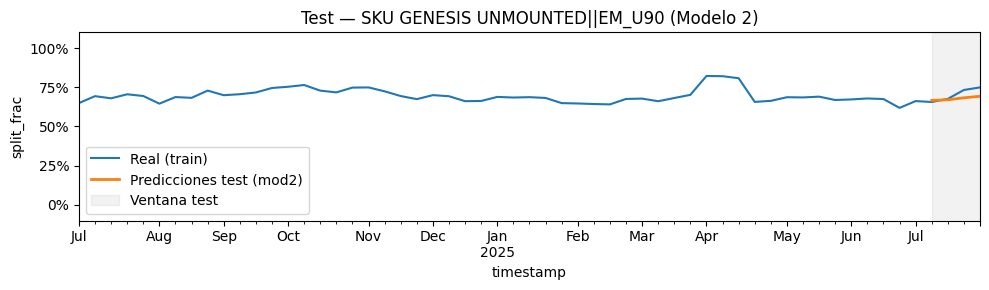

SKU: GENESIS on PRO||EM_D01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


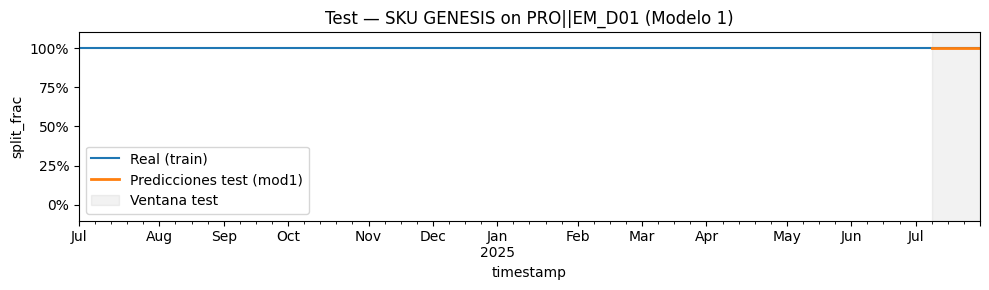

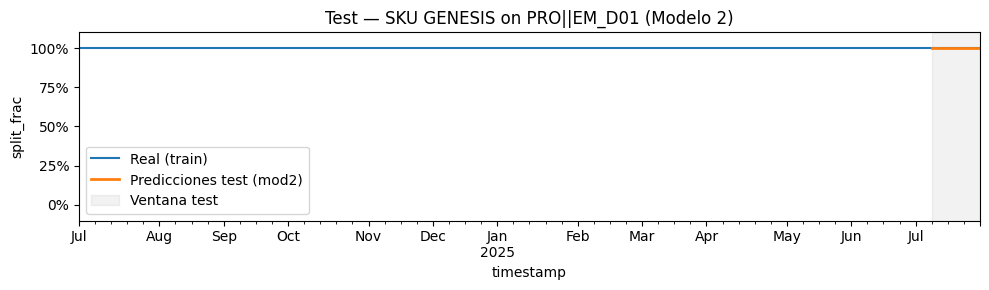

SKU: GENESIS on SLALOM||EM_D03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


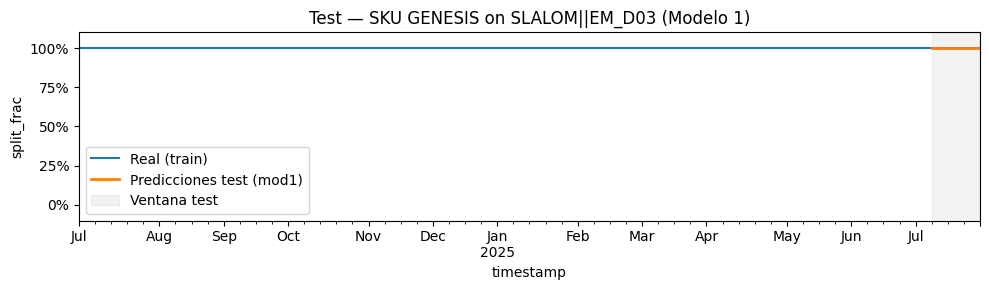

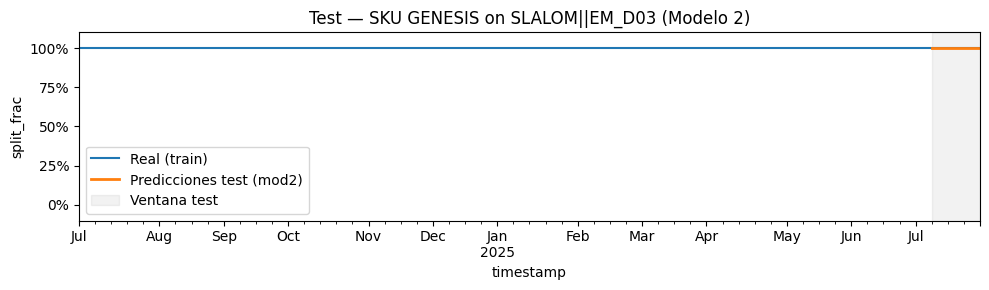

SKU: HIGH FLOW||C04D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


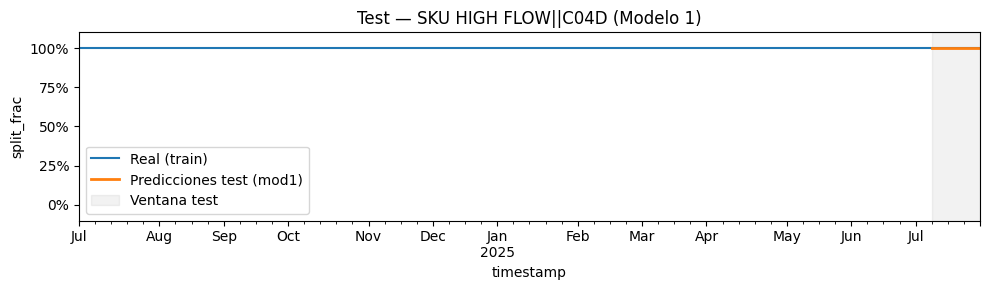

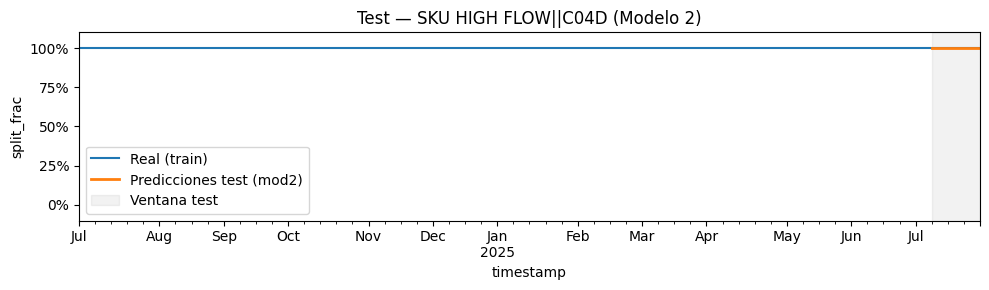

SKU: IKAZUCHI ZERO||EM_O84_NL_CN
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


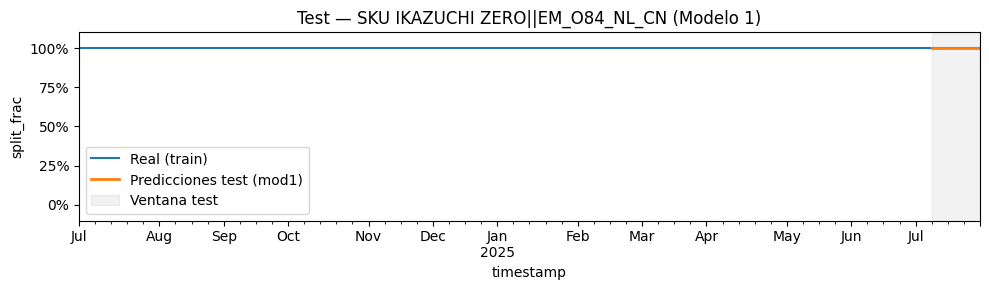

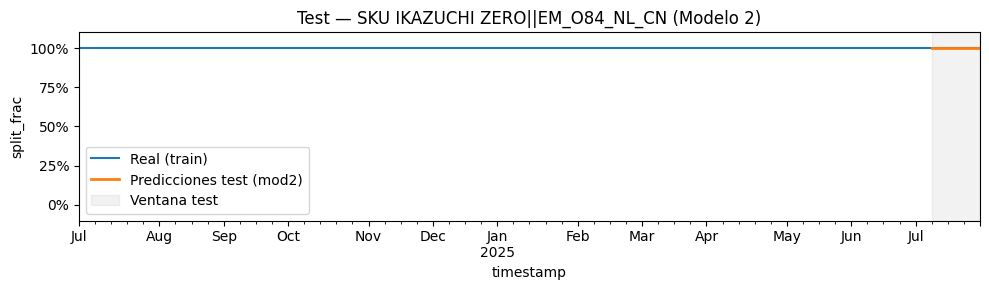

SKU: INCRAFT||N03A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.244385          0.258876         0.257504
2025-07-16        0.241719          0.259674         0.264777
2025-07-23        0.241719          0.263465         0.264750
2025-07-30        0.245056          0.269687         0.268632
MAE model1 (split_frac_hat): 0.020696
MAE model2 (split_frac_hat_A): 0.002204


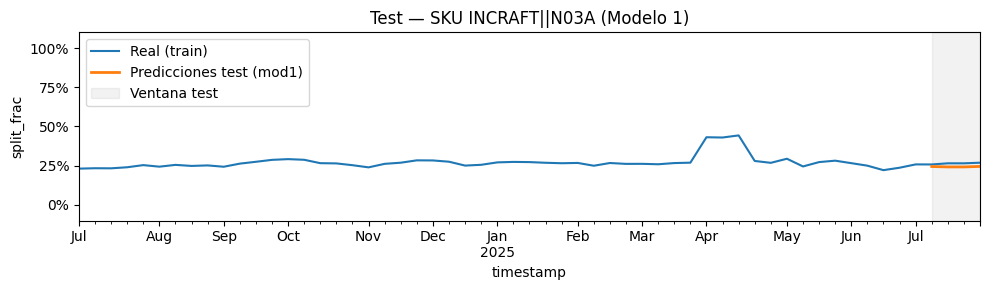

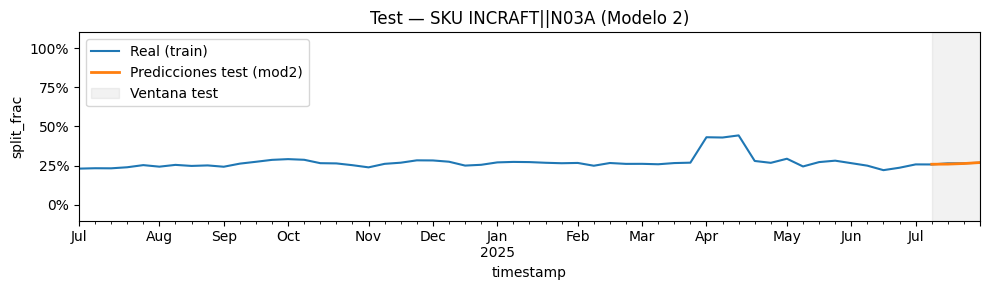

SKU: INCRAFT||N03B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.755615          0.741124         0.742496
2025-07-16        0.758281          0.740326         0.735223
2025-07-23        0.758281          0.736535         0.735250
2025-07-30        0.754944          0.730313         0.731368
MAE model1 (split_frac_hat): 0.020696
MAE model2 (split_frac_hat_A): 0.002204


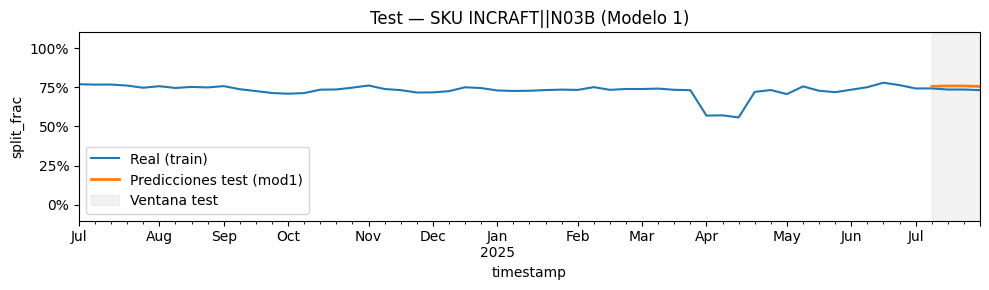

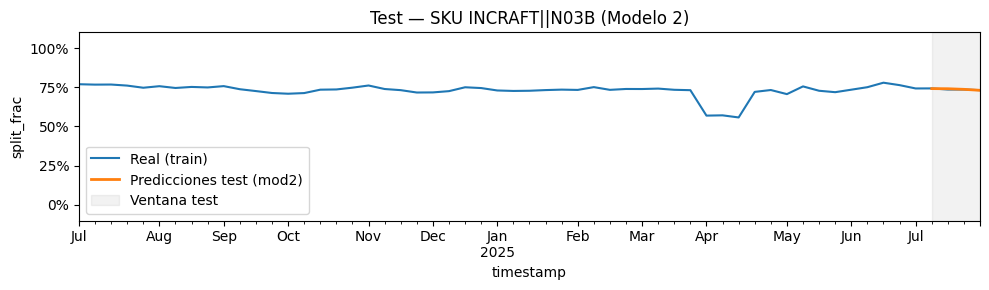

SKU: INFINITI (MODIFIED)||C05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


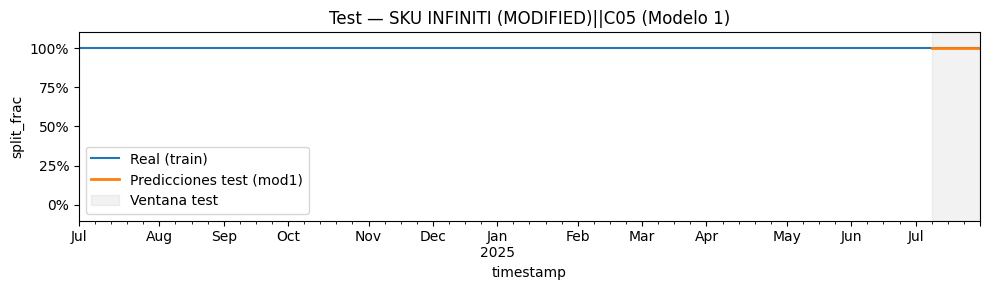

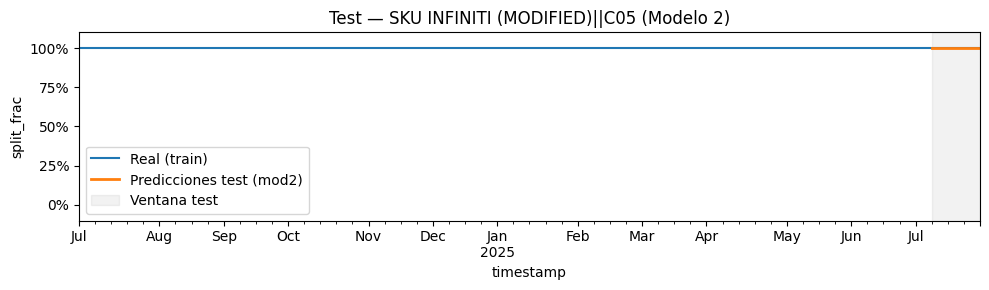

SKU: INFINITI AMBI||C12A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.737638          0.747457         0.701517
2025-07-16        0.726807          0.755288         0.716949
2025-07-23        0.729911          0.765596         0.761832
2025-07-30        0.727054          0.758342         0.763758
MAE model1 (split_frac_hat): 0.028651
MAE model2 (split_frac_hat_A): 0.023365


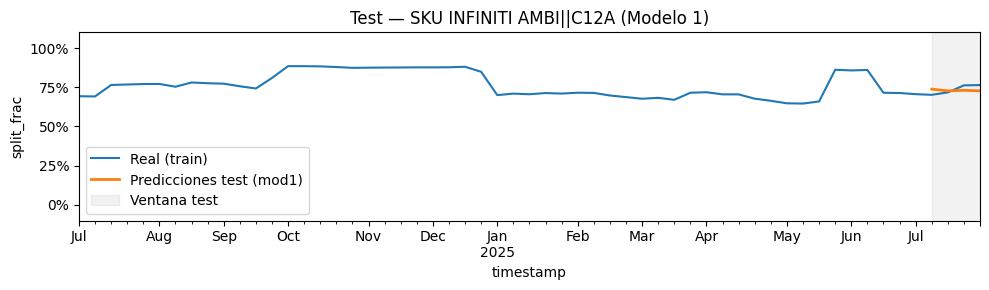

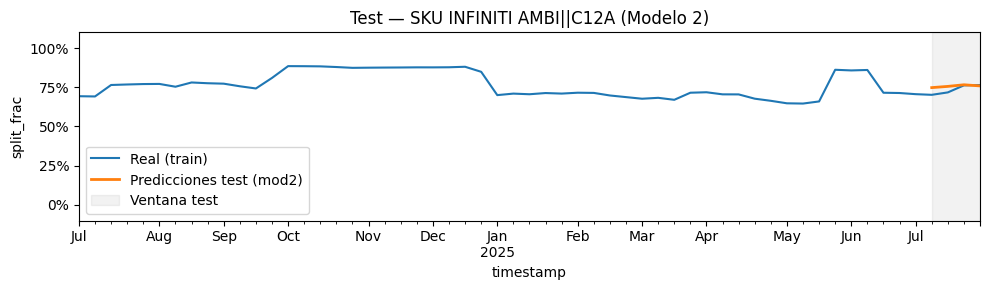

SKU: INFINITI AMBI||C12B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.262362          0.252543         0.298483
2025-07-16        0.273193          0.244712         0.283051
2025-07-23        0.270089          0.234404         0.238168
2025-07-30        0.272946          0.241658         0.236242
MAE model1 (split_frac_hat): 0.028651
MAE model2 (split_frac_hat_A): 0.023365


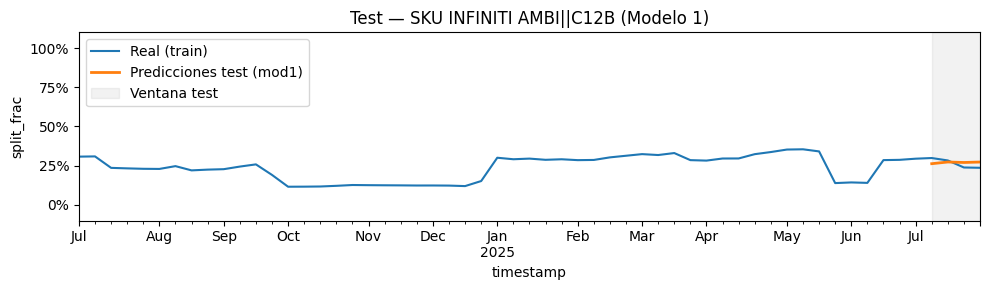

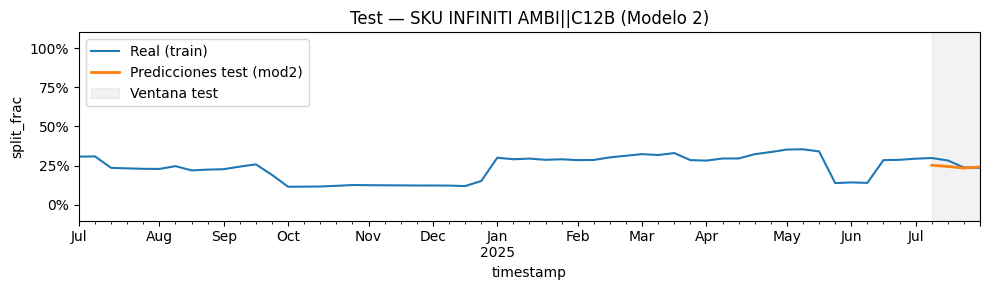

SKU: INFINITI||C04A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.006490          0.006420         0.006026
2025-07-16        0.006558          0.006511         0.006091
2025-07-23        0.006998          0.006773         0.006686
2025-07-30        0.007008          0.007086         0.005415
MAE model1 (split_frac_hat): 0.000709
MAE model2 (split_frac_hat_A): 0.000643


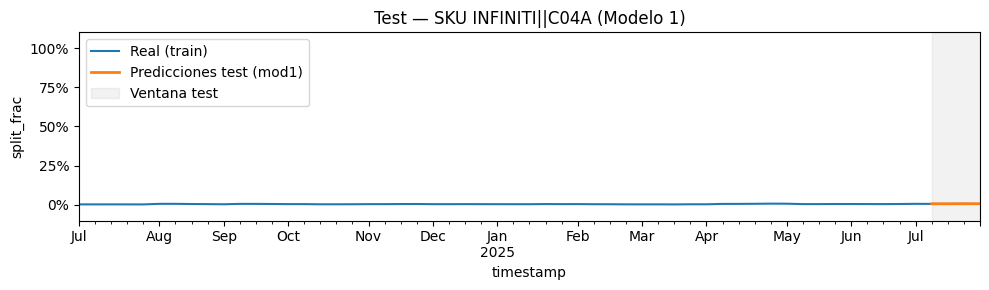

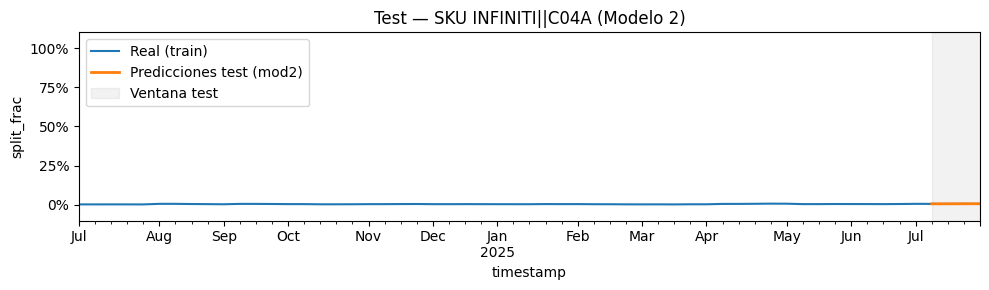

SKU: INFINITI||C04C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.028390          0.026269         0.027274
2025-07-16        0.030240          0.025628         0.027117
2025-07-23        0.027413          0.025338         0.026703
2025-07-30        0.025949          0.025374         0.025613
MAE model1 (split_frac_hat): 0.001322
MAE model2 (split_frac_hat_A): 0.001024


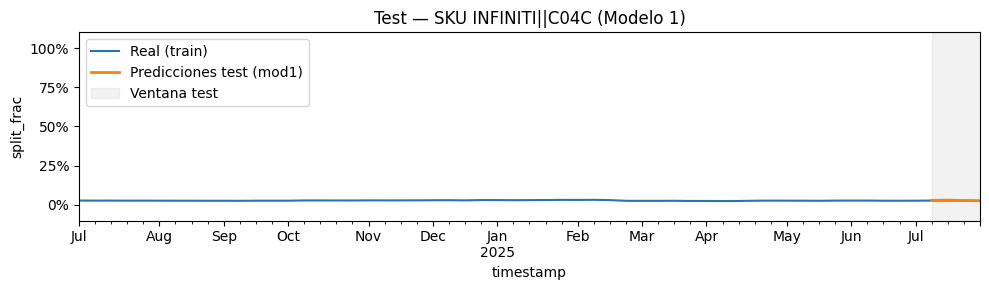

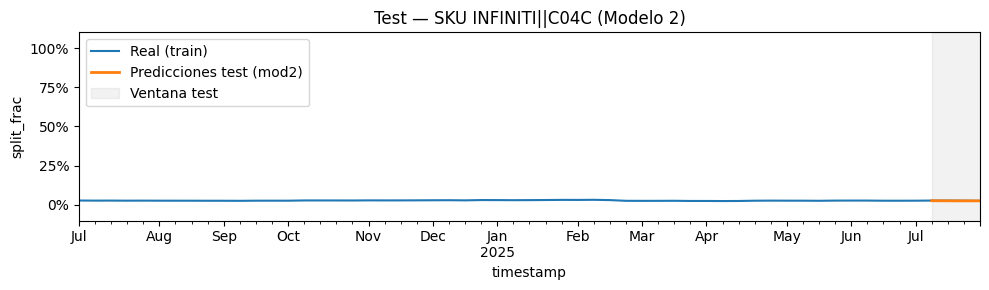

SKU: INFINITI||C04D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.062806          0.066180         0.067172
2025-07-16        0.059285          0.066317         0.068949
2025-07-23        0.059432          0.067405         0.077593
2025-07-30        0.059521          0.067501         0.074152
MAE model1 (split_frac_hat): 0.011706
MAE model2 (split_frac_hat_A): 0.005115


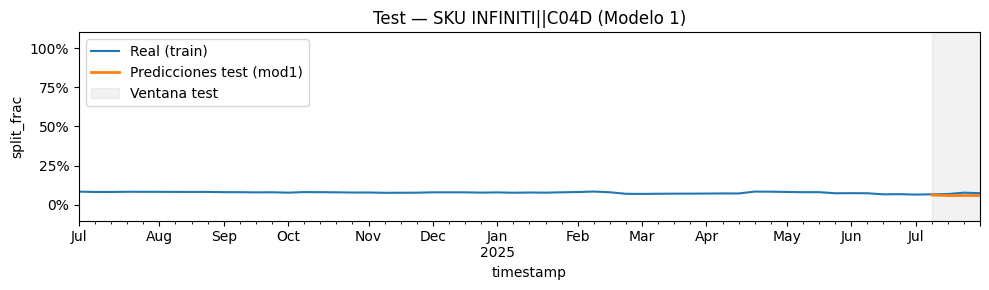

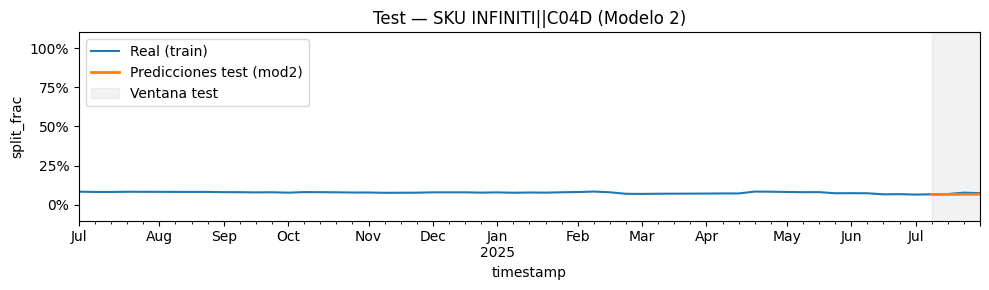

SKU: INFINITI||C12A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.509089          0.502029         0.499995
2025-07-16        0.509994          0.505428         0.503136
2025-07-23        0.511258          0.511886         0.553382
2025-07-30        0.512027          0.513561         0.551599
MAE model1 (split_frac_hat): 0.024412
MAE model2 (split_frac_hat_A): 0.020965


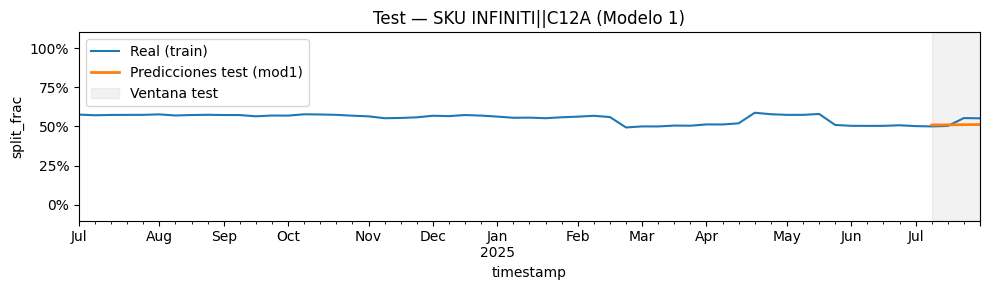

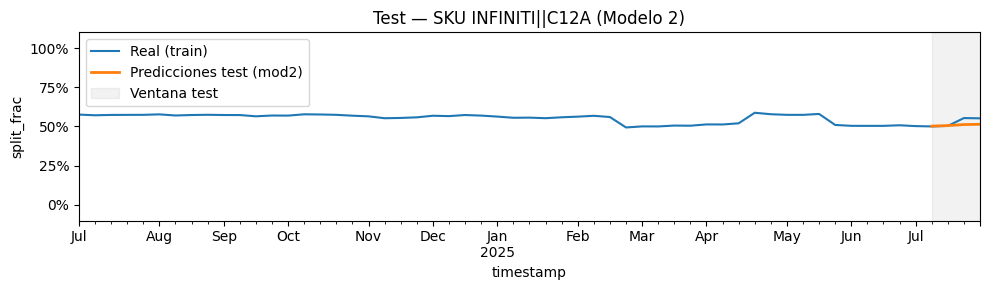

SKU: INFINITI||C12B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.393225          0.399102         0.399534
2025-07-16        0.393924          0.396115         0.394707
2025-07-23        0.394900          0.388598         0.335636
2025-07-30        0.395494          0.386478         0.343221
MAE model1 (split_frac_hat): 0.029657
MAE model2 (split_frac_hat_A): 0.024515


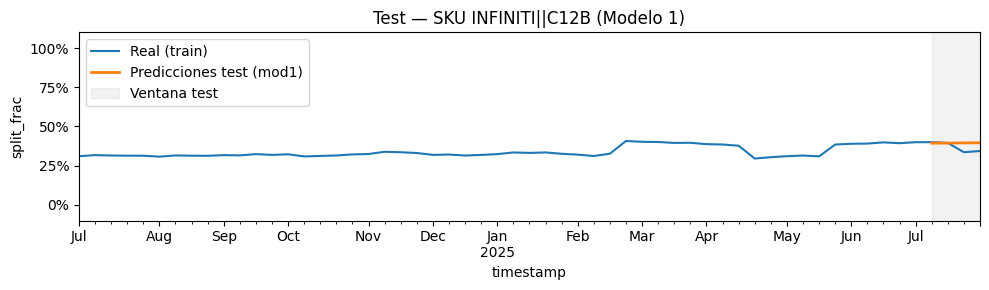

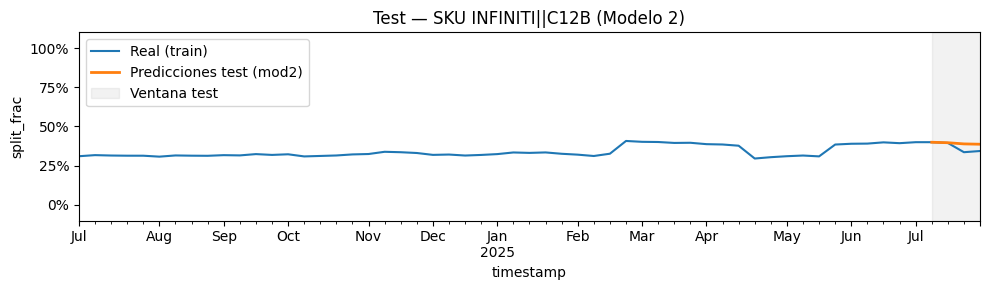

SKU: Long Sheath||A00A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


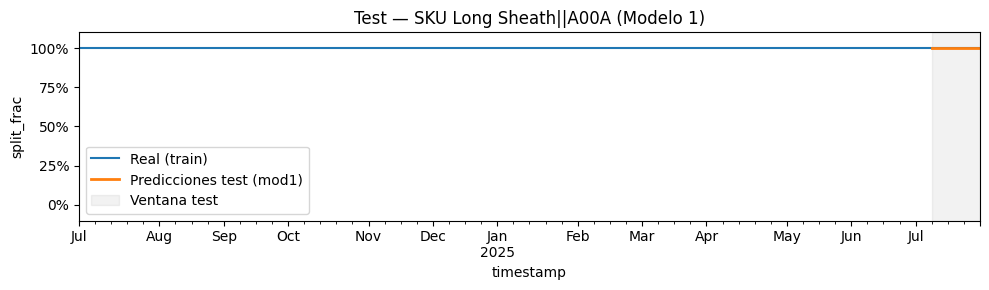

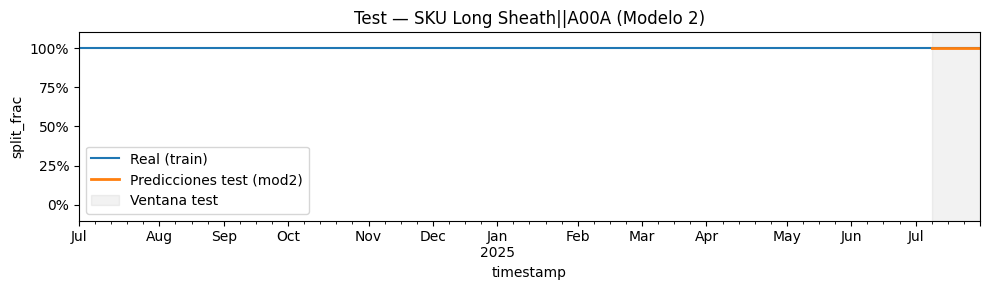

SKU: MAXI||EM_D05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


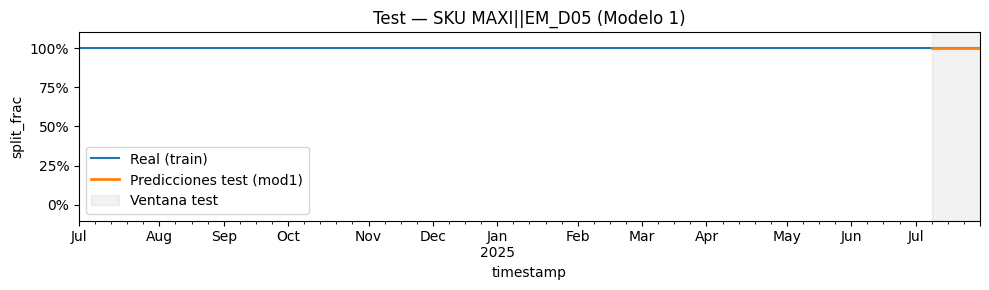

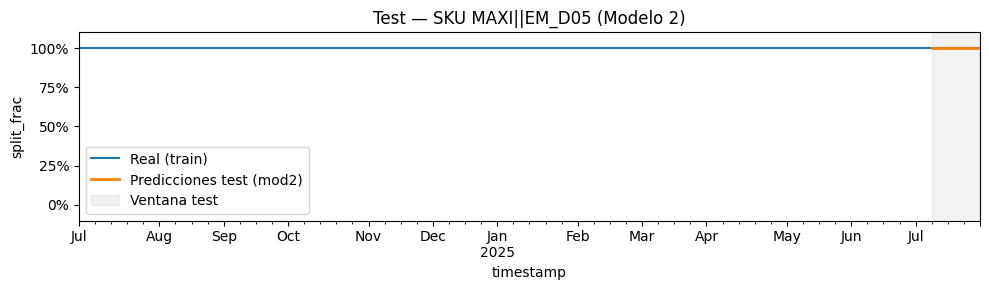

SKU: MULTIPACK (MODIFIED)||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.999999          1.000000              1.0
2025-07-16        0.999999          1.000000              1.0
2025-07-23        0.999999          0.999941              1.0
2025-07-30        0.999999          0.999905              1.0
MAE model1 (split_frac_hat): 0.000001
MAE model2 (split_frac_hat_A): 0.000039


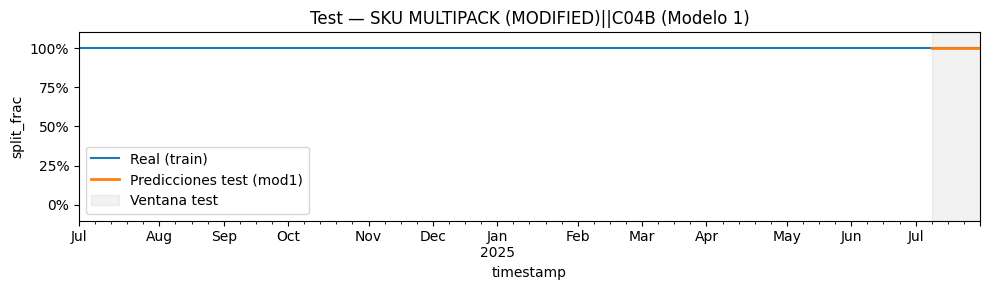

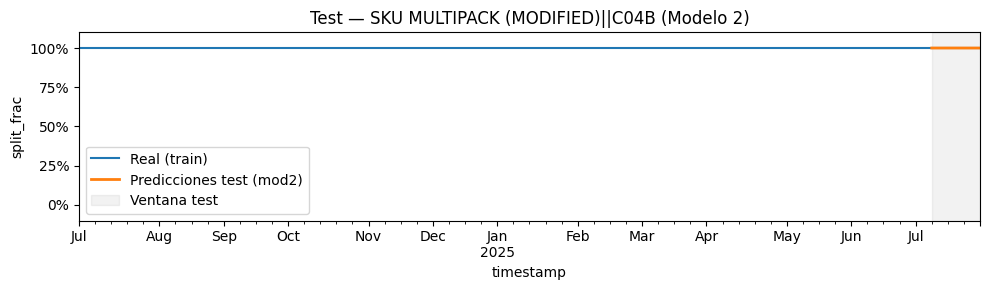

SKU: MULTIPACK||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


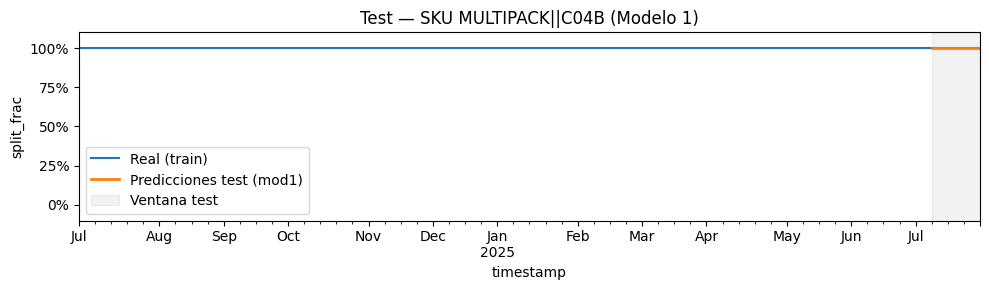

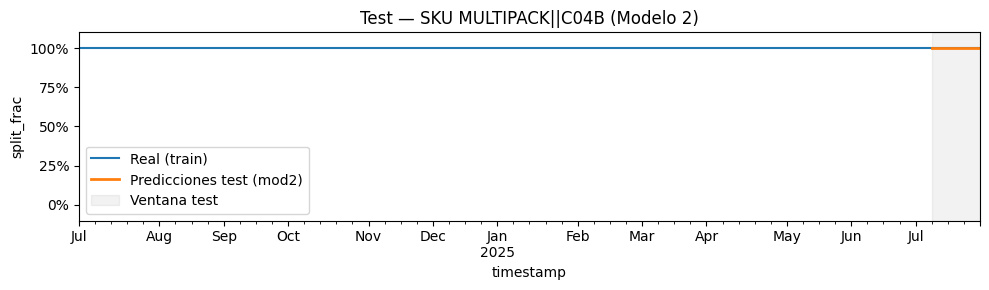

SKU: MYNX Control Venous||ERR
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


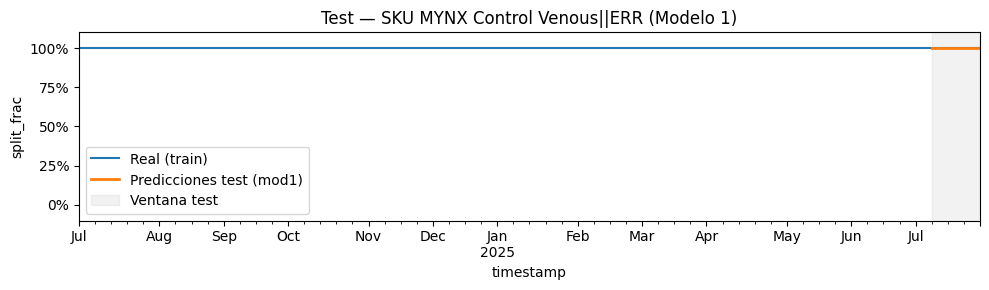

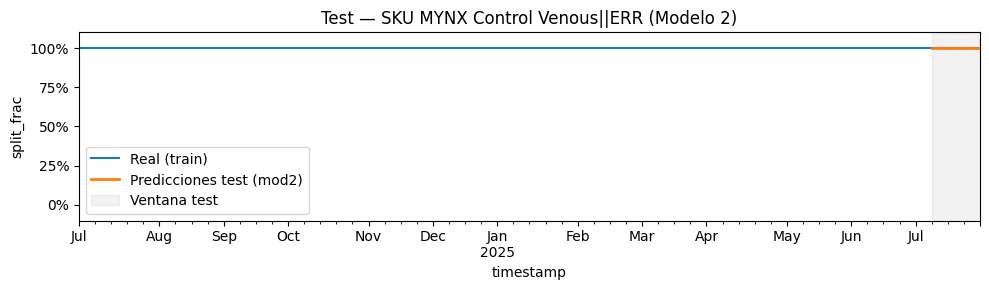

SKU: MYNX Control||ERR
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


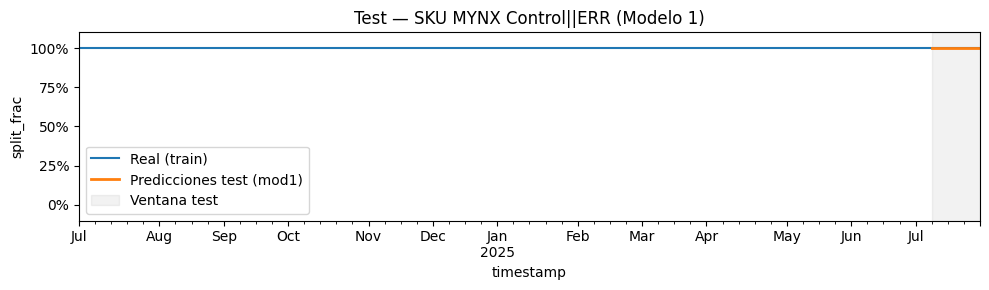

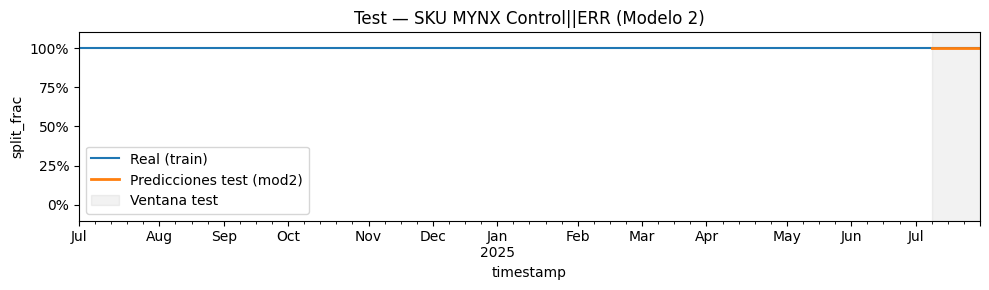

SKU: NEEDLE||EM_O02
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.129464          0.139759         0.127786
2025-07-16        0.126140          0.158780         0.117853
2025-07-23        0.124372          0.164868         0.127999
2025-07-30        0.124719          0.166439         0.135379
MAE model1 (split_frac_hat): 0.006063
MAE model2 (split_frac_hat_A): 0.030207


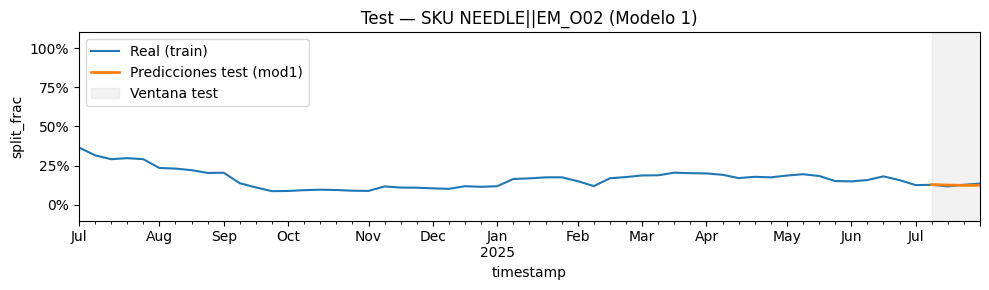

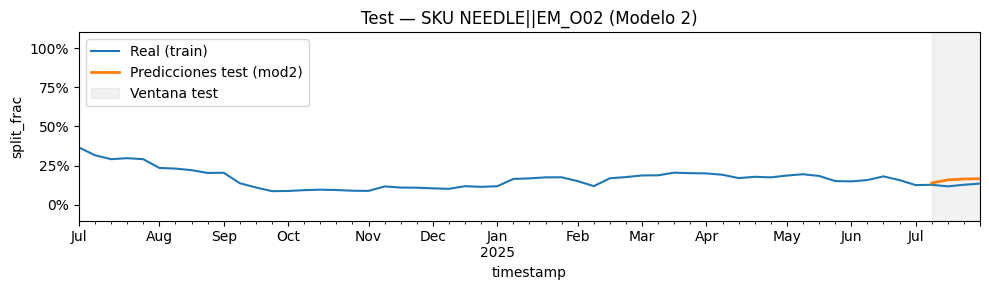

SKU: NEEDLE||EM_O04_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.870535          0.860241         0.872214
2025-07-16        0.873859          0.841197         0.882147
2025-07-23        0.875627          0.835096         0.872001
2025-07-30        0.875280          0.833528         0.864621
MAE model1 (split_frac_hat): 0.006063
MAE model2 (split_frac_hat_A): 0.030231


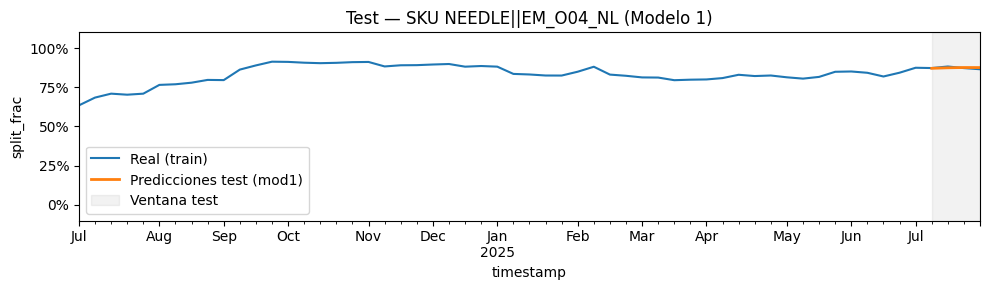

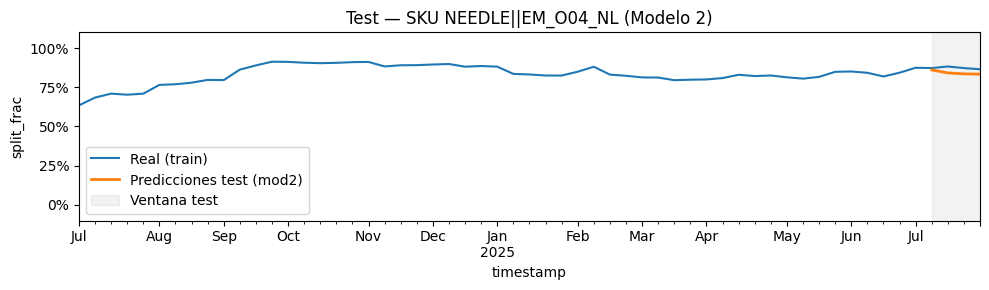

SKU: NEON NC||EM_O86_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


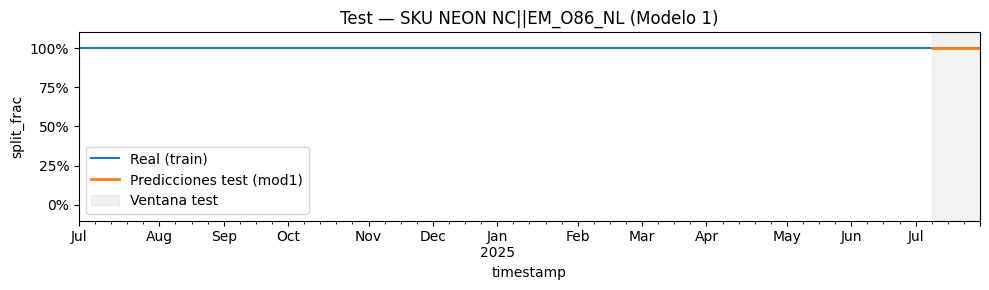

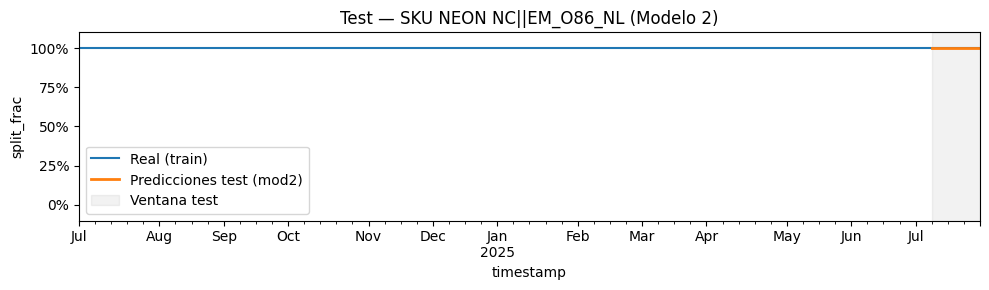

SKU: NEON||EM_O86_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


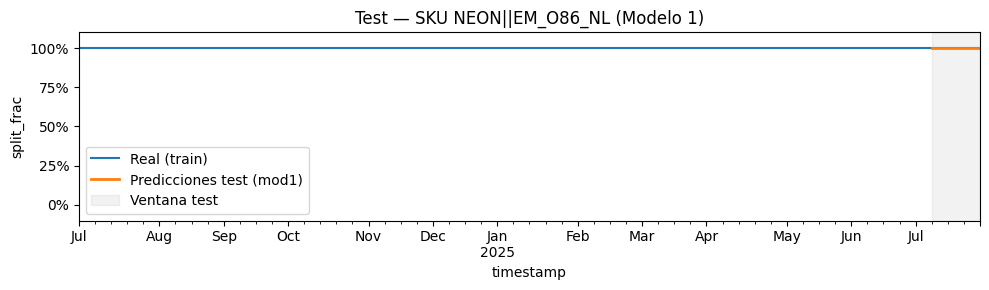

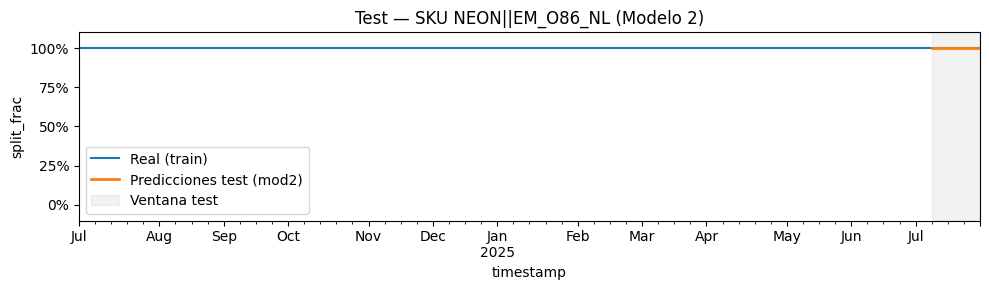

SKU: OPTA PRO||EM_D01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


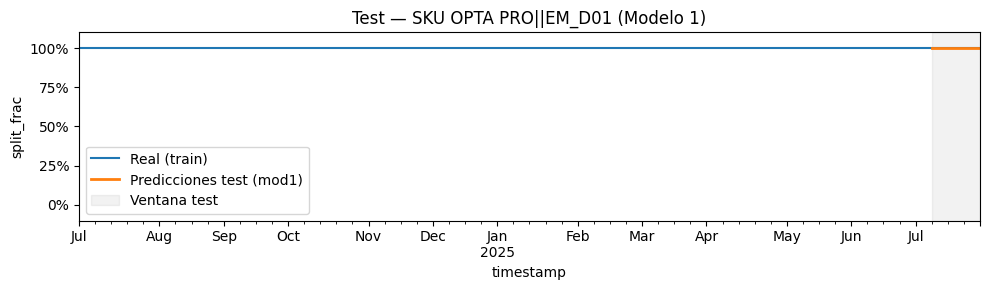

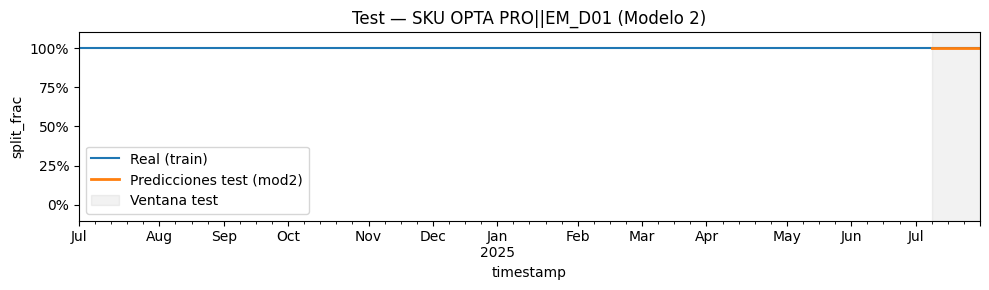

SKU: OPTEASE RETRIEVAL CATHETER||E00C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


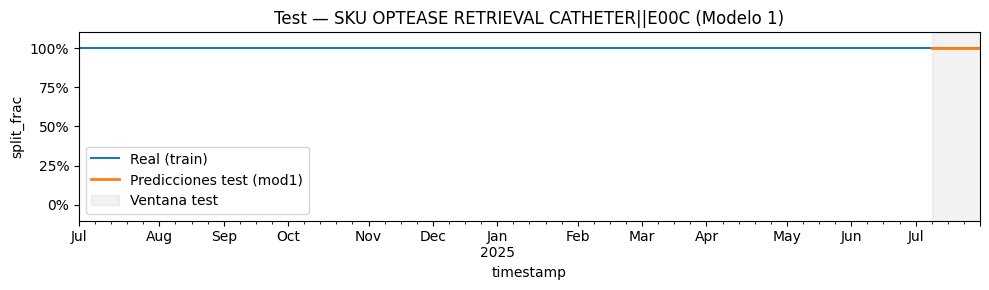

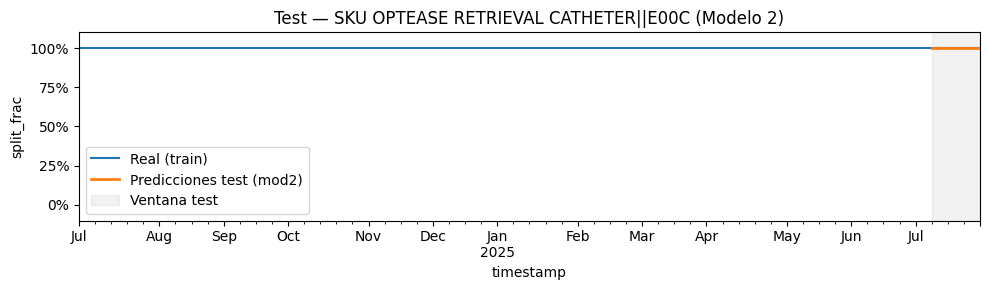

SKU: OPTEASE||P00
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


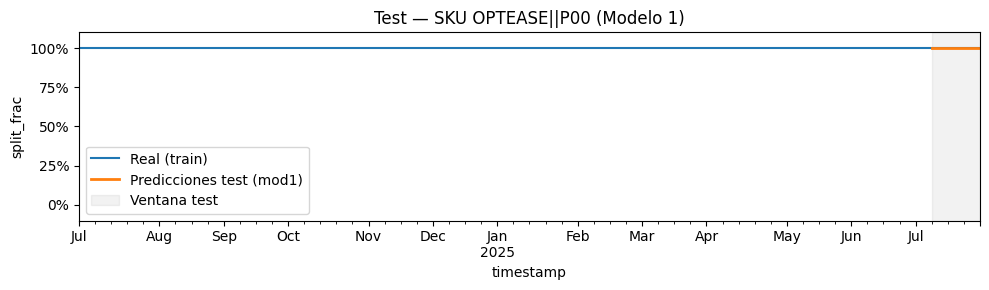

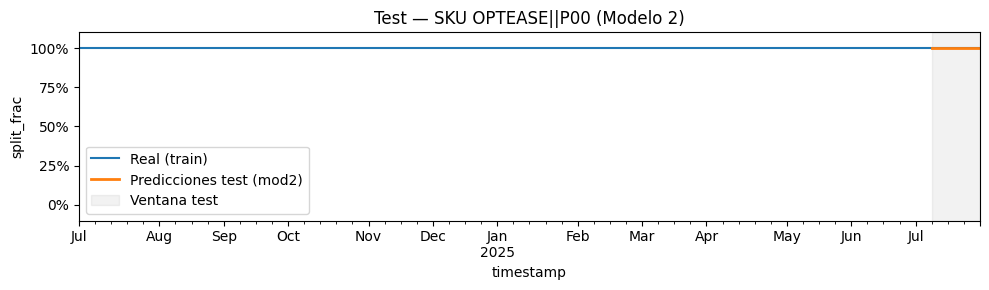

SKU: OUTBACK ELITE||X00
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


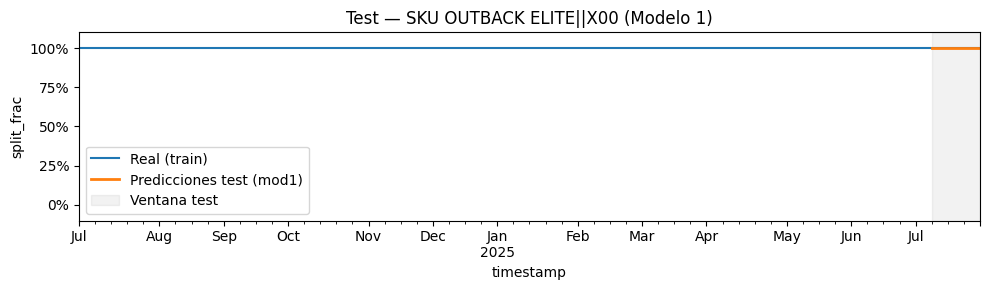

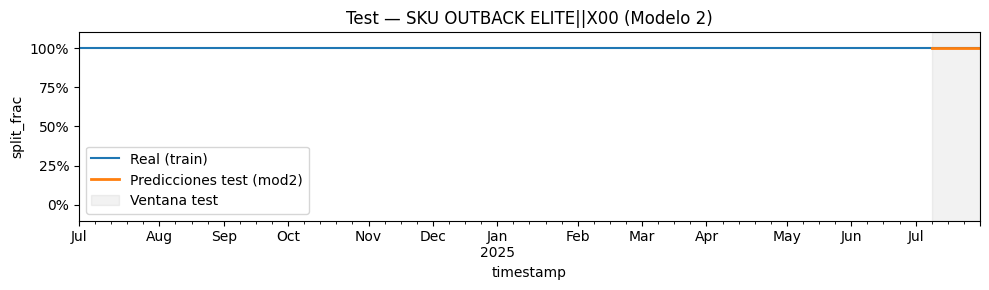

SKU: PALMAZ UNMOUNTED||EM_U90
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


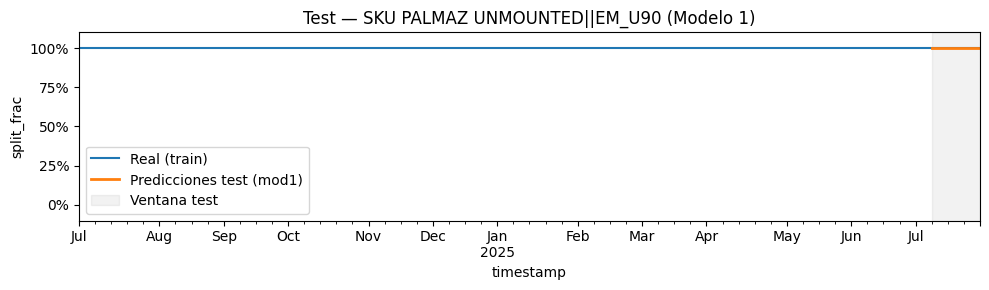

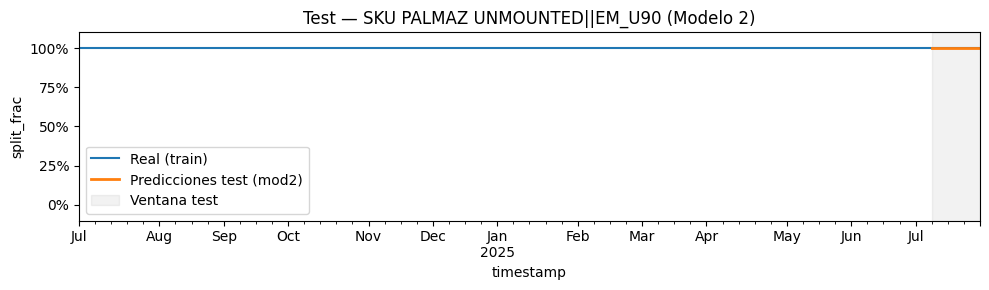

SKU: POWERFLEX EXTREME||EM_D01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


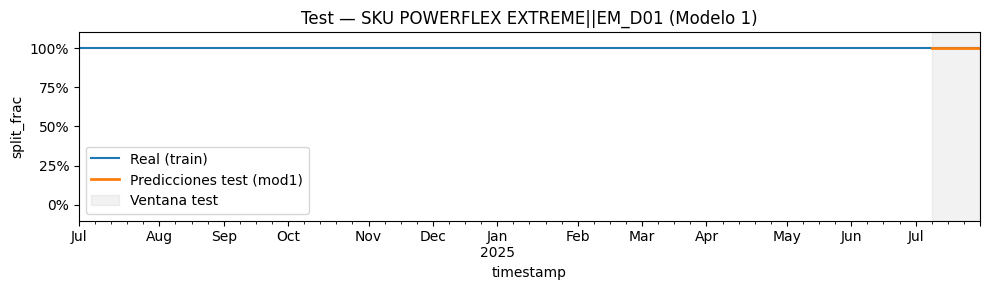

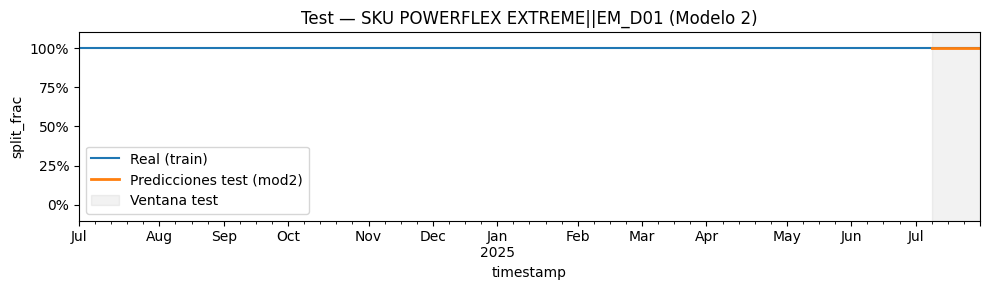

SKU: POWERFLEX P3||EM_D01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


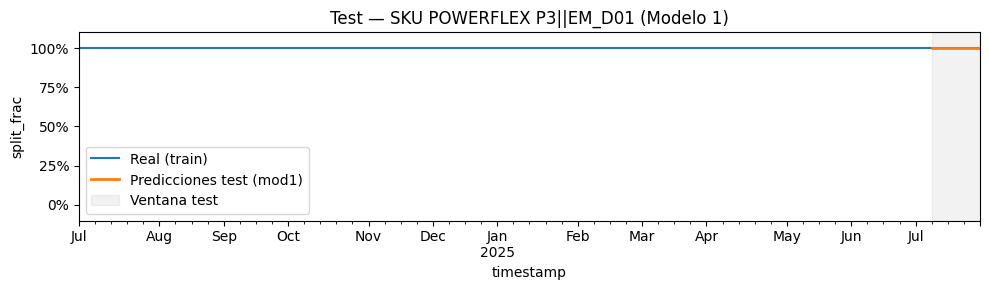

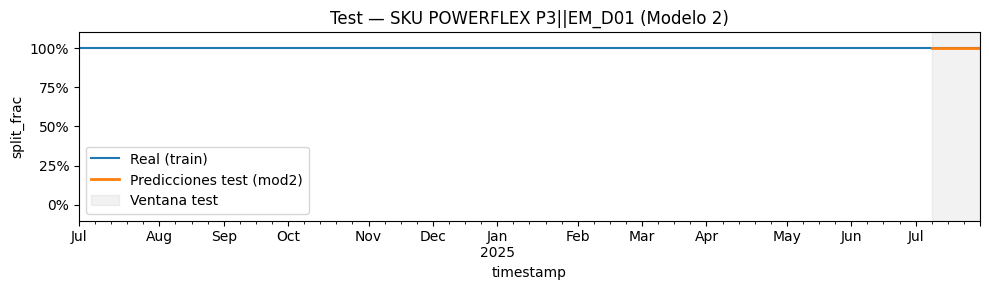

SKU: POWERFLEX PRO||EM_D02
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


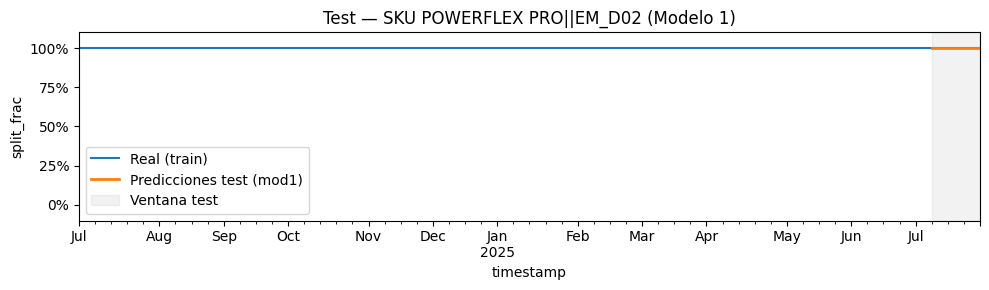

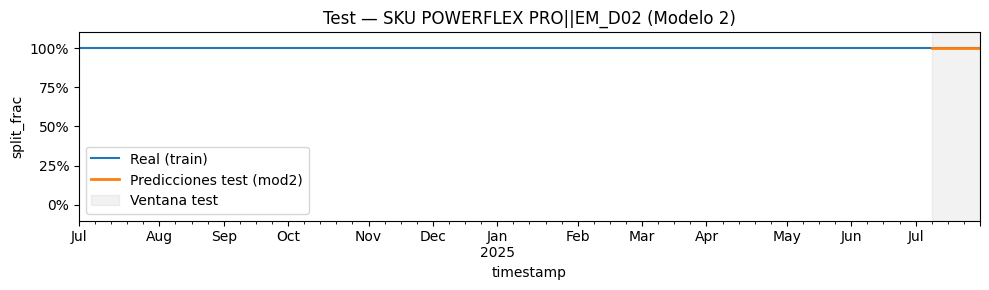

SKU: PRECISE PRO||T02A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


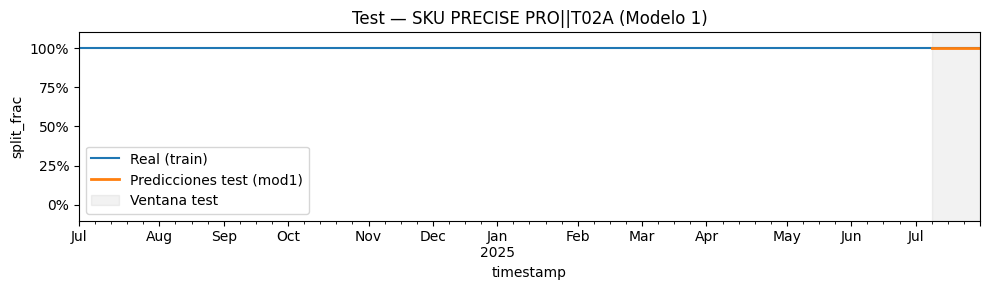

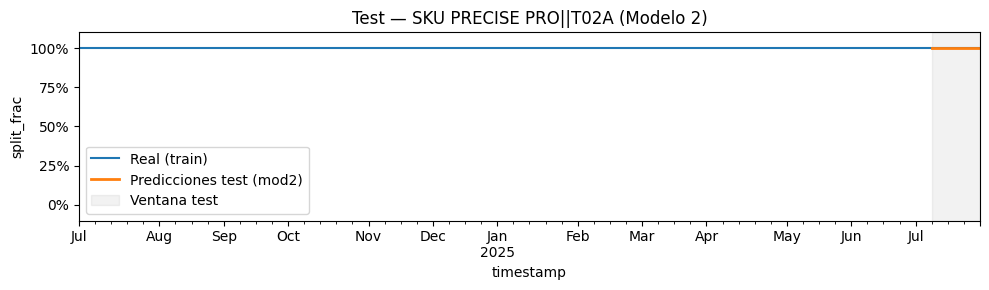

SKU: PREFACE||A01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


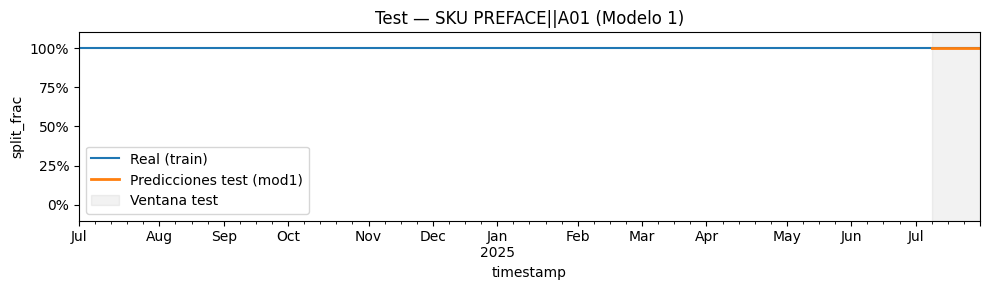

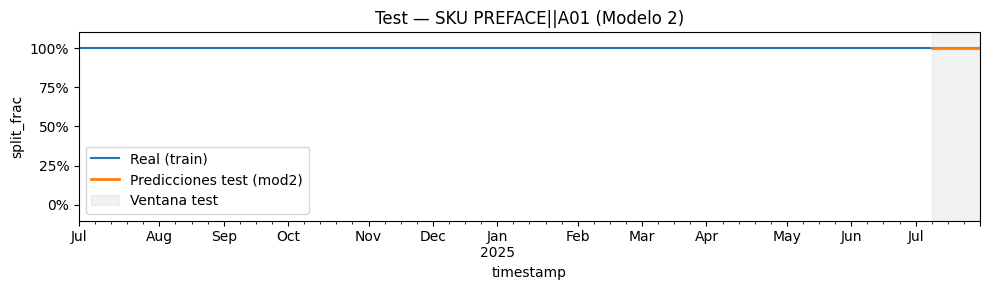

SKU: PRIMOPAC||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


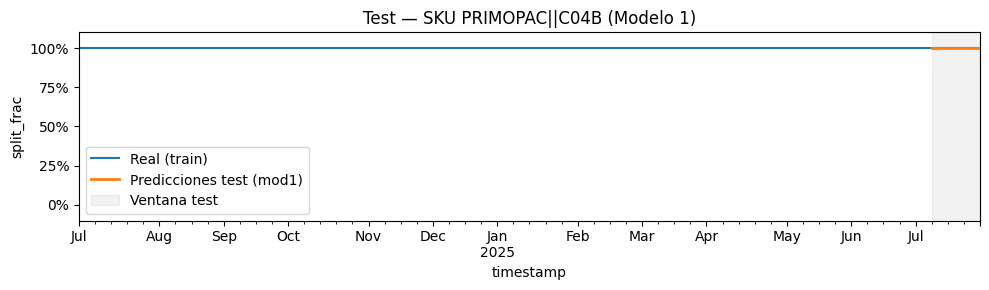

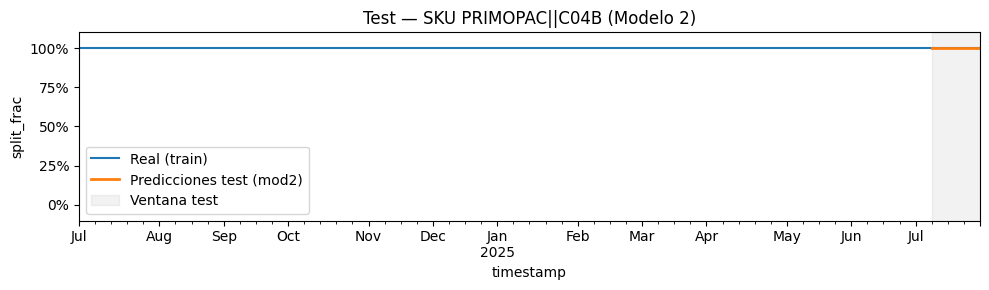

SKU: PROPAC (MODIFIED)||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


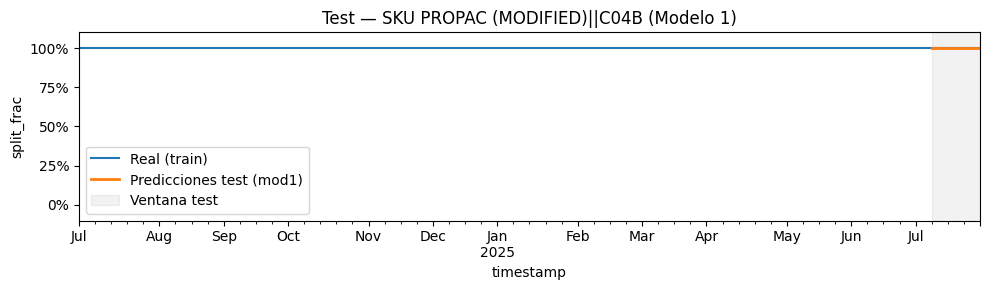

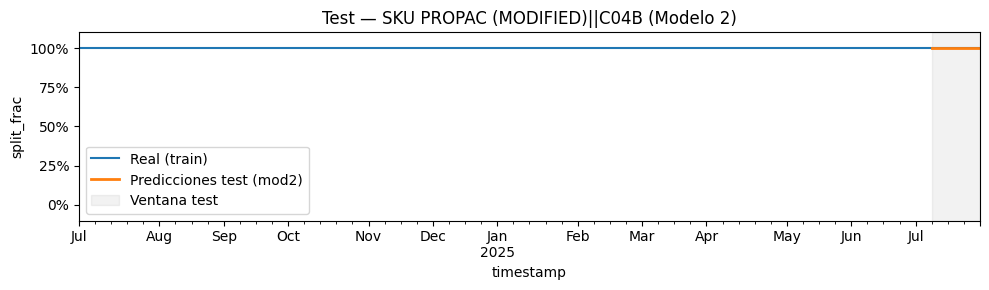

SKU: PROPAC||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


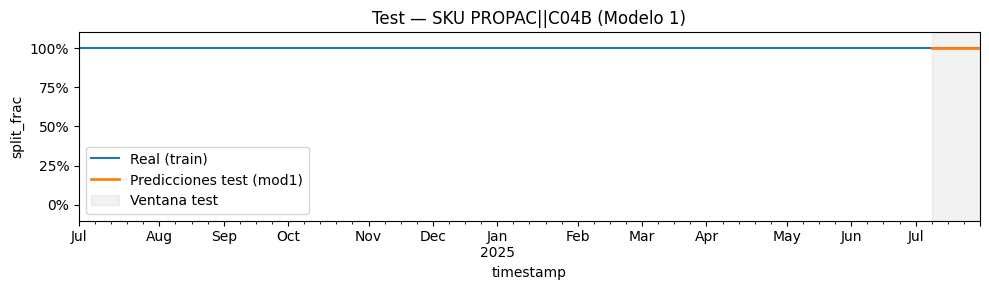

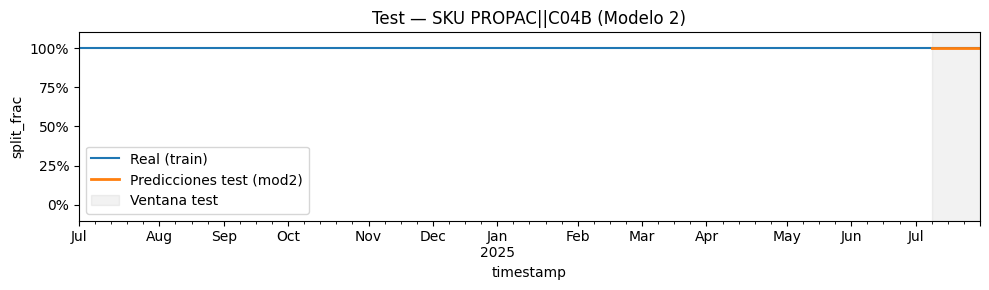

SKU: RAIDEN||EM_O84_NL_CN
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


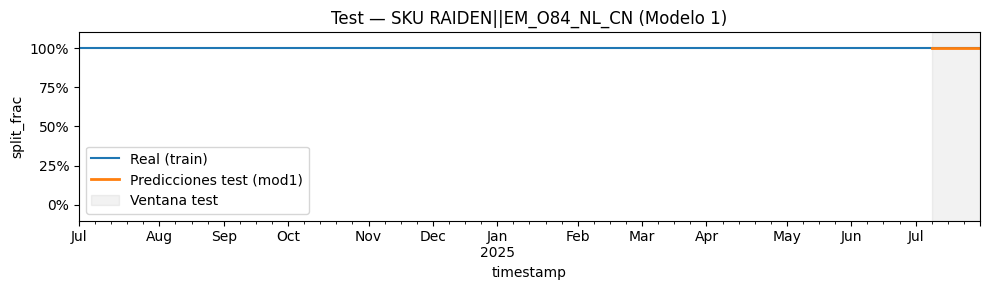

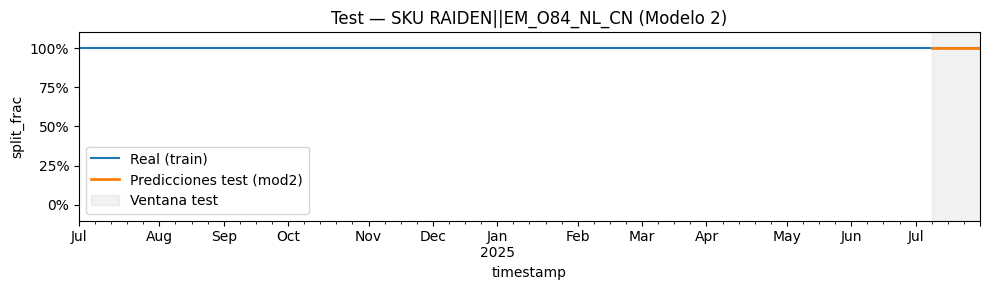

SKU: RAILWAY||A04
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


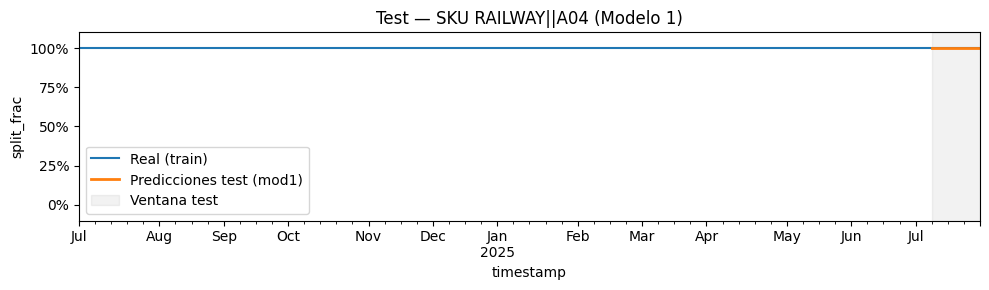

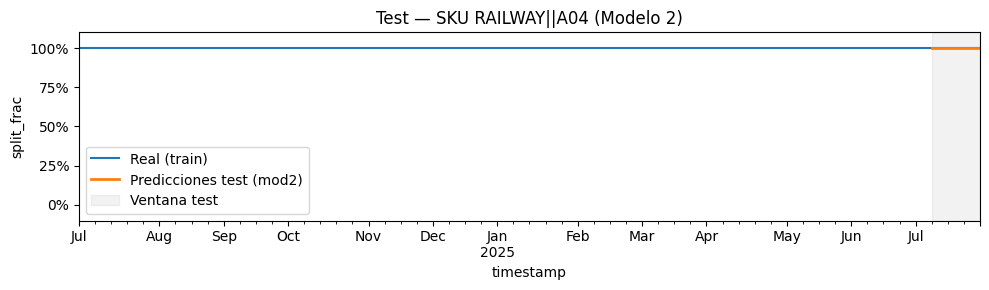

SKU: RAIN Sheath Transradial||A02D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


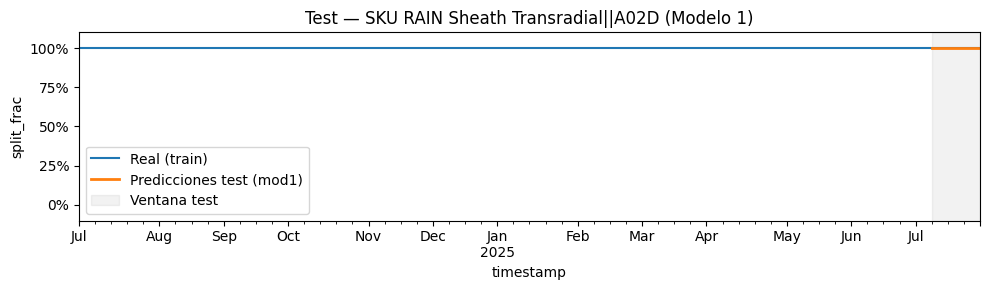

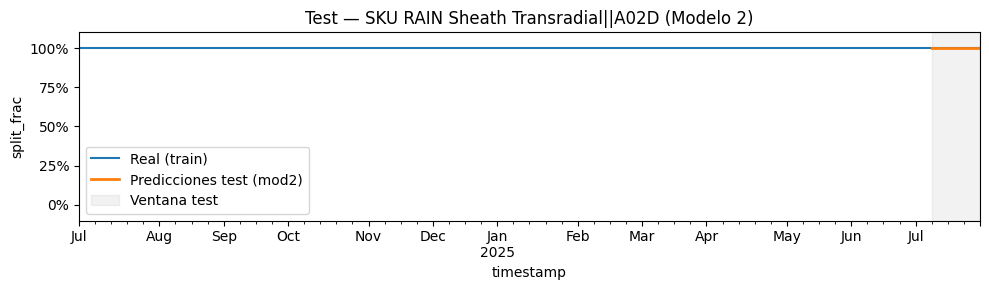

SKU: Rain Tibial/Pedal||A02D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


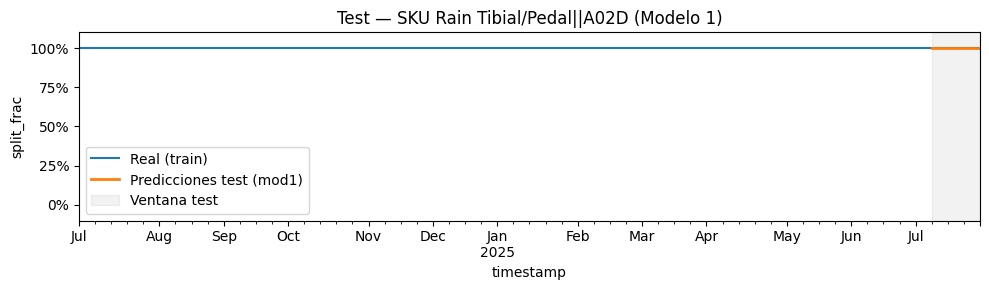

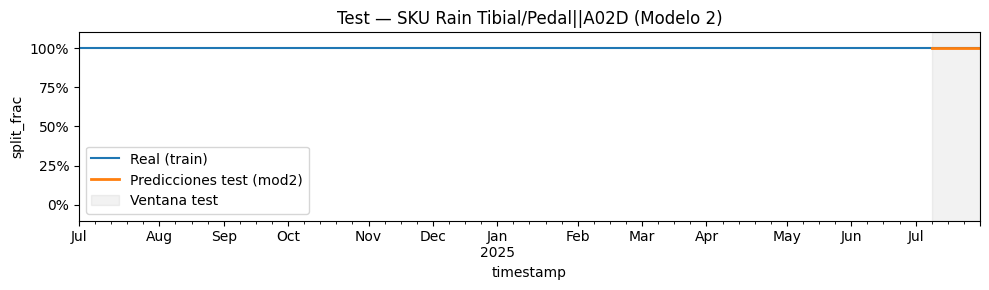

SKU: S.M.A.R.T. RADIANZ||T01D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


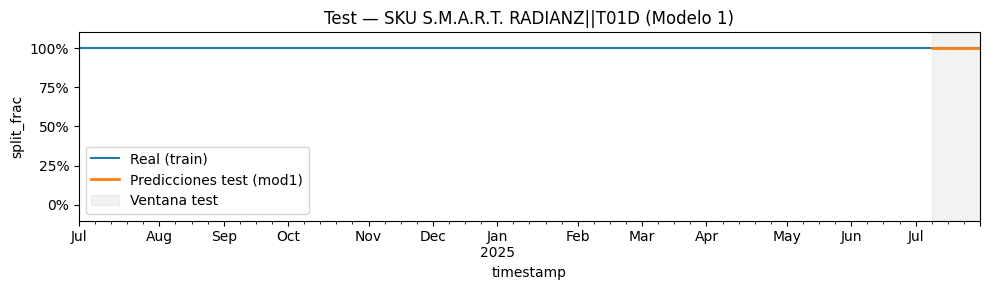

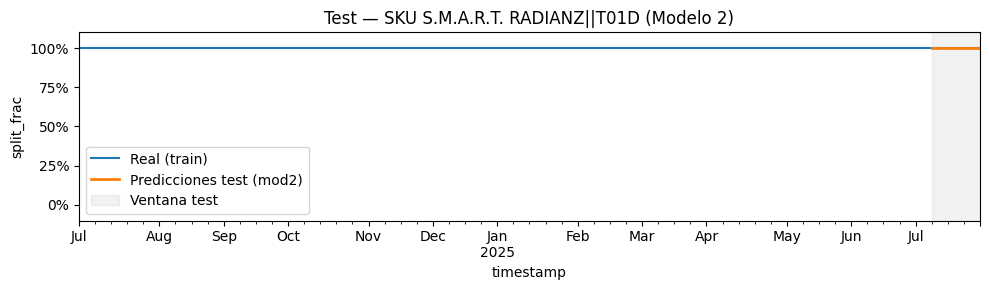

SKU: SABER .014||EM_O91
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


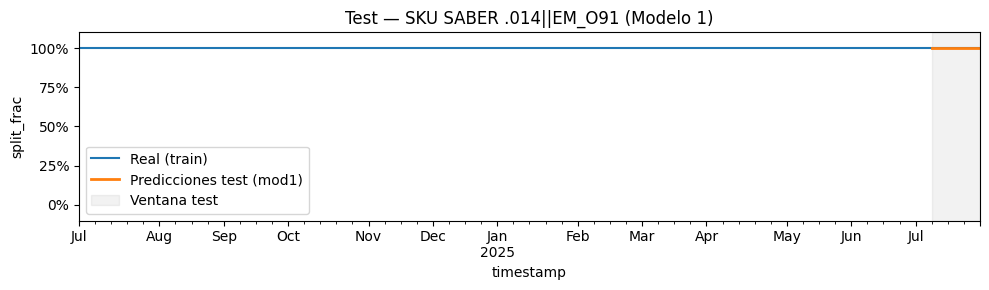

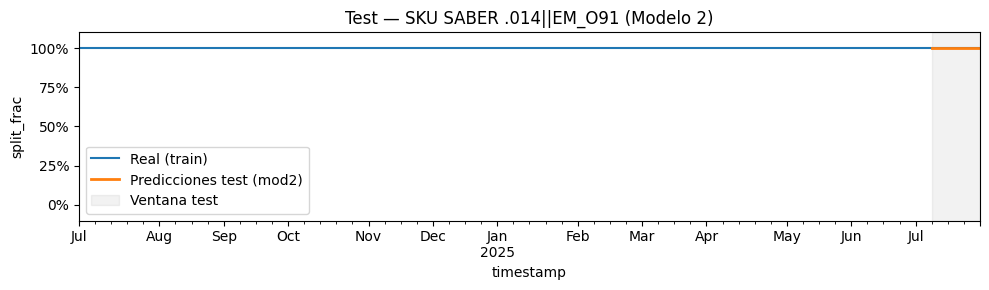

SKU: SABER .035||EM_D04
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.999885          0.999733         0.999911
2025-07-16        0.999884          0.999329         0.999910
2025-07-23        0.999882          0.998190         0.999896
2025-07-30        0.999882          0.997927         0.999891
MAE model1 (split_frac_hat): 0.000019
MAE model2 (split_frac_hat_A): 0.001107


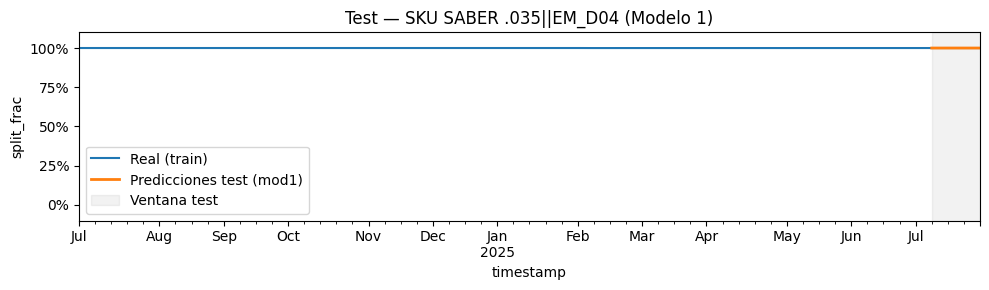

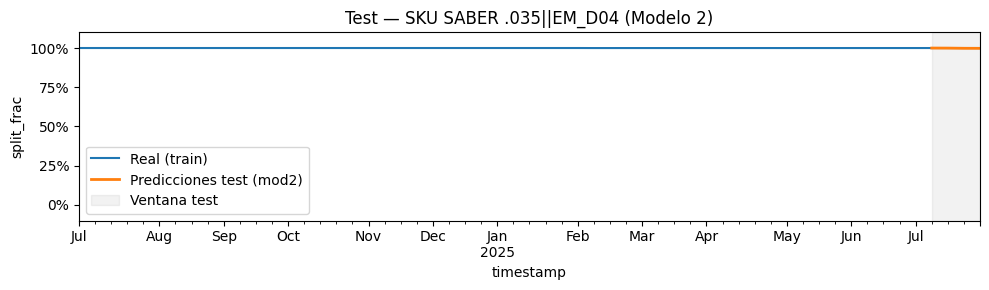

SKU: SABER .035||EM_D06
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.000115          0.000267         0.000089
2025-07-16        0.000116          0.000671         0.000090
2025-07-23        0.000118          0.001810         0.000104
2025-07-30        0.000118          0.002073         0.000109
MAE model1 (split_frac_hat): 0.000019
MAE model2 (split_frac_hat_A): 0.001107


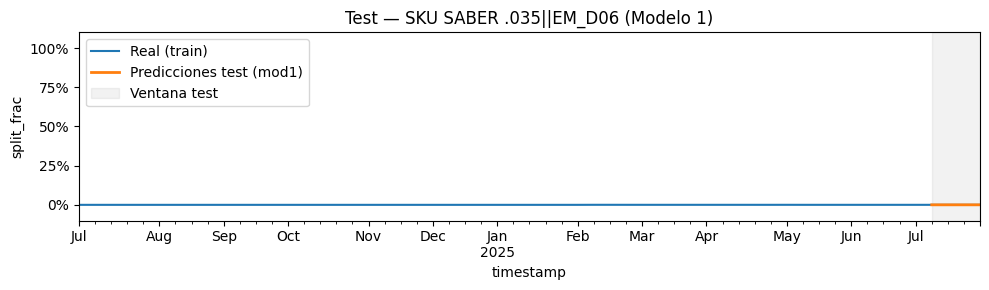

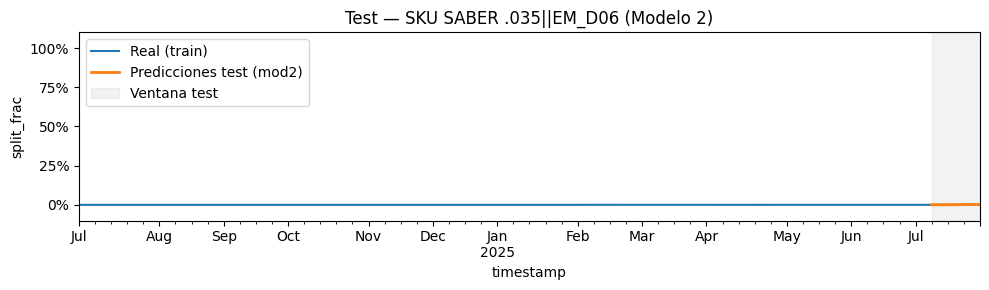

SKU: SABERX .014||EM_O91
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


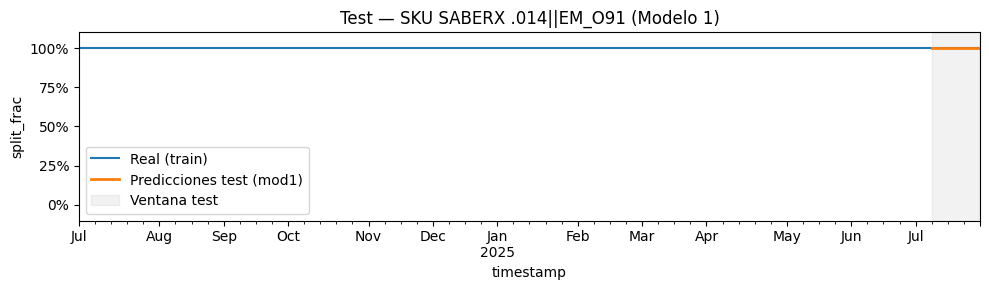

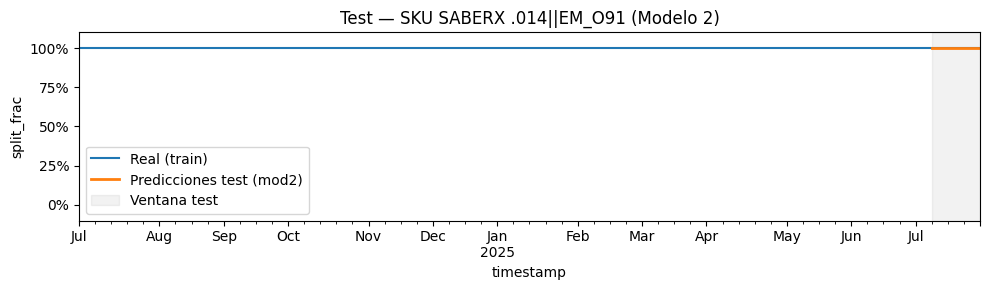

SKU: SABERX RADIANZ||EM_D06
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


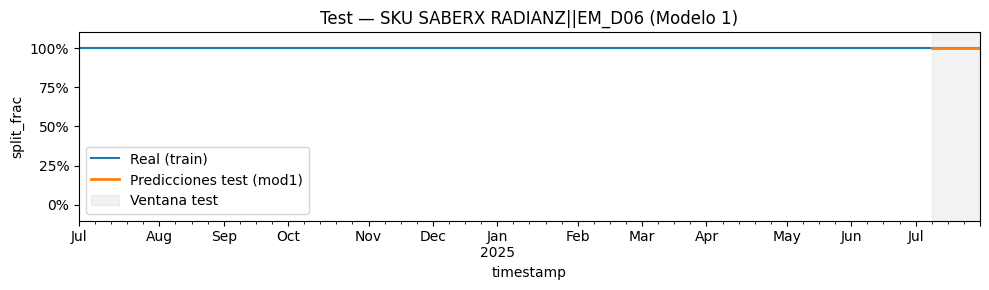

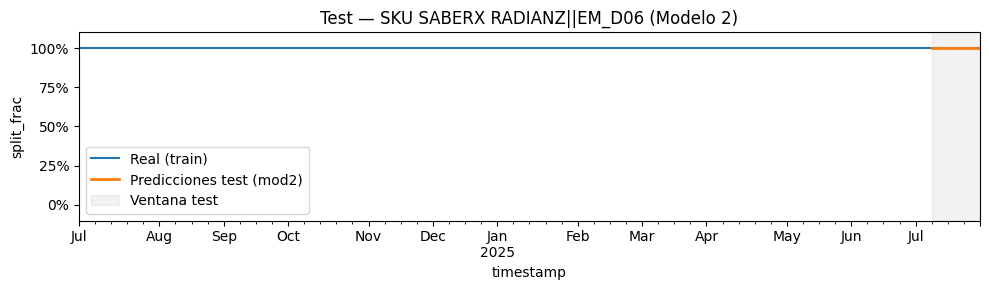

SKU: SABER||EM_D06
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


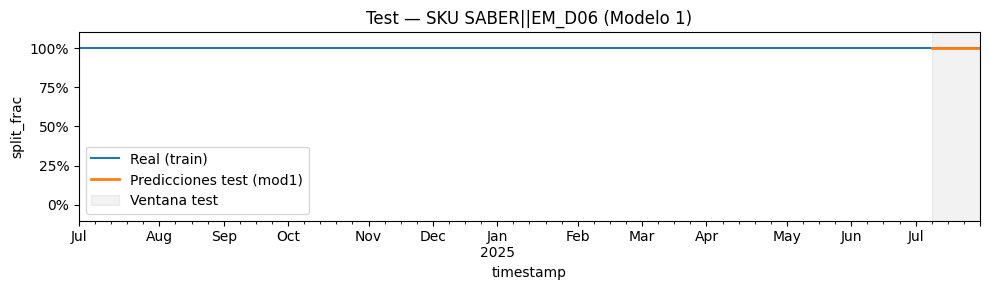

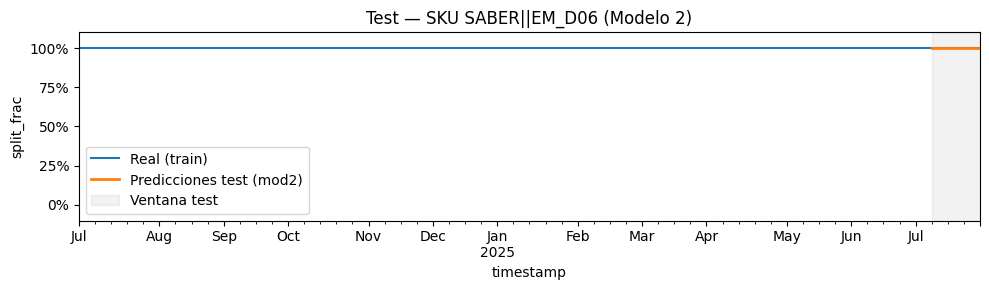

SKU: SHINOBI||EM_L51
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


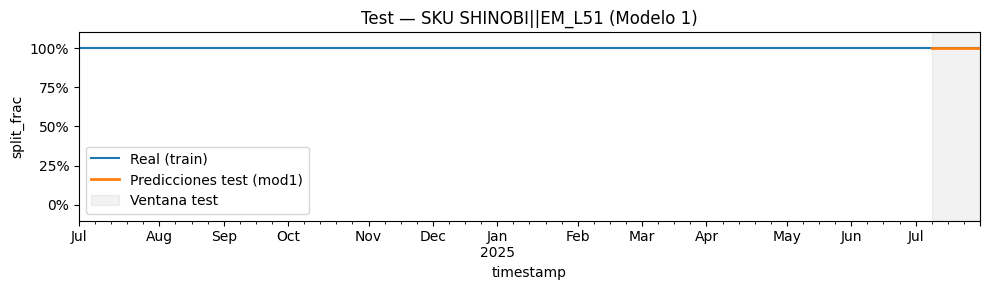

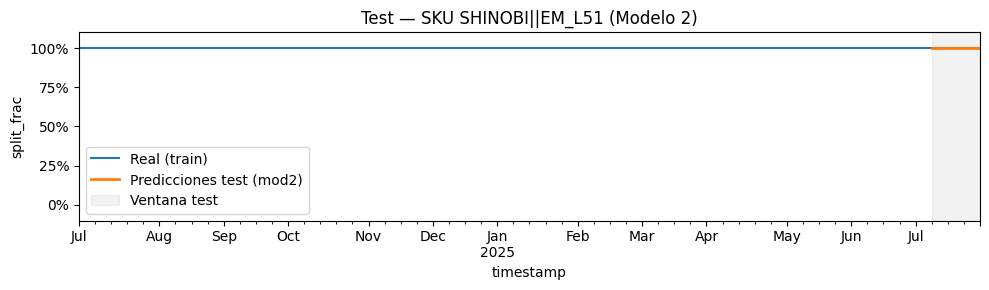

SKU: SLALOM||EM_D03
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


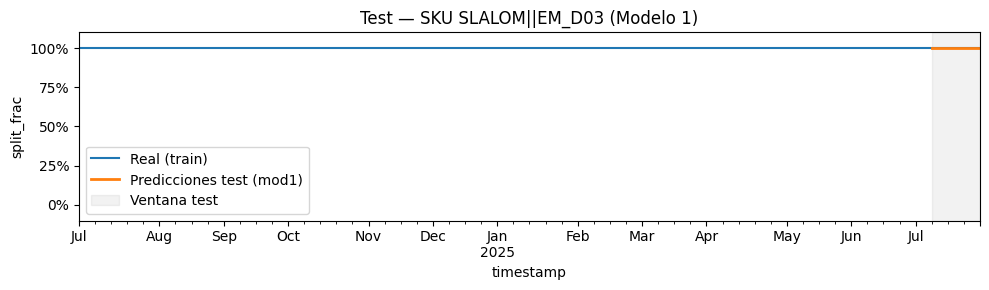

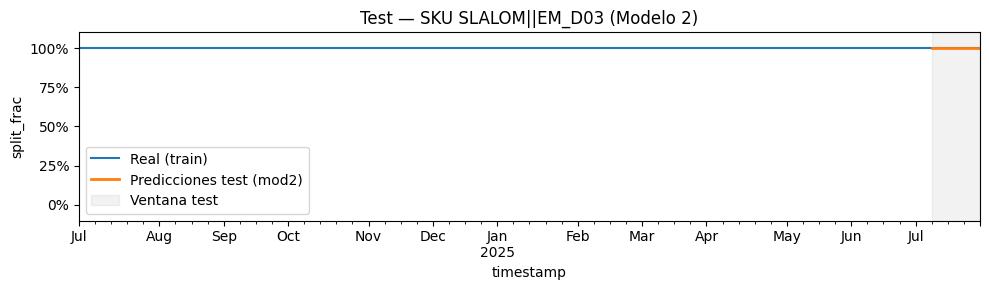

SKU: SLEEK OTW||EM_O07_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


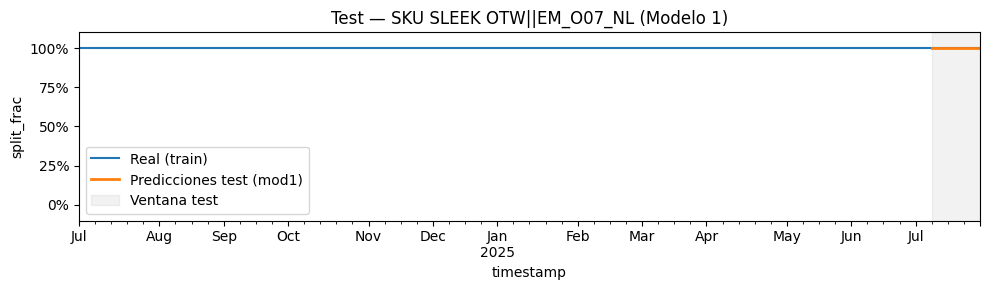

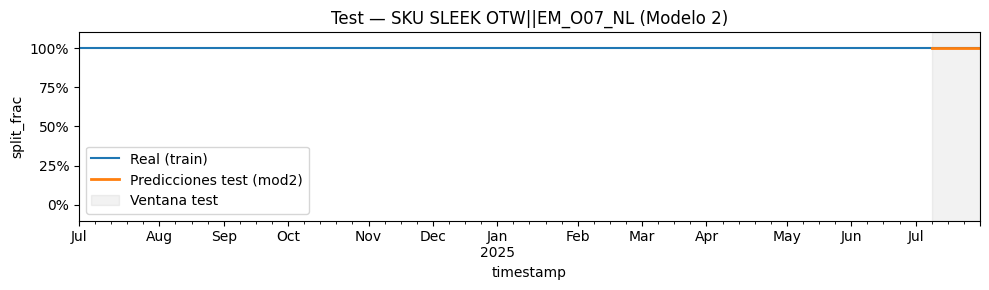

SKU: SLEEK||EM_O07_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


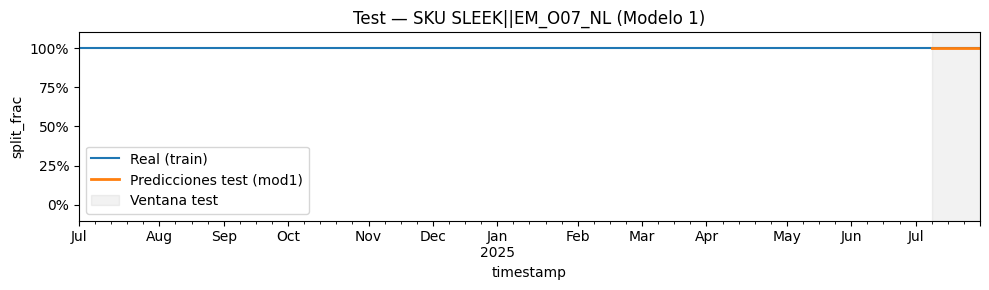

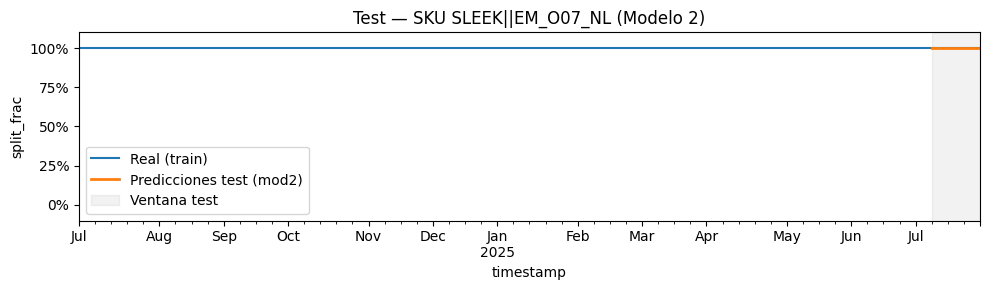

SKU: SMART FLEX||EM_O79
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


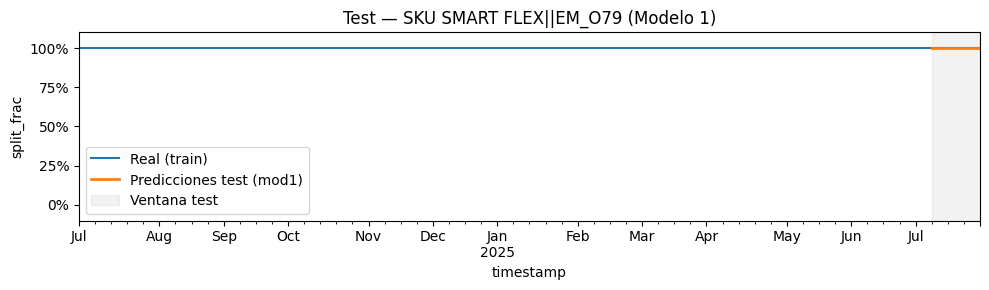

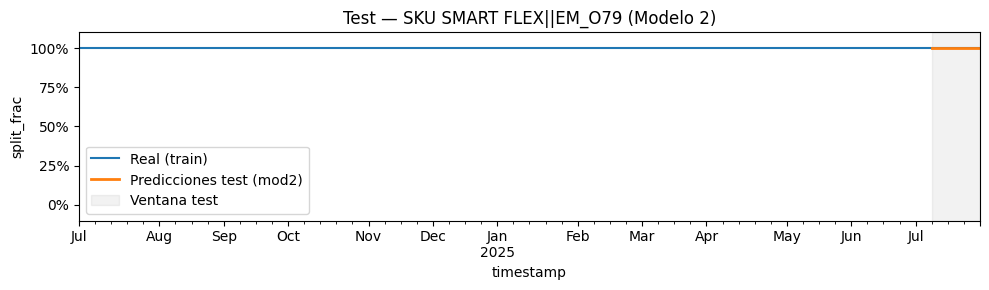

SKU: SMART||T01A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.110954          0.112804         0.112060
2025-07-16        0.111546          0.112961         0.110283
2025-07-23        0.111566          0.114304         0.127303
2025-07-30        0.111566          0.113662         0.124528
MAE model1 (split_frac_hat): 0.007767
MAE model2 (split_frac_hat_A): 0.006822


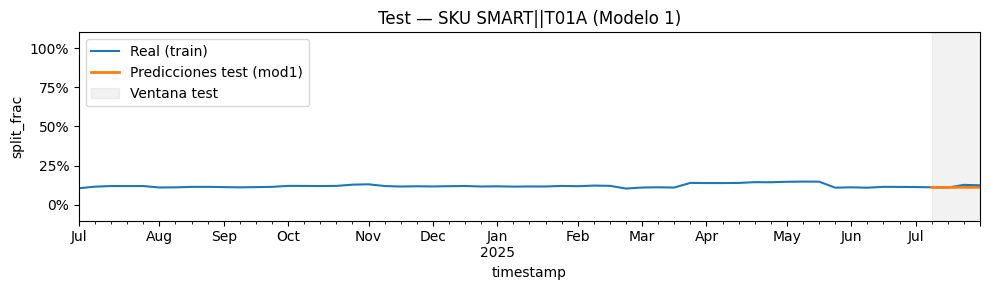

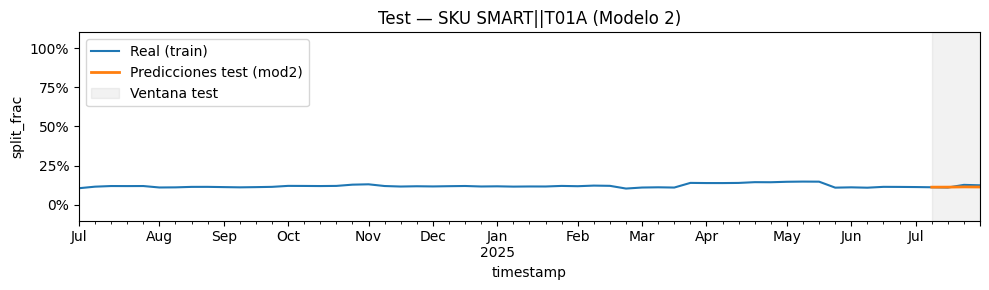

SKU: SMART||T01B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.100358          0.098011         0.096599
2025-07-16        0.095383          0.098596         0.098038
2025-07-23        0.095400          0.103790         0.109524
2025-07-30        0.095400          0.106236         0.109602
MAE model1 (split_frac_hat): 0.008685
MAE model2 (split_frac_hat_A): 0.002767


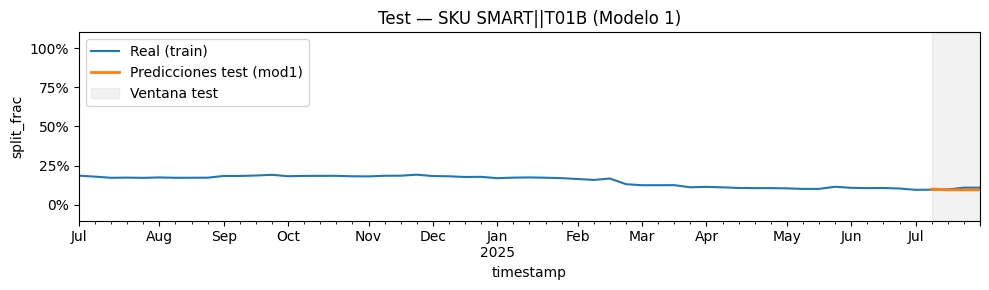

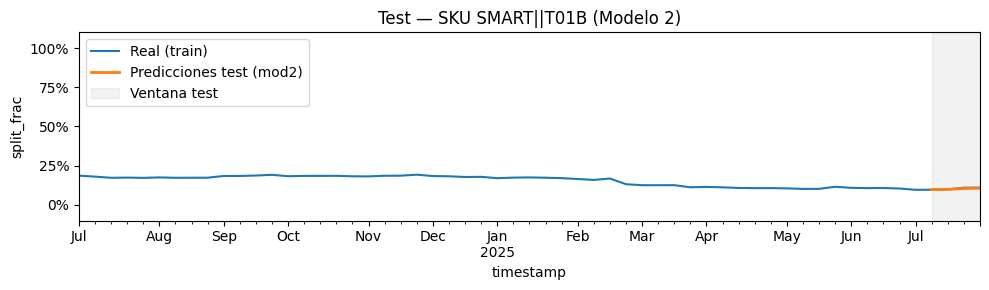

SKU: SMART||T01C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.788687          0.789185         0.791341
2025-07-16        0.793071          0.788442         0.791679
2025-07-23        0.793034          0.781906         0.763173
2025-07-30        0.793034          0.780101         0.765870
MAE model1 (split_frac_hat): 0.015268
MAE model2 (split_frac_hat_A): 0.009589


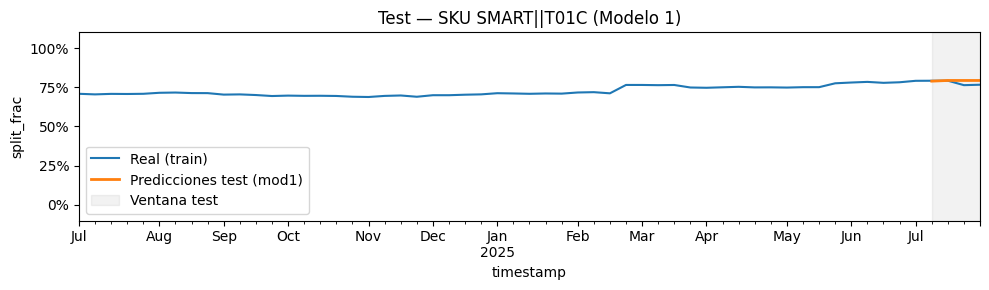

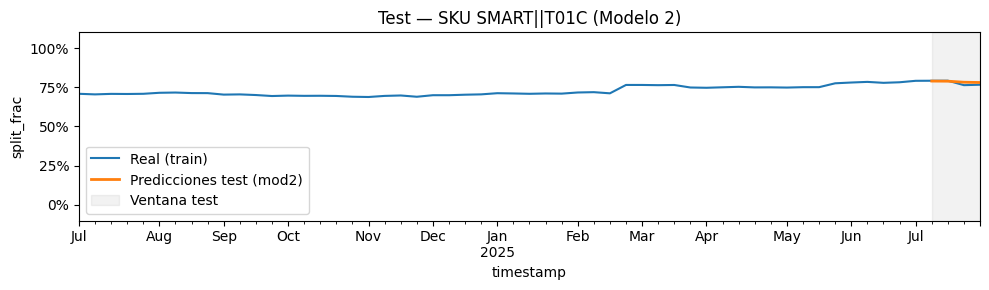

SKU: STABILIZER||EM_K60
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


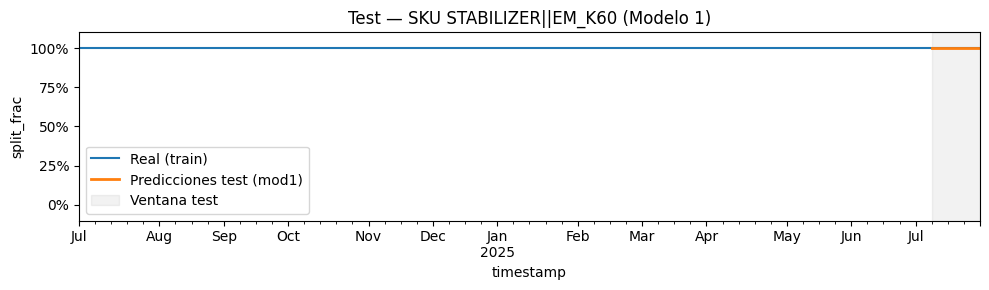

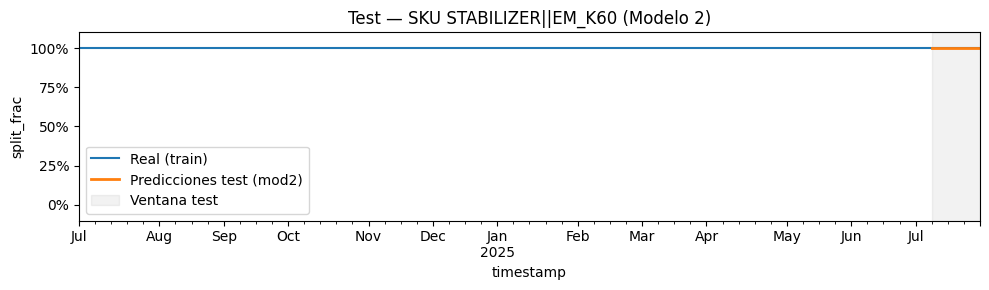

SKU: STORQ||EM_L60
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


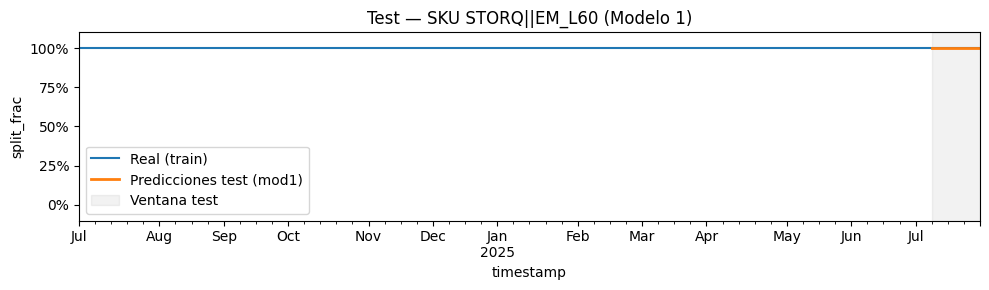

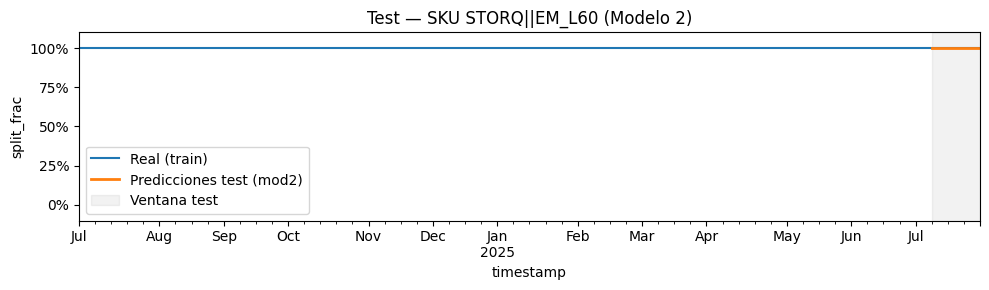

SKU: SUPER TORQUE MARKER BANDS||C04E
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


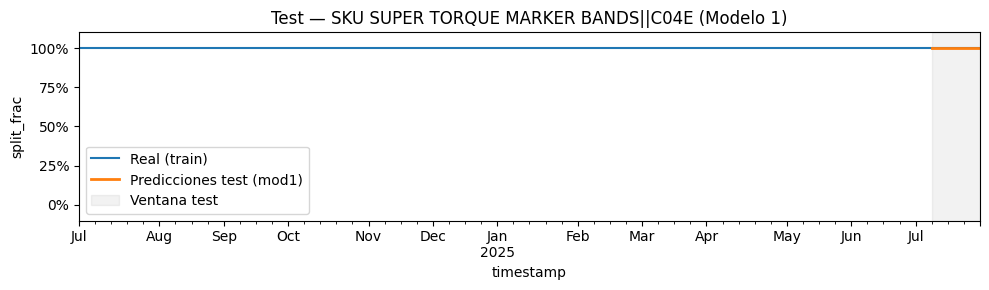

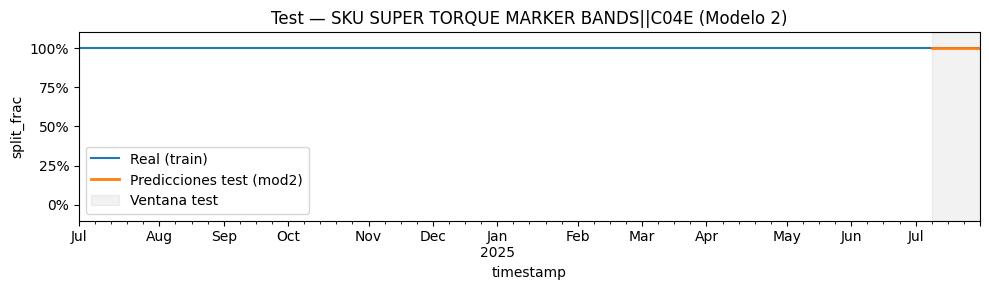

SKU: SUPERTORQUE (MODIFIED)||C05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


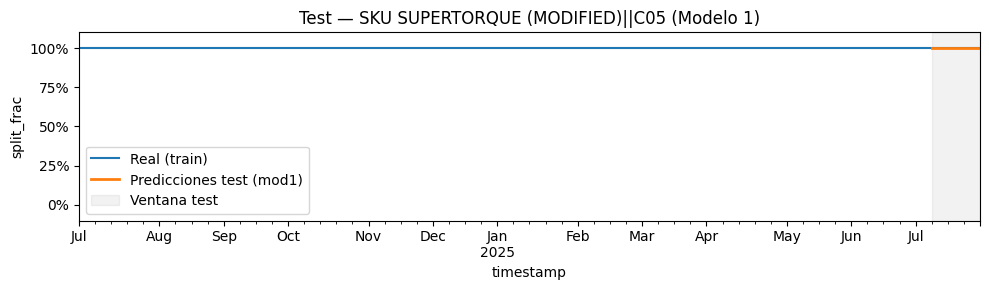

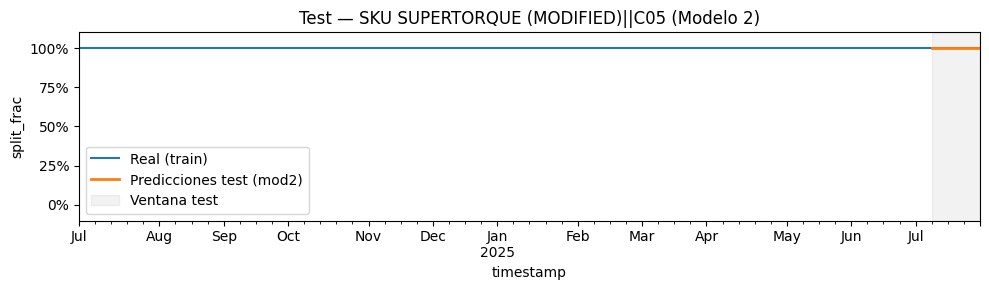

SKU: SUPERTORQUE PLUS (MODIFIED)||C04B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.190204          0.195375         0.187729
2025-07-16        0.189442          0.198789         0.183224
2025-07-23        0.189442          0.203811         0.193582
2025-07-30        0.189569          0.204409         0.190611
MAE model1 (split_frac_hat): 0.003469
MAE model2 (split_frac_hat_A): 0.011810


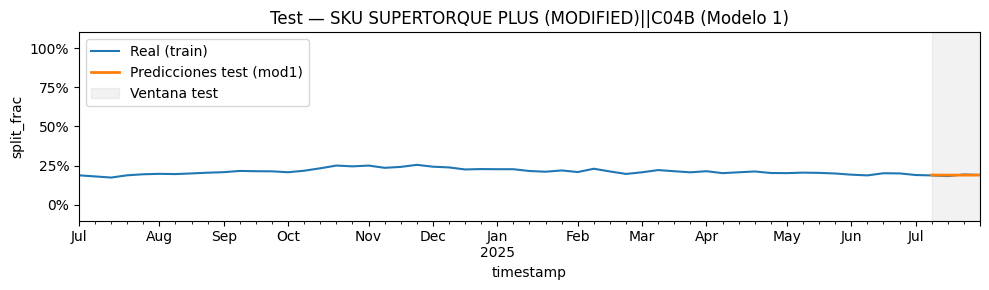

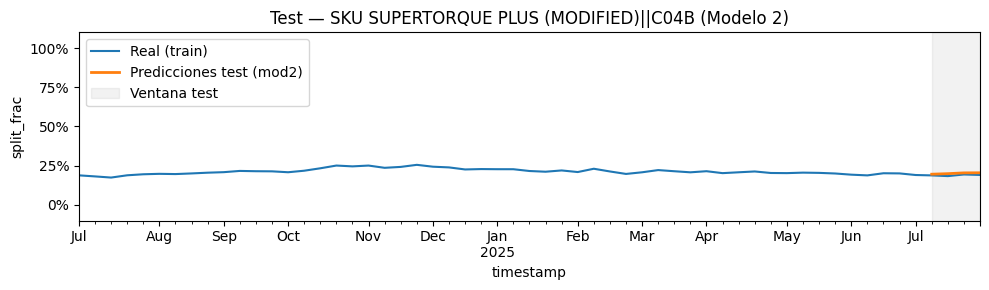

SKU: SUPERTORQUE PLUS (MODIFIED)||C05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.809796          0.804625         0.812271
2025-07-16        0.810558          0.801211         0.816776
2025-07-23        0.810558          0.796189         0.806418
2025-07-30        0.810431          0.795591         0.809389
MAE model1 (split_frac_hat): 0.003469
MAE model2 (split_frac_hat_A): 0.011810


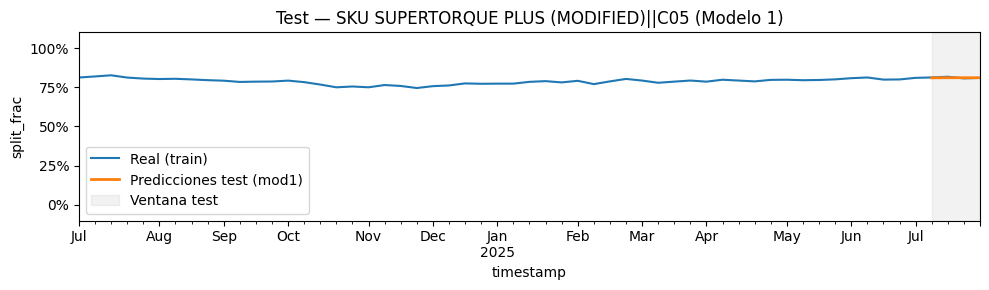

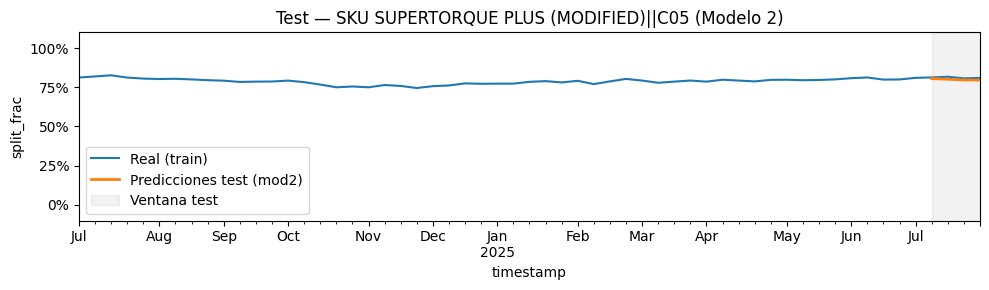

SKU: SUPERTORQUE PLUS||C03C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.520180          0.513675         0.506665
2025-07-16        0.520180          0.511389         0.503464
2025-07-23        0.520137          0.509307         0.514391
2025-07-30        0.520090          0.508267         0.511249
MAE model1 (split_frac_hat): 0.011204
MAE model2 (split_frac_hat_A): 0.005750


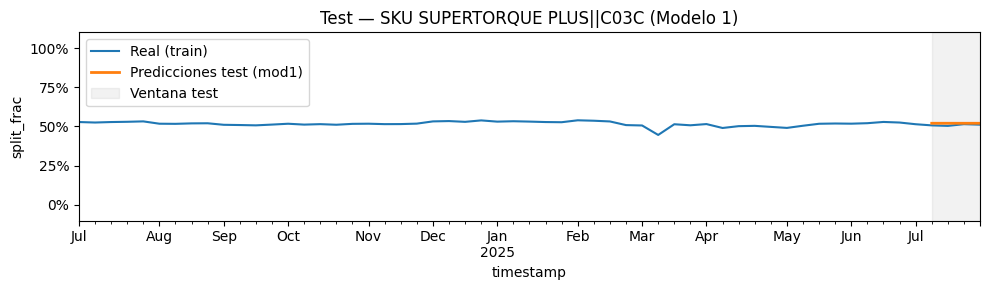

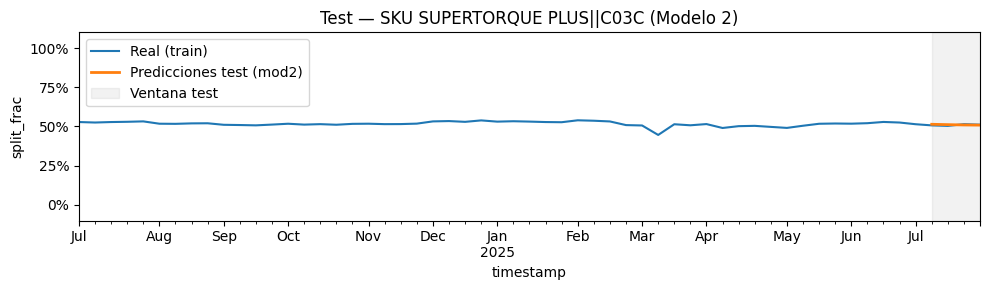

SKU: SUPERTORQUE PLUS||C04C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.009054          0.008758         0.008536
2025-07-16        0.009054          0.008755         0.008509
2025-07-23        0.009136          0.008789         0.008983
2025-07-30        0.009224          0.008788         0.008951
MAE model1 (split_frac_hat): 0.000372
MAE model2 (split_frac_hat_A): 0.000206


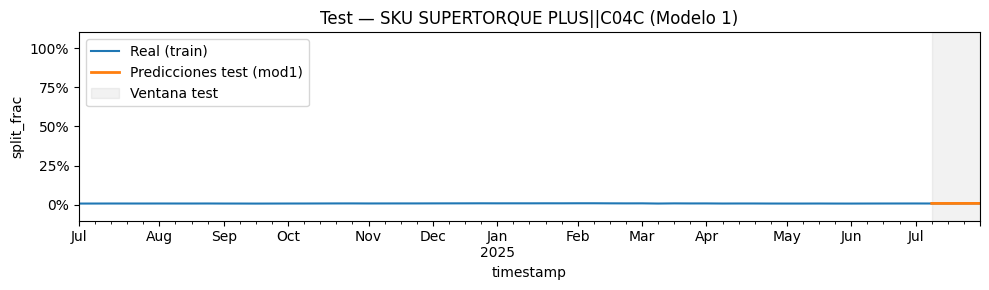

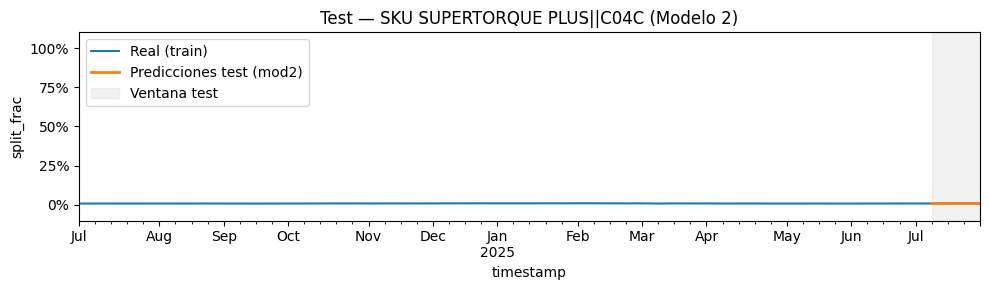

SKU: SUPERTORQUE PLUS||C12D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.470766          0.477567         0.484799
2025-07-16        0.470766          0.479856         0.488027
2025-07-23        0.470727          0.481903         0.476626
2025-07-30        0.470685          0.482941         0.479799
MAE model1 (split_frac_hat): 0.011577
MAE model2 (split_frac_hat_A): 0.005955


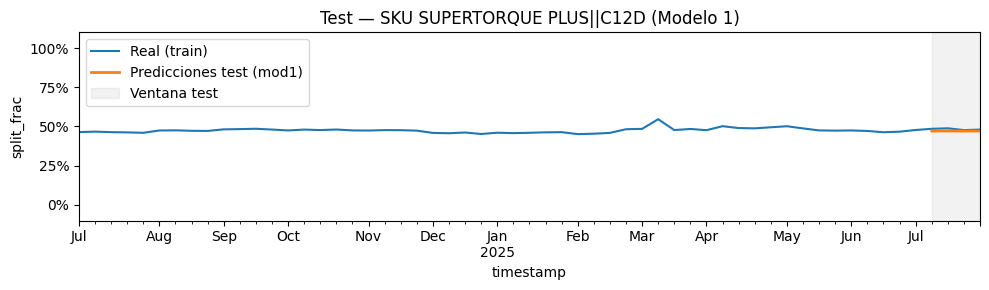

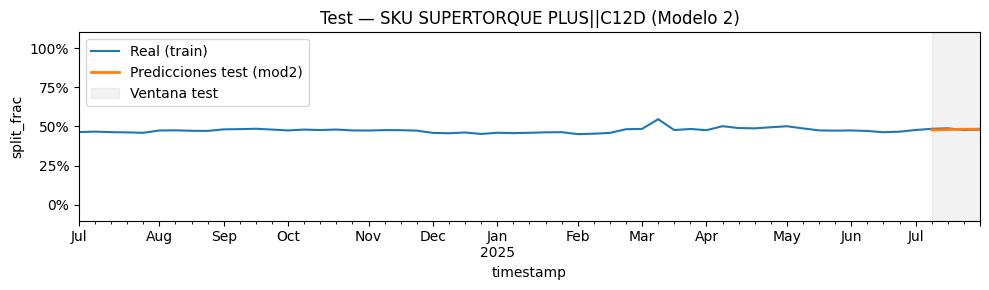

SKU: SUPERTORQUE||C03D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.154425          0.153590         0.148636
2025-07-16        0.154543          0.154594         0.152068
2025-07-23        0.154391          0.156182         0.136866
2025-07-30        0.154318          0.156503         0.134617
MAE model1 (split_frac_hat): 0.011373
MAE model2 (split_frac_hat_A): 0.012170


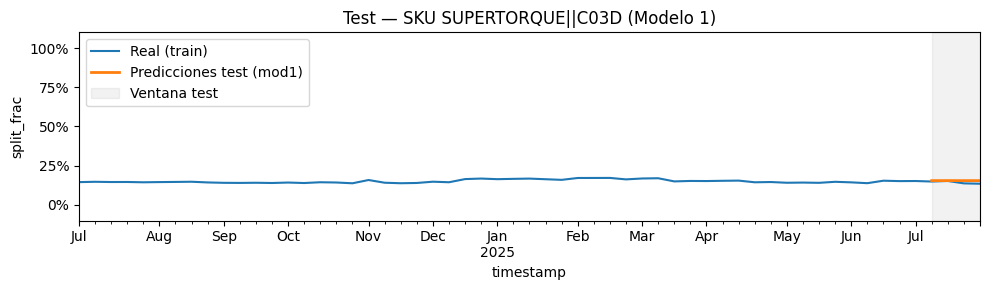

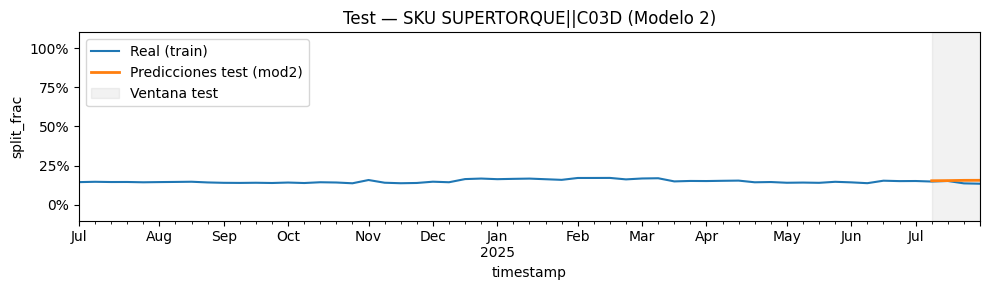

SKU: SUPERTORQUE||C03E
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.163175          0.165651         0.166872
2025-07-16        0.163299          0.164914         0.166801
2025-07-23        0.163139          0.165173         0.176183
2025-07-30        0.163061          0.165353         0.174841
MAE model1 (split_frac_hat): 0.008006
MAE model2 (split_frac_hat_A): 0.005901


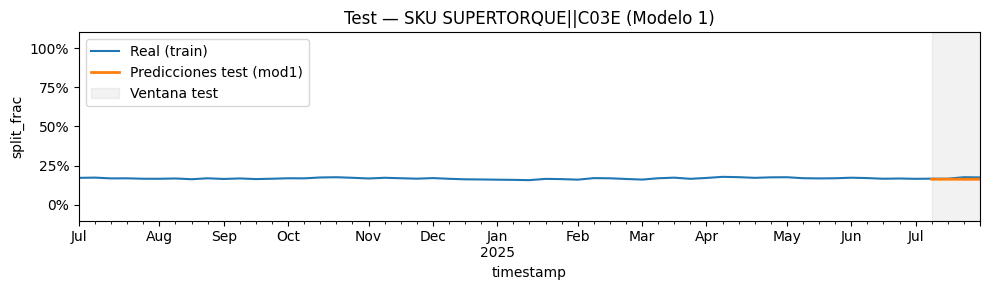

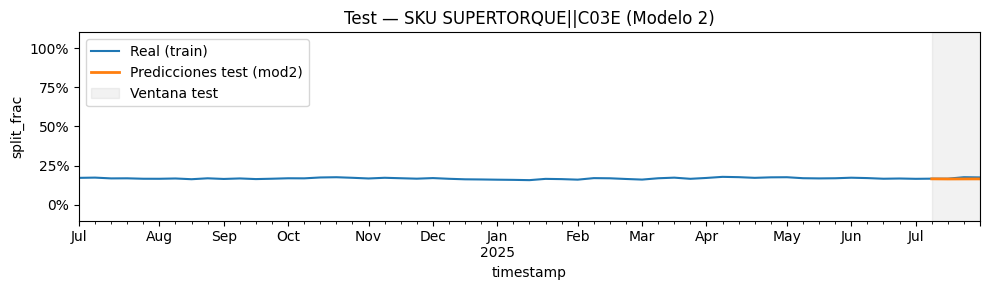

SKU: SUPERTORQUE||C04A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.005200          0.004945         0.005983
2025-07-16        0.005424          0.004695         0.005950
2025-07-23        0.005418          0.004435         0.001357
2025-07-30        0.005416          0.004553         0.001410
MAE model1 (split_frac_hat): 0.002344
MAE model2 (split_frac_hat_A): 0.002129


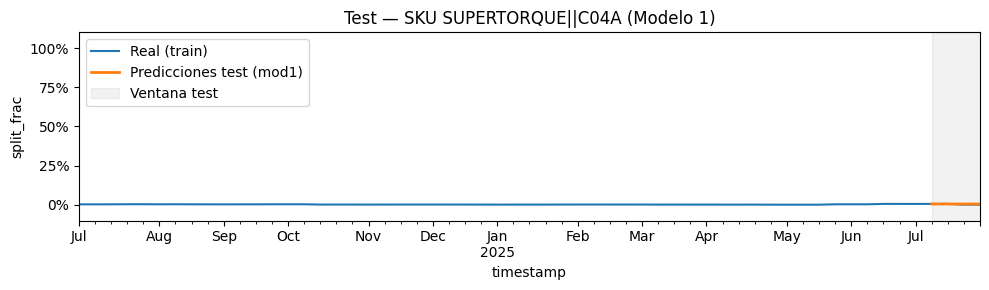

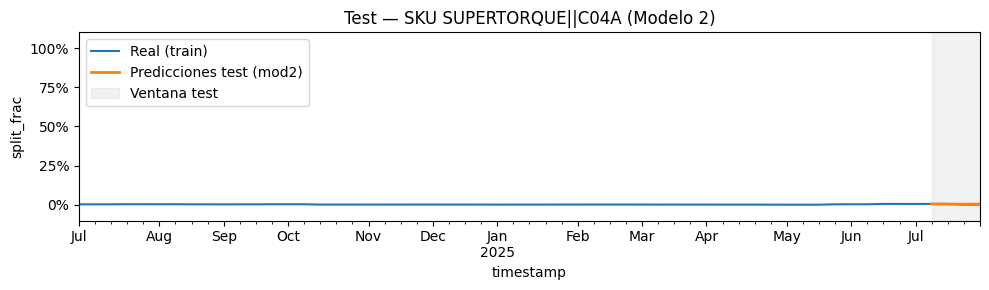

SKU: SUPERTORQUE||C12C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.677200          0.675814         0.678509
2025-07-16        0.676734          0.675798         0.675181
2025-07-23        0.677051          0.674210         0.685595
2025-07-30        0.677205          0.673591         0.689132
MAE model1 (split_frac_hat): 0.005833
MAE model2 (split_frac_hat_A): 0.007559


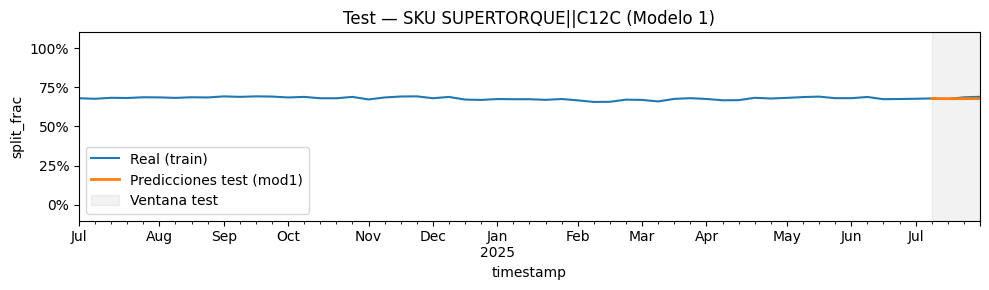

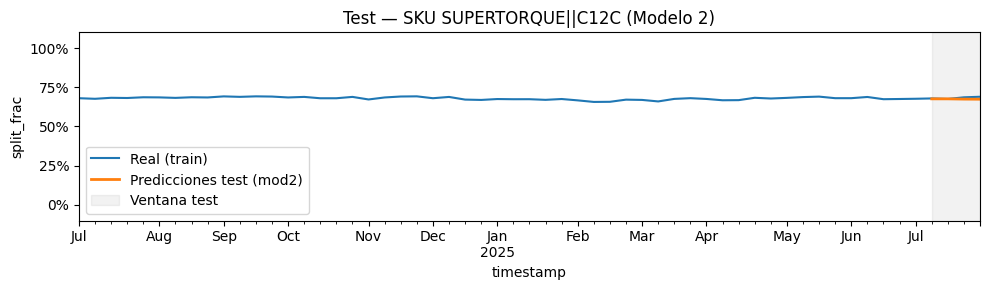

SKU: SV WIRE||EM_K60
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


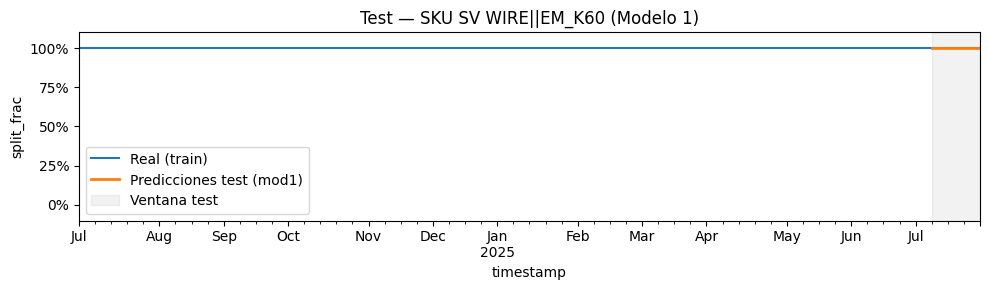

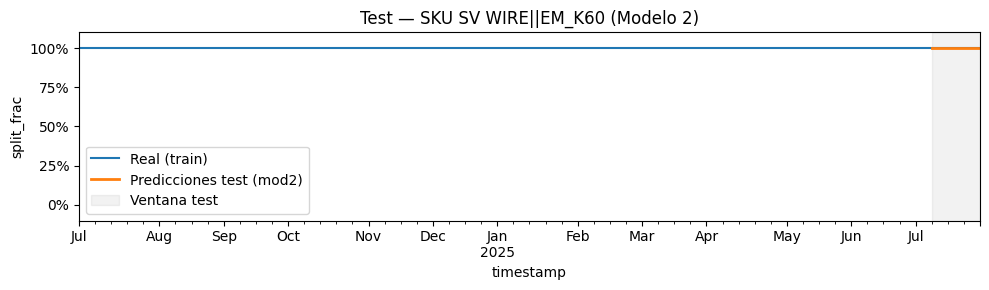

SKU: Selution SLR BTK 2-3.5||EM_O92
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


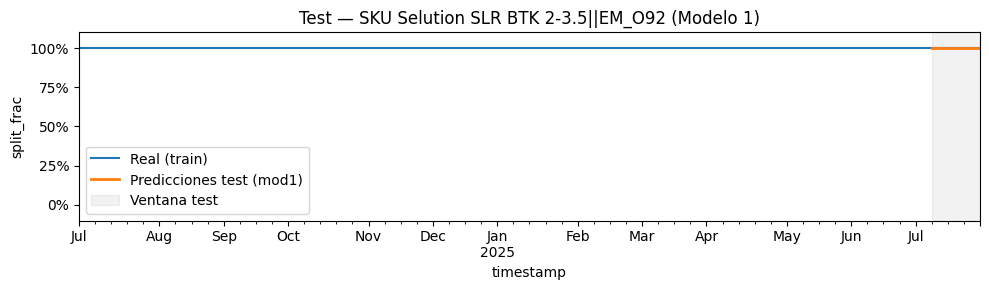

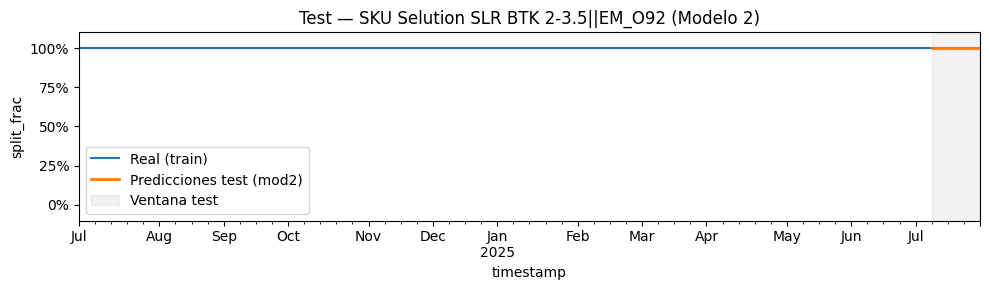

SKU: Selution SLR Coronary||EM_O92
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


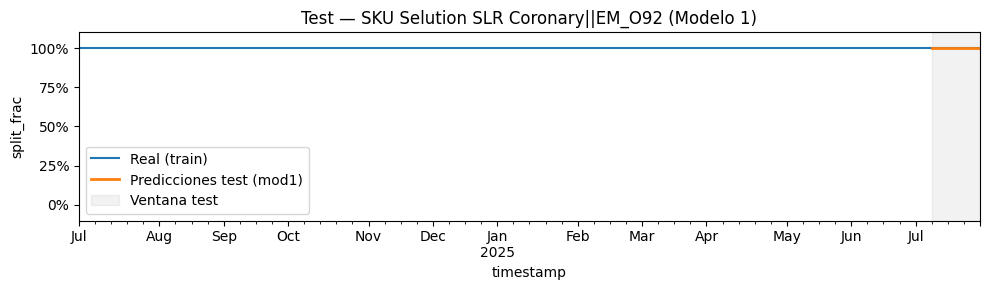

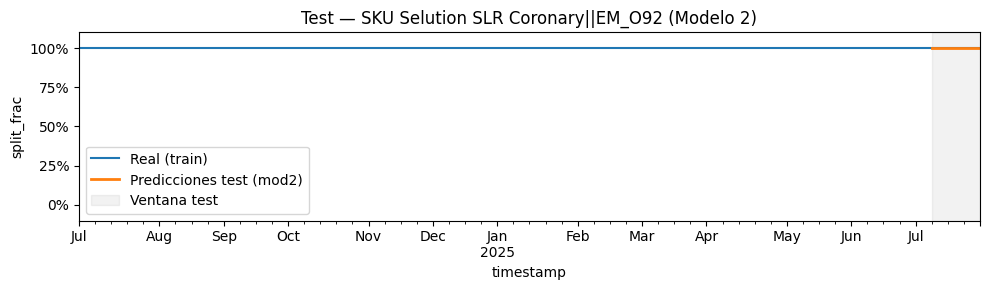

SKU: Selution SLR SFA 4-7||EM_O92
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


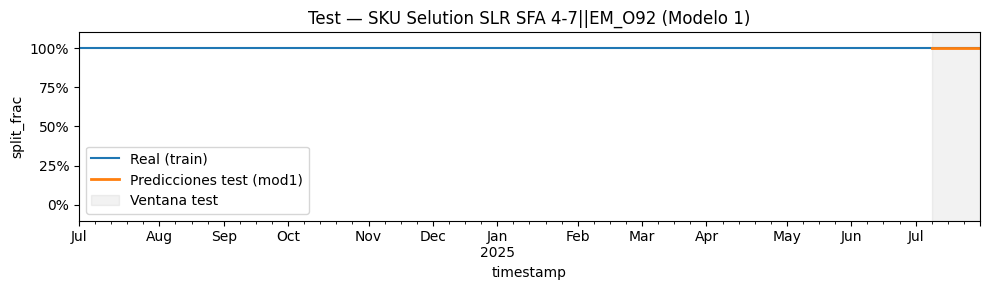

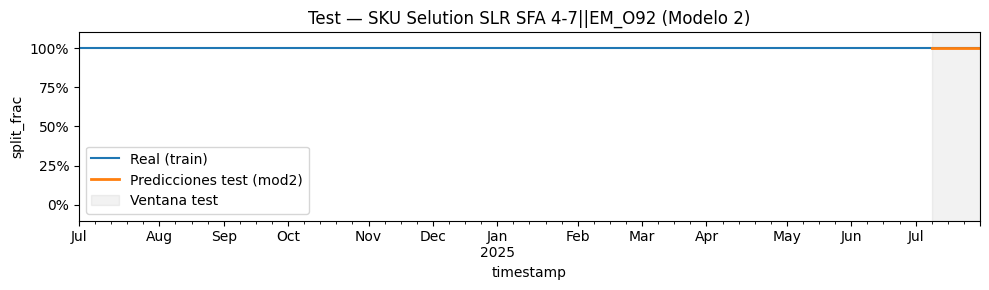

SKU: TEMPO (MODIFIED)||C05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


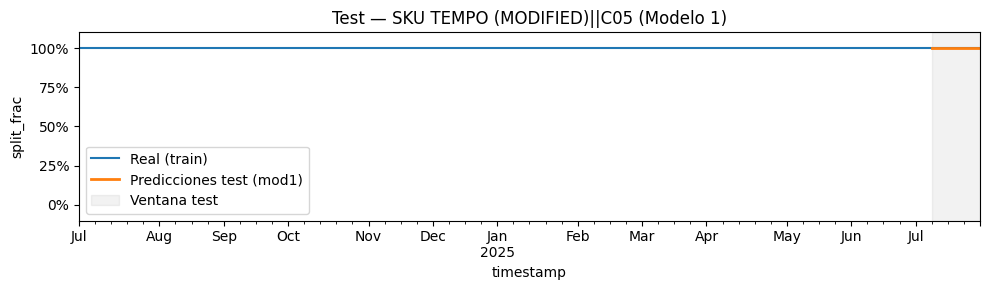

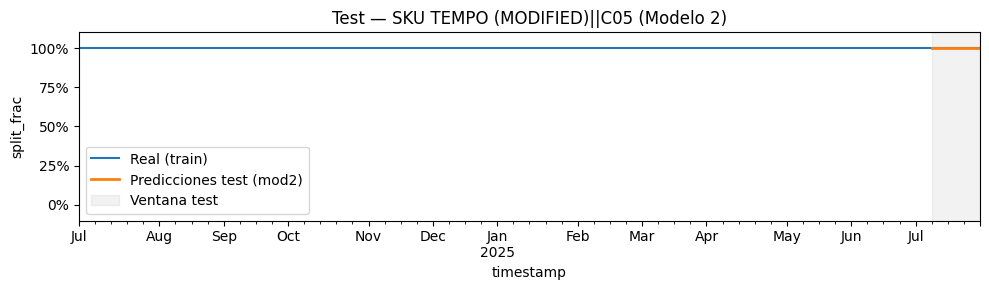

SKU: TEMPO AQUA (MODIFIED)||C05
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


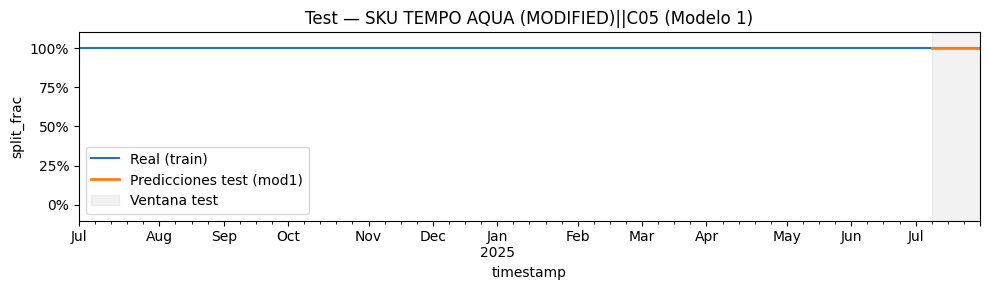

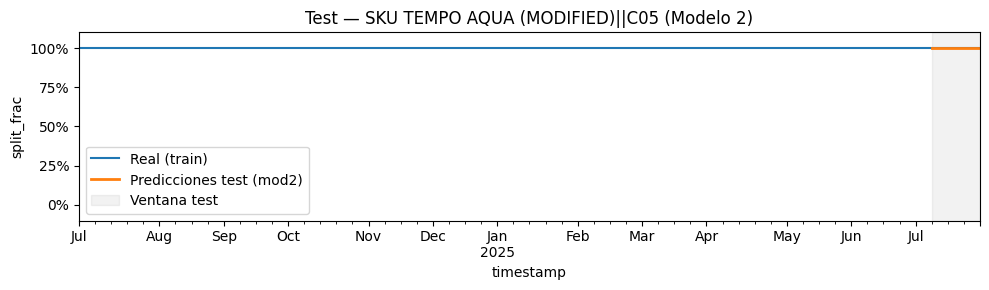

SKU: TEMPO AQUA||C03H
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


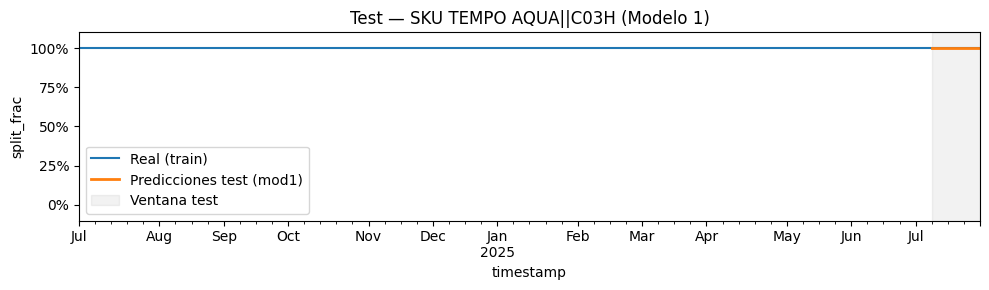

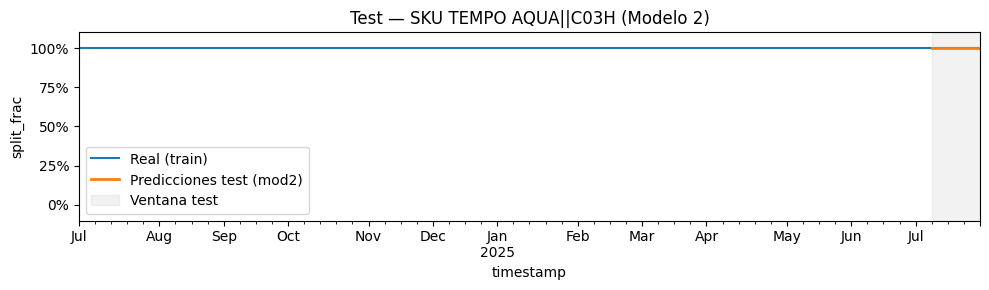

SKU: TEMPO||C03F
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.295590          0.305982         0.298109
2025-07-16        0.295508          0.303819         0.299414
2025-07-23        0.295508          0.307902         0.325883
2025-07-30        0.295508          0.307741         0.327137
MAE model1 (split_frac_hat): 0.017108
MAE model2 (split_frac_hat_A): 0.012414


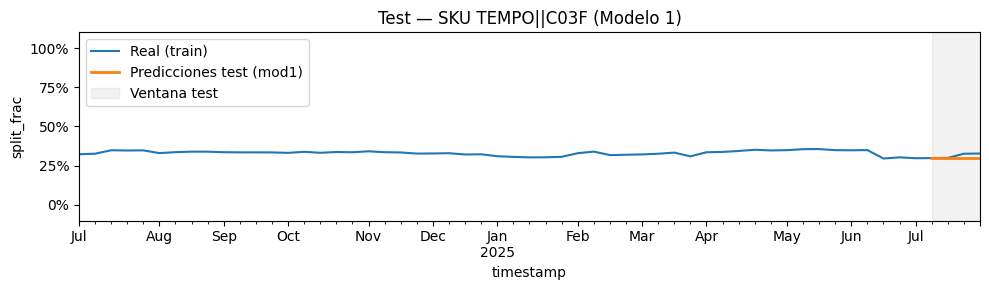

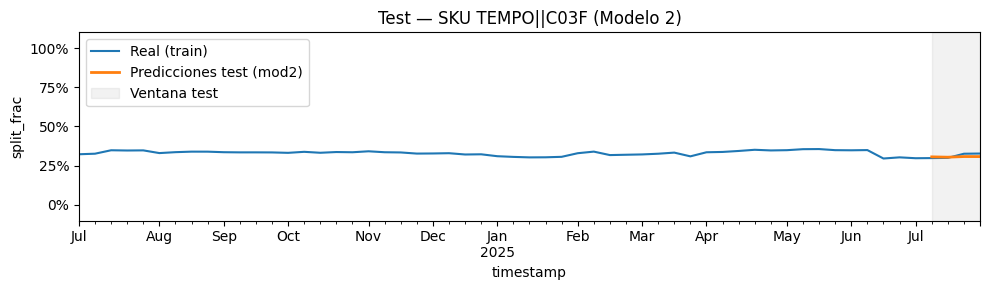

SKU: TEMPO||C03G
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.704410          0.694018         0.701891
2025-07-16        0.704492          0.696181         0.700586
2025-07-23        0.704492          0.692098         0.674117
2025-07-30        0.704492          0.692259         0.672863
MAE model1 (split_frac_hat): 0.017108
MAE model2 (split_frac_hat_A): 0.012414


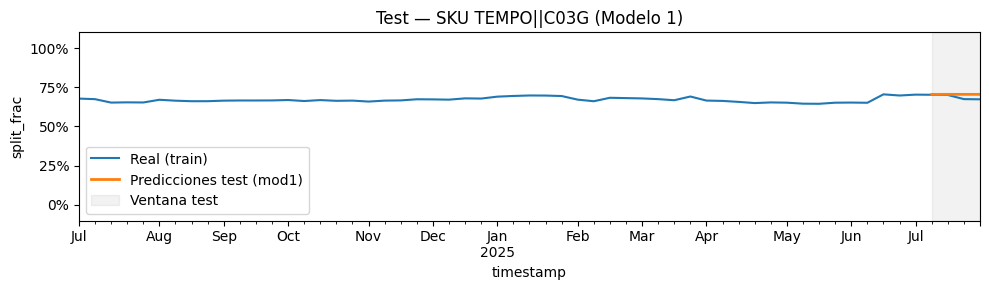

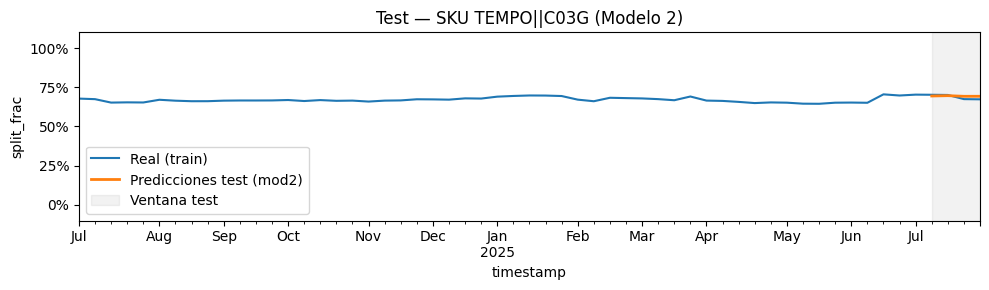

SKU: TRAPEASE||P00
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


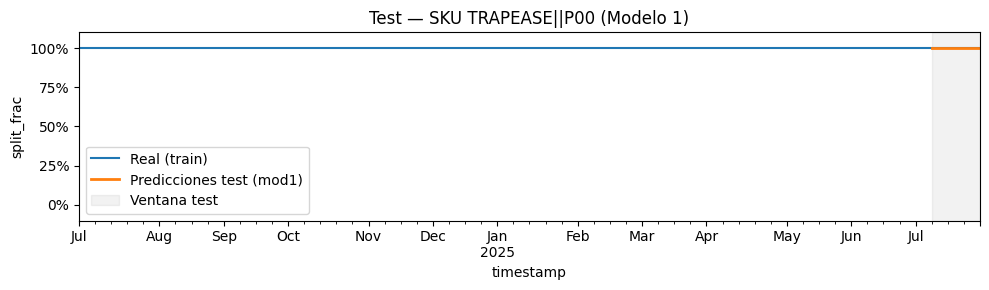

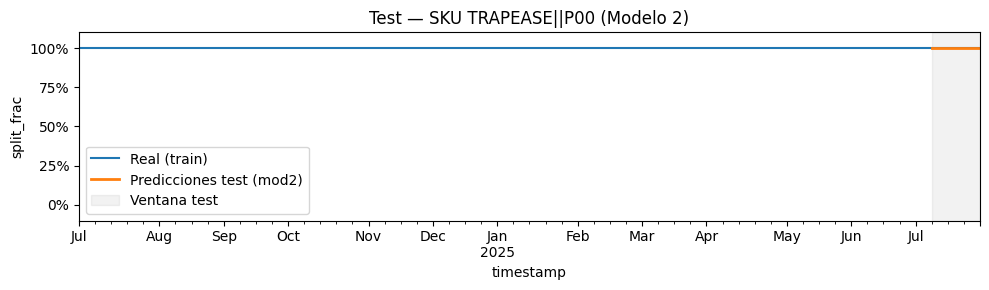

SKU: VASSALLO GT .014||EM_O90
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


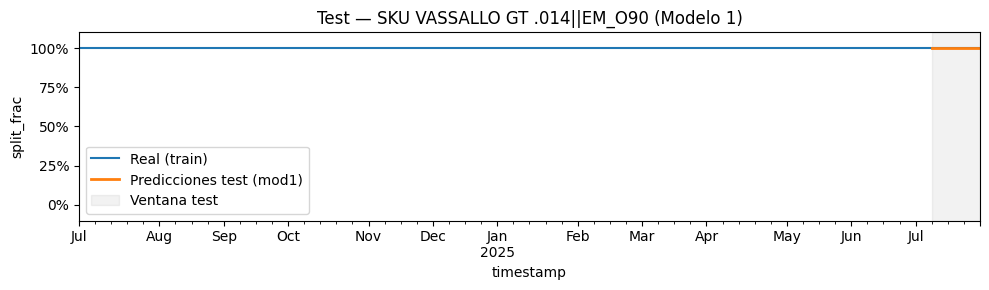

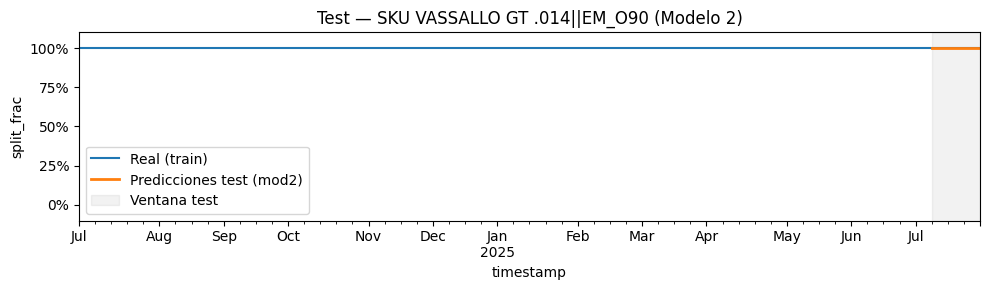

SKU: VASSALLO GT .018||EM_O90
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


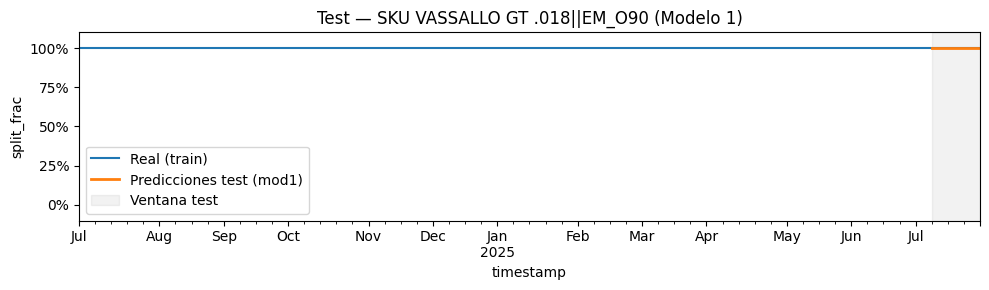

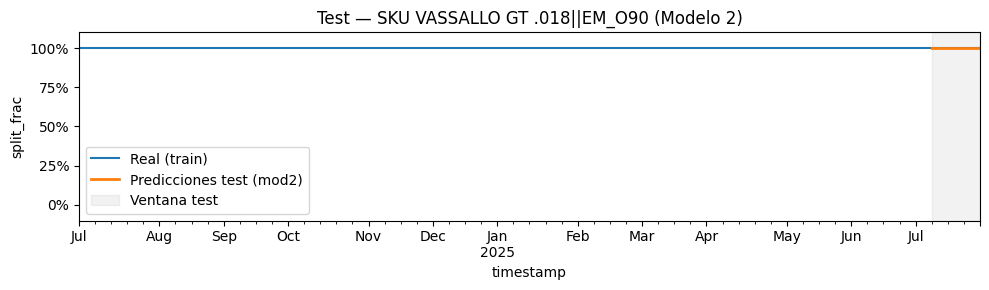

SKU: VESSEL DILATOR||A00B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


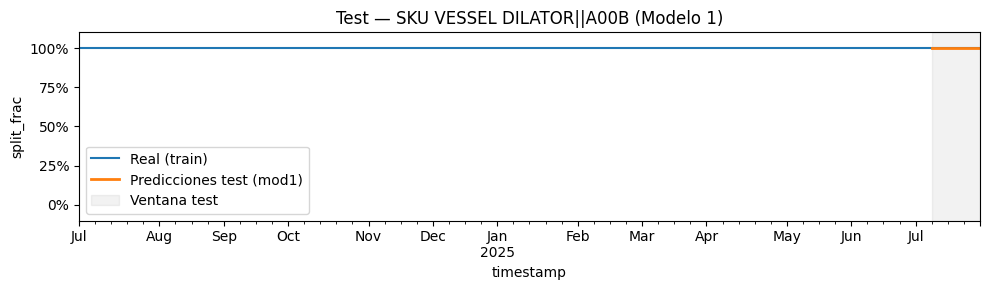

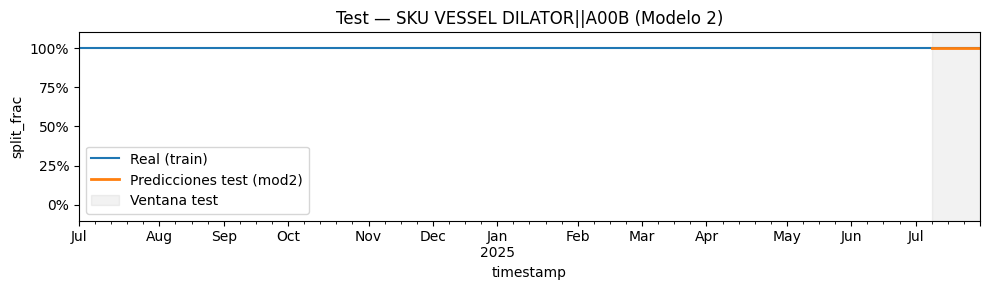

SKU: VISTA BRITE TIP (MODIFIED)||A01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.002669          0.002619              0.0
2025-07-16        0.002721          0.002501              0.0
2025-07-23        0.002631          0.002491              0.0
2025-07-30        0.002625          0.002429              0.0
MAE model1 (split_frac_hat): 0.002662
MAE model2 (split_frac_hat_A): 0.002510


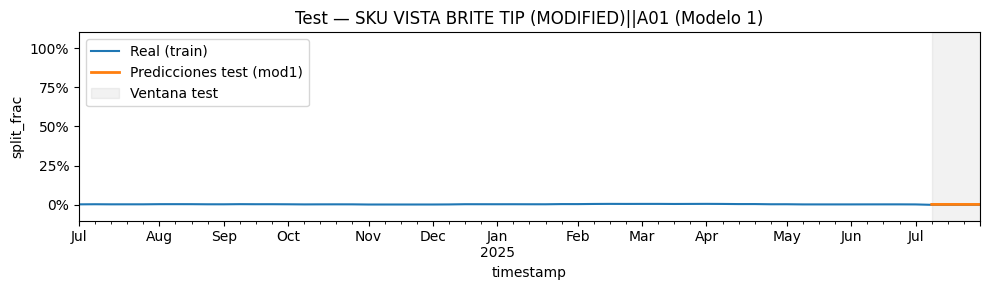

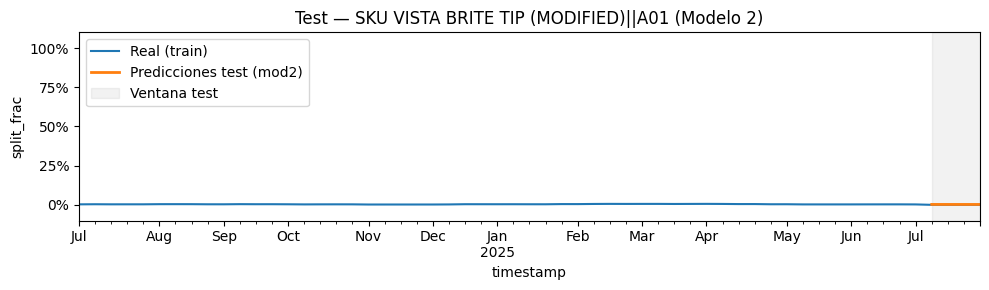

SKU: VISTA BRITE TIP (MODIFIED)||E00D
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.997330          0.997381              1.0
2025-07-16        0.997278          0.997159              1.0
2025-07-23        0.997368          0.996873              1.0
2025-07-30        0.997374          0.996678              1.0
MAE model1 (split_frac_hat): 0.002663
MAE model2 (split_frac_hat_A): 0.002978


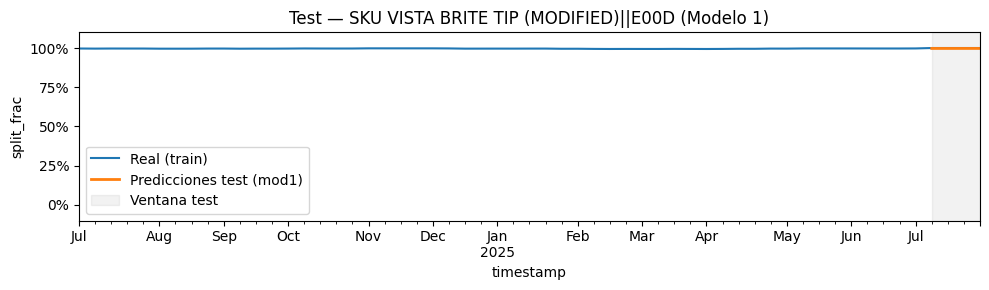

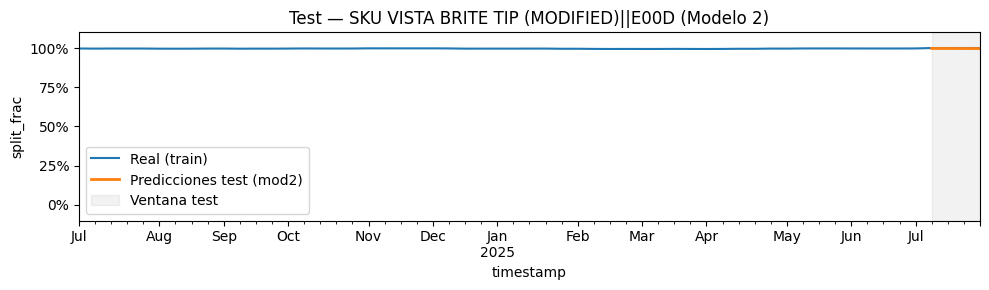

SKU: VISTA BRITE TIP||A01
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.004479          0.003951         0.004333
2025-07-16        0.004520          0.003747         0.004456
2025-07-23        0.004543          0.003538         0.003779
2025-07-30        0.004548          0.003431         0.003644
MAE model1 (split_frac_hat): 0.000469
MAE model2 (split_frac_hat_A): 0.000386


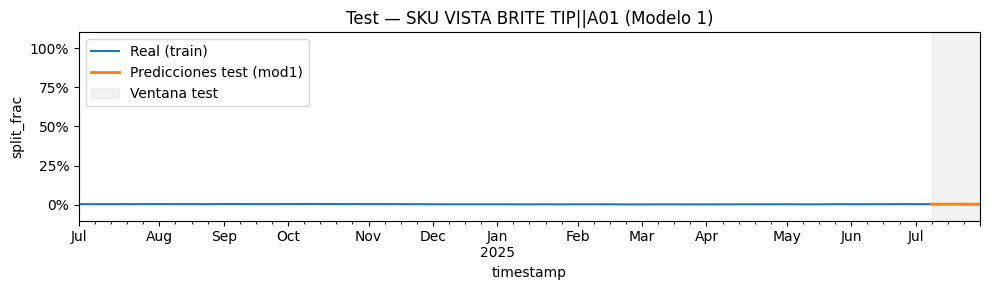

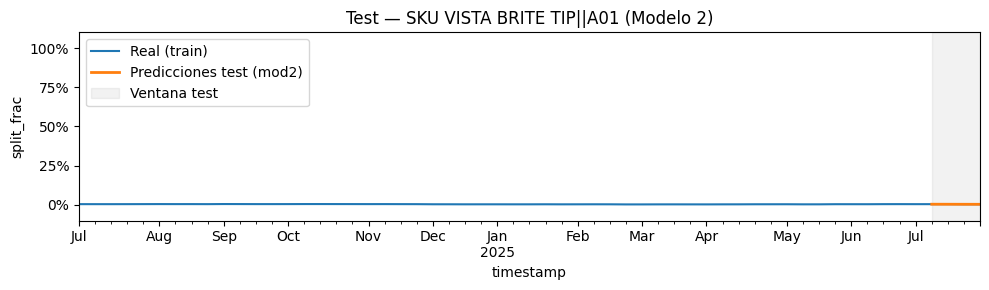

SKU: VISTA BRITE TIP||E00C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.000138          0.000690         0.000756
2025-07-16        0.000141          0.000712         0.000777
2025-07-23        0.000144          0.000803         0.002344
2025-07-30        0.000144          0.000855         0.002397
MAE model1 (split_frac_hat): 0.001427
MAE model2 (split_frac_hat_A): 0.000803


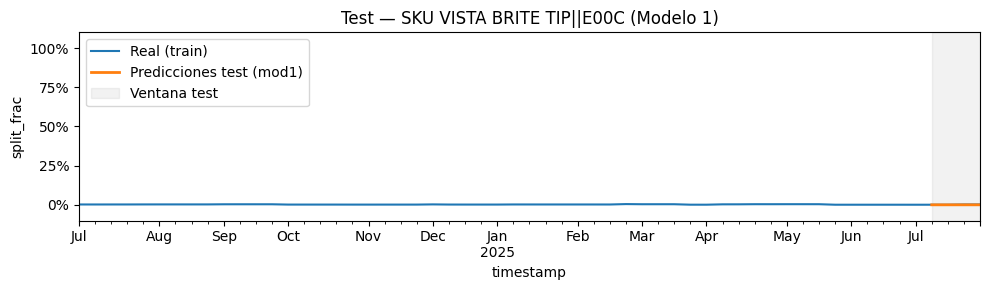

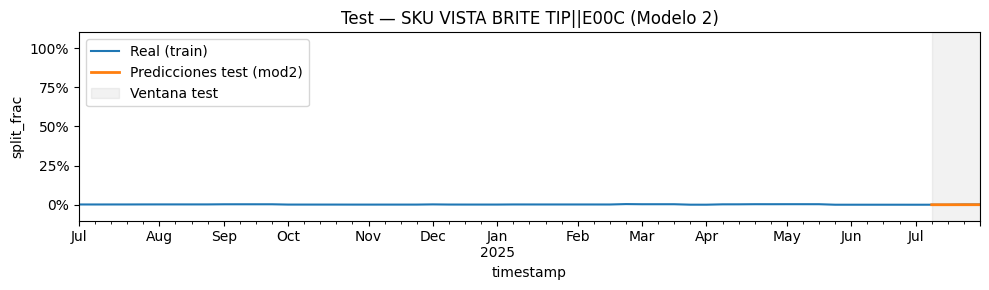

SKU: VISTA BRITE TIP||E01A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.025109          0.026409         0.023560
2025-07-16        0.024151          0.026963         0.022896
2025-07-23        0.024331          0.027618         0.024173
2025-07-30        0.024245          0.027393         0.024115
MAE model1 (split_frac_hat): 0.000773
MAE model2 (split_frac_hat_A): 0.003410


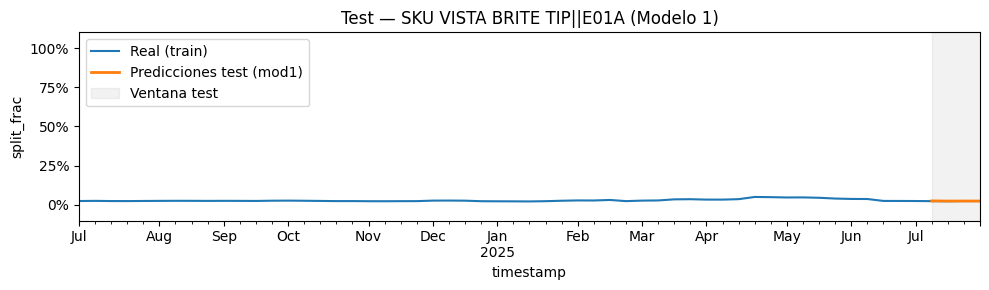

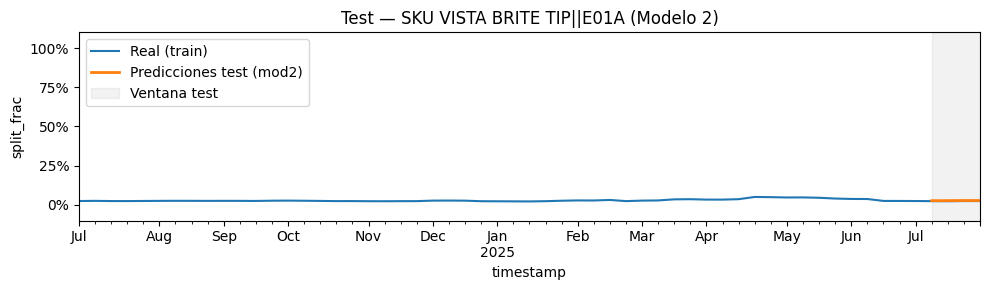

SKU: VISTA BRITE TIP||E01B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.546518          0.556462         0.544731
2025-07-16        0.551611          0.559719         0.553119
2025-07-23        0.554371          0.562668         0.545001
2025-07-30        0.555036          0.563840         0.548014
MAE model1 (split_frac_hat): 0.004922
MAE model2 (split_frac_hat_A): 0.012956


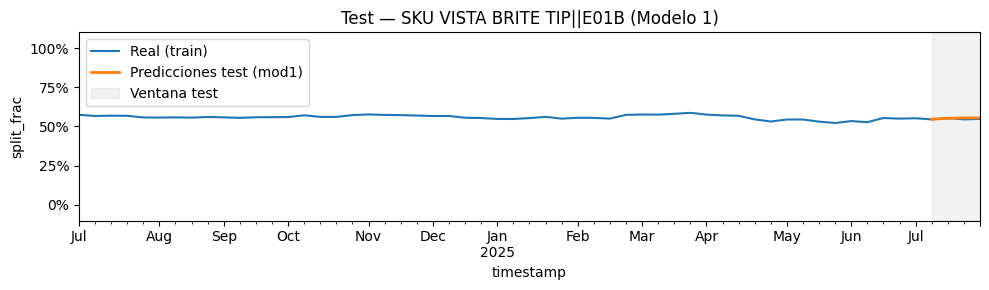

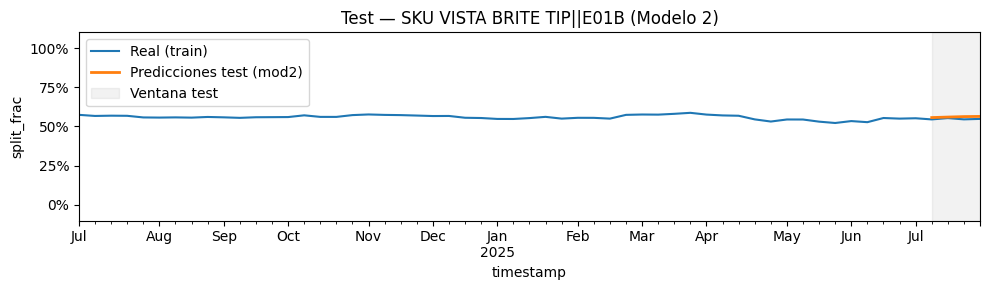

SKU: VISTA BRITE TIP||E02A
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.276209          0.267859         0.275546
2025-07-16        0.279396          0.267894         0.275295
2025-07-23        0.280794          0.265450         0.276944
2025-07-30        0.281131          0.262864         0.278510
MAE model1 (split_frac_hat): 0.002809
MAE model2 (split_frac_hat_A): 0.010557


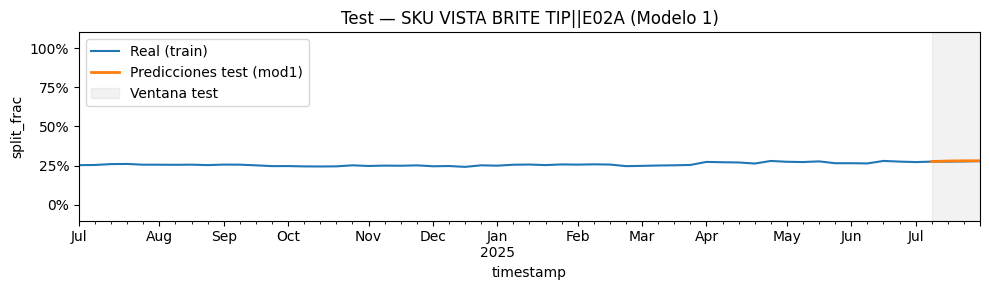

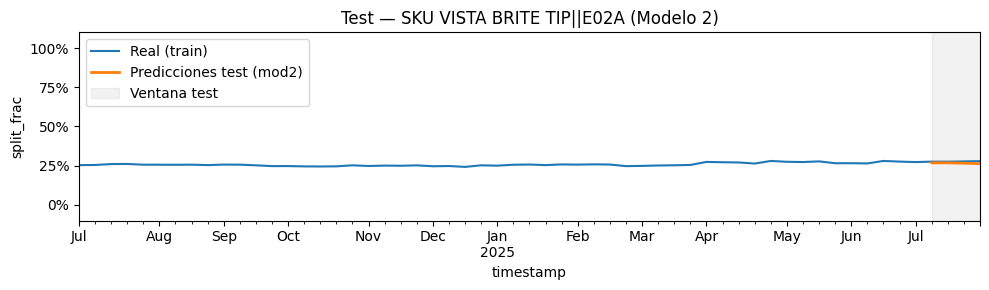

SKU: VISTA BRITE TIP||E02B
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.104684          0.101763         0.104579
2025-07-16        0.099943          0.097302         0.096514
2025-07-23        0.094932          0.095200         0.104326
2025-07-30        0.093961          0.095934         0.098050
MAE model1 (split_frac_hat): 0.004254
MAE model2 (split_frac_hat_A): 0.003711


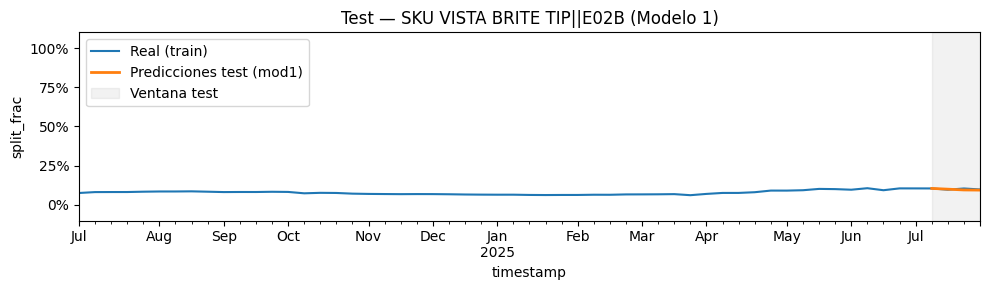

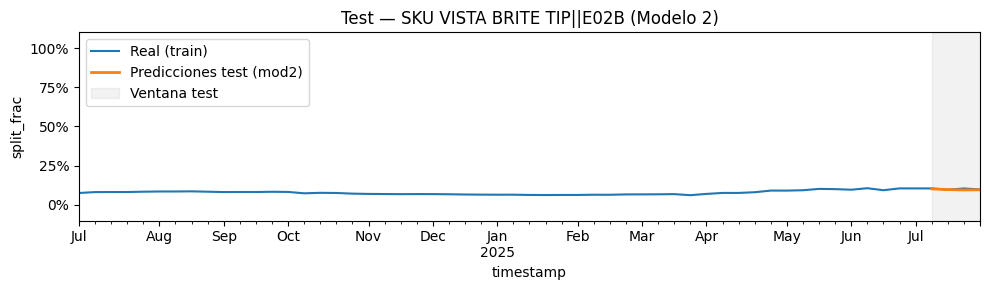

SKU: VISTA BRITE TIP||E02C
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.042864          0.042866         0.046497
2025-07-16        0.040238          0.043663         0.046942
2025-07-23        0.040886          0.044724         0.043432
2025-07-30        0.040935          0.045683         0.045270
MAE model1 (split_frac_hat): 0.004305
MAE model2 (split_frac_hat_A): 0.002154


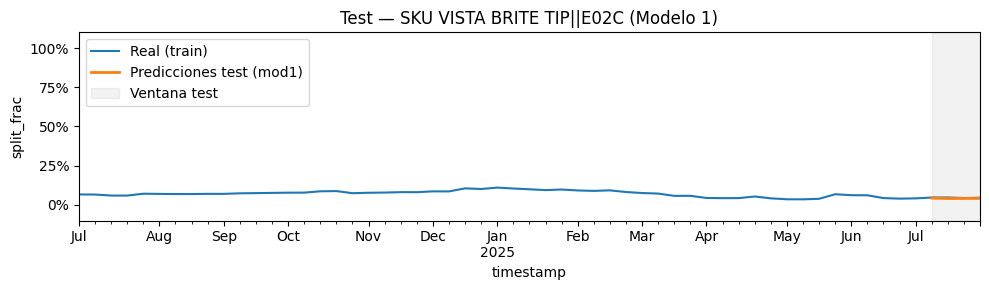

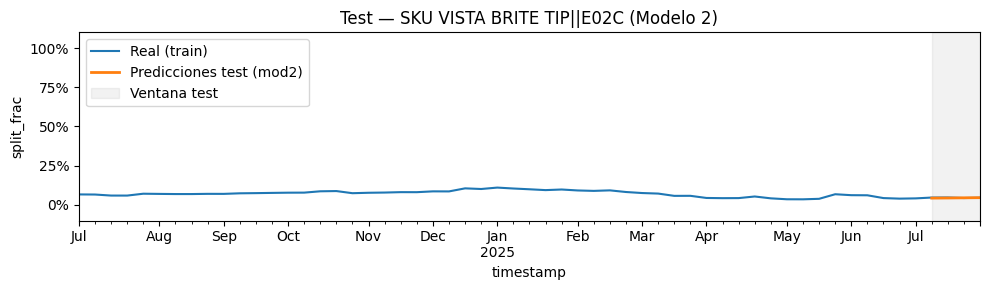

SKU: WIZDOM||EM_K60
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09        0.999999          0.999797              1.0
2025-07-16        0.999999          0.997195              1.0
2025-07-23        0.999999          0.993667              1.0
2025-07-30        0.999999          0.992971              1.0
MAE model1 (split_frac_hat): 0.000001
MAE model2 (split_frac_hat_A): 0.004093


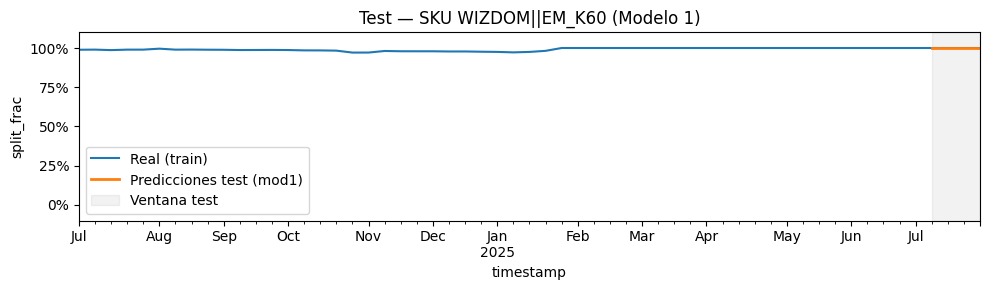

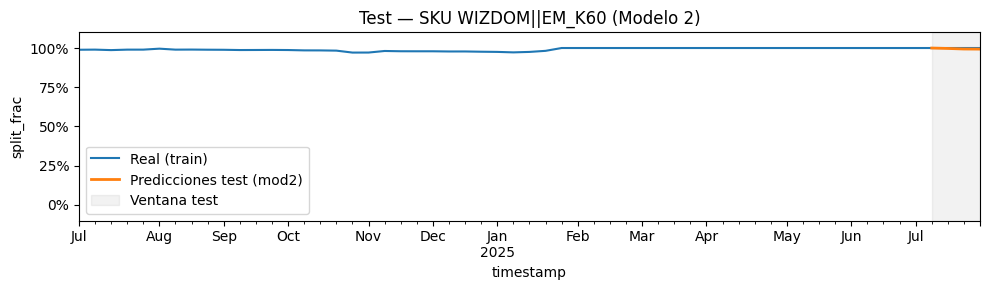

SKU: WIZDOM||EM_K60_NL
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09    8.961944e-07          0.000203              0.0
2025-07-16    8.961944e-07          0.002805              0.0
2025-07-23    8.961944e-07          0.006333              0.0
2025-07-30    8.961944e-07          0.007029              0.0
MAE model1 (split_frac_hat): 0.000001
MAE model2 (split_frac_hat_A): 0.004093


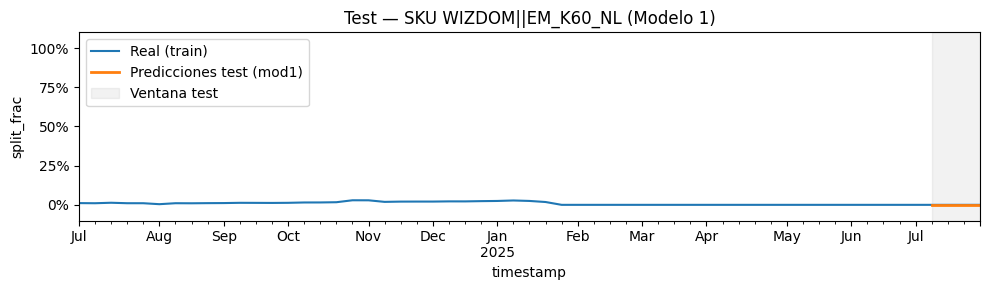

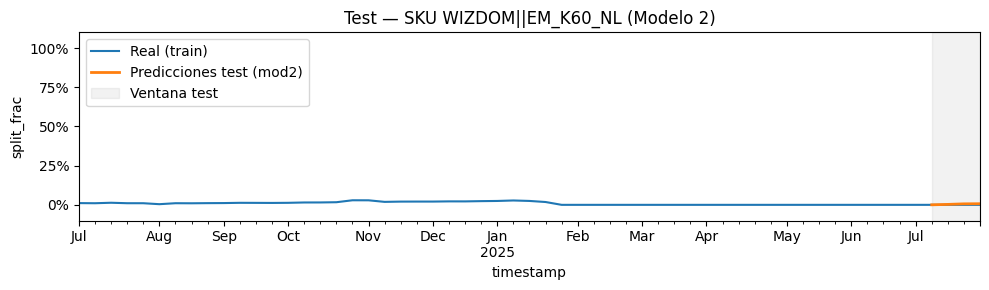

SKU: ZEPHYR||EM_O89
            split_frac_hat  split_frac_hat_A  split_frac_real
timestamp                                                    
2025-07-09             1.0               1.0              1.0
2025-07-16             1.0               1.0              1.0
2025-07-23             1.0               1.0              1.0
2025-07-30             1.0               1.0              1.0
MAE model1 (split_frac_hat): 0.000000
MAE model2 (split_frac_hat_A): 0.000000


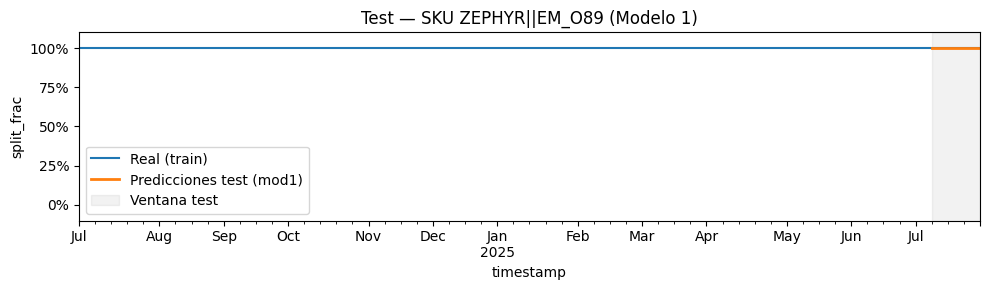

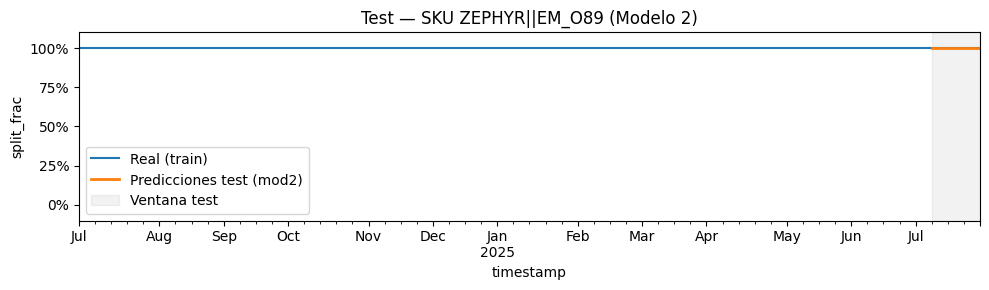

In [41]:
from matplotlib.ticker import PercentFormatter

df_input = df_input.sort_values(["series_id", "timestamp"]).copy()
all_skus = df_input["series_id"].unique()

# Filtra SKUs cuya serie real NO sea todo 0 ni todo 1
agg = df_input.groupby("series_id")["split_frac"].agg(min_val="min", max_val="max")
valid_skus = agg.loc[~((agg["min_val"].eq(0) & agg["max_val"].eq(0)) | (agg["min_val"].eq(1) & agg["max_val"].eq(1)))].index.tolist()

# SKUS TO PLOT
# skus_to_plot = np.random.choice(valid_skus, size=min(4, len(valid_skus)), replace=False)
skus_to_plot = np.array(valid_skus)
# skus_to_plot = all_skus

n_test_weeks = 4

for sku in skus_to_plot:
    # --- Predicciones para el SKU (ordenadas por tiempo) ---
    df_pred = (
        predictions.loc[predictions["level"].astype(str) == str(sku),
                        ["timestamp", "split_frac_hat", "split_frac", "split_frac_hat_A"]]
        .copy()
    )
    df_pred["timestamp"] = pd.to_datetime(df_pred["timestamp"])
    df_pred = df_pred.sort_values("timestamp").reset_index(drop=True)

    # --- Serie real completa del SKU ---
    s_full = (
        df_input.loc[df_input["series_id"] == sku, ["timestamp", "split_frac"]]
                .assign(timestamp=lambda d: pd.to_datetime(d["timestamp"]))
                .set_index("timestamp")["split_frac"]
                .sort_index()
                .clip(0, 1)
    )

    # Ventana de test (últimas n semanas de s_full)
    test_idx = s_full.index[-n_test_weeks:]

    # Alinear predicciones con la ventana de test si las longitudes coinciden
    pred1 = df_pred["split_frac_hat"].astype(float).clip(0, 1)
    pred2 = (
        df_pred["split_frac_hat_A"].astype(float).clip(0, 1)
        if "split_frac_hat_A" in df_pred.columns else pd.Series(dtype=float)
    )

    mae1 = np.nan
    mae2 = np.nan

    if len(pred1) == len(test_idx):
        ae1 = np.abs(pred1.values - s_full.loc[test_idx].values)
        mae1 = float(np.mean(ae1))

    if len(pred2) == len(test_idx):
        ae2 = np.abs(pred2.values - s_full.loc[test_idx].values)
        mae2 = float(np.mean(ae2))

    # --- Impresión de resúmenes ---
    print("SKU:", sku)
    tbl = pd.DataFrame(index=test_idx)
    if len(pred1) == len(test_idx):
        tbl["split_frac_hat"] = pred1.values
    if len(pred2) == len(test_idx):
        tbl["split_frac_hat_A"] = pred2.values
    tbl["split_frac_real"] = s_full.loc[test_idx].values
    print(tbl)

    if not np.isnan(mae1):
        print(f"MAE model1 (split_frac_hat): {mae1:.6f}")
    else:
        print("MAE model1: N/A (longitudes no coinciden)")

    if not np.isnan(mae2):
        print(f"MAE model2 (split_frac_hat_A): {mae2:.6f}")
    else:
        print("MAE model2: N/A (longitudes no coinciden o no hay columna)")

    # --- Gráfica Modelo 1 ---
    fig, ax = plt.subplots(figsize=(10, 3))
    s_full.plot(ax=ax, label="Real (train)")

    if len(pred1) == len(test_idx):
        # Usar Series de pandas para evitar el warning de conversor de fechas
        s_pred1 = pd.Series(pred1.values, index=test_idx, name="Predicciones test (mod1)")
        s_pred1.plot(ax=ax, linewidth=2, label="Predicciones test (mod1)")
        ax.axvspan(test_idx.min(), test_idx.max(), color="gray", alpha=0.1, label="Ventana test")

    ax.set_title(f"Test — SKU {sku} (Modelo 1)")
    ax.set_ylabel("split_frac")
    ax.set_ylim(-0.1, 1.1)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0))
    ax.legend()
    plt.tight_layout()
    plt.show()

    # --- Gráfica Modelo 2 ---
    fig, ax = plt.subplots(figsize=(10, 3))
    s_full.plot(ax=ax, label="Real (train)")

    if len(pred2) == len(test_idx):
        # Usar Series de pandas para evitar el warning de conversor de fechas
        s_pred2 = pd.Series(pred2.values, index=test_idx, name="Predicciones test (mod2)")
        s_pred2.plot(ax=ax, linewidth=2, label="Predicciones test (mod2)")
        ax.axvspan(test_idx.min(), test_idx.max(), color="gray", alpha=0.1, label="Ventana test")

    ax.set_title(f"Test — SKU {sku} (Modelo 2)")
    ax.set_ylabel("split_frac")
    ax.set_ylim(-0.1, 1.1)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0))
    ax.legend()
    plt.tight_layout()
    plt.show()


In [42]:
filter = predictions[predictions['split_frac']==0]
filter.head(30)

,timestamp,level,pred,y,abs_error,Brand,split_frac,p_raw,split_frac_hat,split_pct_hat,frac_error,split_frac_hat_A
8,2025-07-09,ATW WIRE MARKER||EM_L51_NL,-13.787692,-13.81551,0.027818,ATW WIRE MARKER,0.0,1.028209e-06,1.028209e-06,0.000103,1.028209e-06,0.000037
54,2025-07-09,MULTIPACK (MODIFIED)||C05,-13.772466,-13.81551,0.043044,MULTIPACK (MODIFIED),0.0,1.043984e-06,1.043984e-06,0.000104,1.043984e-06,0.000000
60,2025-07-09,NEEDLE||EM_O02_NL,-13.784727,-13.81551,0.030783,NEEDLE,0.0,1.031262e-06,1.026870e-06,0.000103,1.026870e-06,0.000000
104,2025-07-09,SUPERTORQUE PLUS||C04B,-13.804965,-13.81551,0.010545,SUPERTORQUE PLUS,0.0,1.010601e-06,1.018384e-06,0.000102,1.018384e-06,0.000000
126,2025-07-09,VISTA BRITE TIP (MODIFIED)||A00B,-13.818215,-13.81551,0.002706,VISTA BRITE TIP (MODIFIED),0.0,9.972979e-07,9.978841e-07,0.000100,9.978841e-07,0.000000
127,2025-07-09,VISTA BRITE TIP (MODIFIED)||A01,-5.924144,-13.81551,7.891365,VISTA BRITE TIP (MODIFIED),0.0,2.666963e-03,2.668531e-03,0.266853,2.668531e-03,0.002619
137,2025-07-09,WIZDOM||EM_K60_NL,-13.925108,-13.81551,0.109598,WIZDOM,0.0,8.961943e-07,8.961944e-07,0.000090,8.961944e-07,0.000203
147,2025-07-16,ATW WIRE MARKER||EM_L51_NL,-13.774042,-13.81551,0.041468,ATW WIRE MARKER,0.0,1.042340e-06,1.042340e-06,0.000104,1.042340e-06,0.000053
193,2025-07-16,MULTIPACK (MODIFIED)||C05,-13.758816,-13.81551,0.056694,MULTIPACK (MODIFIED),0.0,1.058331e-06,1.058331e-06,0.000106,1.058331e-06,0.000000
199,2025-07-16,NEEDLE||EM_O02_NL,-13.771077,-13.81551,0.044433,NEEDLE,0.0,1.045435e-06,1.040223e-06,0.000104,1.040223e-06,0.000023
